In [1]:
# Chapter 4 - Improving the models
# Classify cat and dog pictures with SVM
import os
import numpy as np
import sklearn as sk
from sklearn.svm import SVC

In [2]:
# PIL compatibility layer with Pillow-PIL
from PIL import Image
from PIL import ImageFilter

In [3]:
# Get access to the training and testing images
dataset_training_dir = 'datasets/cats_vs_dogs/train'
dataset_test_dir = 'datasets/cats_vs_dogs/test1'
train_images = [item for item in os.listdir(dataset_training_dir)]
test_images = [item for item in os.listdir(dataset_test_dir)]
print("#{} training images, and #{} testing images.\nSample training file '{}'\nSample testing file '{}'".format(len(train_images), len(test_images), train_images[0], test_images[0]))

#25000 training images, and #12500 testing images.
Sample training file 'dog.8011.jpg'
Sample testing file '9733.jpg'


In [4]:
# We go for a labels list
labels = []
for i in train_images:
    if 'dog' in i:
        labels.append(1)
    else:
        labels.append(0)

In [5]:
# Print a labeling sample
print("Labeling Sample: {}".format(labels[0:10]))

Labeling Sample: [1, 0, 1, 0, 0, 0, 1, 0, 0, 1]


In [6]:
# Extracting features using the PILLOW library
features = []
pixel_value = 0

In [7]:
# Feature extraction
for item in train_images:
    print("---> Feature extraction for image '{}'".format(item))
    print("\tConvert with mysterious 'L' parameter...")
    im = Image.open(os.path.join(dataset_training_dir, item)).convert('L')
    size = 64, 64
    print("\tResize '{}'".format(size))
    im = im.resize(size, Image.ANTIALIAS)
    print("\tFind Edges")
    im = im.filter(ImageFilter.FIND_EDGES)
    print("\tCompute histogram of image")
    pixel_value = im.histogram()
    print("\tAppend pixel value histogram to features")
    features.append(pixel_value)
    print("\tPixel value histogram size '{}', sample '{}'".format(len(pixel_value), pixel_value[:10]))

---> Feature extraction for image 'dog.8011.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1844, 27, 30, 26, 34, 30, 33, 34, 26, 28]'
---> Feature extraction for image 'cat.5077.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2303, 32, 15, 17, 12, 22, 16, 18, 17, 16]'
---> Feature extraction for image 'dog.7322.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1853, 26, 32, 31, 37, 39, 27, 34, 33, 28]'
---> Feature extraction for image 'cat.2718.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1798, 23, 39, 24, 30, 30, 24, 21, 25, 27]'
---> Feature extraction for image 'dog.5521.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1896, 55, 69, 60, 53, 65, 41, 41, 50, 46]'
---> Feature extraction for image 'cat.7674.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2016, 56, 26, 35, 32, 36, 30, 39, 28, 34]'
---> Feature extraction for image 'cat.8547.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1991, 30, 39, 33, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2103, 80, 49, 58, 61, 48, 41, 47, 42, 30]'
---> Feature extraction for image 'cat.6230.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 40, 41, 29, 37, 23, 38, 30, 41, 33]'
---> Feature extraction for image 'dog.2514.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 56, 41, 68, 55, 46, 43, 48, 36, 49]'
---> Feature extraction for image 'dog.11894.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 15, 22, 14,

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1951, 25, 37, 19, 14, 29, 22, 32, 26, 27]'
---> Feature extraction for image 'cat.10186.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1995, 47, 41, 48, 43, 40, 38, 44, 31, 36]'
---> Feature extraction for image 'dog.3193.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1908, 31, 29, 41, 38, 28, 28, 33, 18, 32]'
---> Feature extraction for image 'cat.8584.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1824, 30, 26, 20, 26, 19, 17, 25, 31, 31]'
---> 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1867, 49, 32, 34, 54, 45, 29, 47, 38, 35]'
---> Feature extraction for image 'dog.3811.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 35, 22, 32, 26, 38, 21, 29, 20, 15]'
---> Feature extraction for image 'dog.10591.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1816, 54, 51, 74, 55, 75, 67, 65, 61, 54]'
---> Feature extraction for image 'cat.7853.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2647, 185, 60, 30

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1946, 51, 71, 75, 63, 61, 59, 58, 59, 58]'
---> Feature extraction for image 'dog.5045.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2045, 36, 30, 45, 24, 39, 30, 42, 33, 30]'
---> Feature extraction for image 'cat.7310.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1765, 54, 44, 52, 47, 46, 53, 51, 47, 39]'
---> Feature extraction for image 'cat.12236.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1975, 43, 20, 30,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1787, 13, 17, 16, 7, 13, 16, 18, 17, 14]'
---> Feature extraction for image 'cat.2532.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1879, 57, 51, 48, 46, 49, 39, 42, 47, 38]'
---> Feature extraction for image 'dog.7108.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1850, 16, 16, 12, 12, 13, 9, 10, 11, 11]'
---> Feature extraction for image 'dog.12147.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2042, 19, 17, 17, 27, 15, 17, 19, 19, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2019, 44, 50, 32, 51, 42, 32, 27, 27, 31]'
---> Feature extraction for image 'cat.8786.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2081, 28, 32, 29, 34, 38, 22, 26, 30, 20]'
---> Feature extraction for image 'cat.9498.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1834, 68, 65, 70, 58, 59, 51, 51, 59, 56]'
---> Feature extraction for image 'dog.3391.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 38, 35, 40, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 15, 19, 20, 14, 14, 8, 15, 14, 23]'
---> Feature extraction for image 'cat.4779.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1872, 143, 113, 148, 104, 95, 82, 76, 56, 43]'
---> Feature extraction for image 'dog.1343.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1852, 47, 66, 62, 65, 54, 66, 46, 54, 34]'
---> Feature extraction for image 'cat.3016.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1897, 52, 49, 48, 44, 52, 49, 57, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1829, 23, 31, 29, 29, 31, 26, 38, 38, 29]'
---> Feature extraction for image 'dog.11506.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1909, 37, 24, 25, 39, 31, 21, 19, 30, 25]'
---> Feature extraction for image 'cat.1615.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1787, 24, 33, 32, 35, 26, 33, 43, 34, 27]'
---> Feature extraction for image 'dog.3540.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1884, 13, 13, 16, 20, 13, 13, 14, 21

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1954, 13, 9, 11, 13, 9, 4, 14, 8, 9]'
---> Feature extraction for image 'dog.6404.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 37, 30, 31, 26, 39, 31, 32, 26, 21]'
---> Feature extraction for image 'cat.4751.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 30, 35, 32, 28, 36, 35, 36, 37, 36]'
---> Feature extraction for image 'cat.11677.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 19, 11, 25, 21, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1969, 27, 35, 38, 34, 22, 25, 34, 30, 17]'
---> Feature extraction for image 'dog.5864.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1896, 29, 35, 40, 40, 29, 27, 32, 36, 36]'
---> Feature extraction for image 'cat.1198.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 54, 63, 57, 58, 61, 58, 63, 62, 40]'
---> Feature extraction for image 'cat.8802.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2055, 25, 33, 25, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 12, 15, 10, 20, 7, 17, 13, 13, 12]'
---> Feature extraction for image 'cat.5665.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 16, 21, 14, 25, 12, 20, 12, 19, 9]'
---> Feature extraction for image 'dog.7530.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 51, 51, 36, 44, 39, 29, 49, 32, 31]'
---> Feature extraction for image 'dog.12219.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 34, 43, 41, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2035, 17, 29, 24, 23, 17, 19, 27, 12, 21]'
---> Feature extraction for image 'dog.9247.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 24, 22, 20, 16, 19, 25, 22, 19, 25]'
---> Feature extraction for image 'cat.2888.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1952, 18, 22, 23, 14, 21, 16, 16, 20, 25]'
---> Feature extraction for image 'cat.11307.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1844, 65, 69, 51,

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 98, 92, 72, 87, 71, 61, 49, 50, 46]'
---> Feature extraction for image 'dog.7295.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1911, 19, 29, 27, 18, 23, 36, 35, 20, 29]'
---> Feature extraction for image 'cat.2877.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2003, 27, 31, 37, 37, 29, 23, 28, 22, 25]'
---> Feature extraction for image 'dog.8818.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 48, 63, 63, 50, 53, 45, 45, 45, 53]'
---> F

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 45, 66, 53, 54, 46, 44, 50, 41, 26]'
---> Feature extraction for image 'dog.10397.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 44, 43, 32, 40, 47, 33, 38, 20, 29]'
---> Feature extraction for image 'dog.11089.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1993, 17, 14, 12, 19, 15, 15, 15, 13, 19]'
---> Feature extraction for image 'cat.7933.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2107, 53, 60, 68

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1967, 54, 47, 56, 52, 55, 42, 46, 53, 46]'
---> Feature extraction for image 'cat.7098.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1964, 40, 43, 32, 37, 24, 32, 22, 35, 26]'
---> Feature extraction for image 'dog.3964.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1981, 38, 34, 27, 27, 23, 31, 39, 38, 25]'
---> Feature extraction for image 'cat.6386.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1953, 31, 30, 45, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 44, 44, 45, 42, 33, 45, 33, 43, 34]'
---> Feature extraction for image 'dog.8825.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1983, 36, 44, 33, 43, 36, 40, 36, 38, 38]'
---> Feature extraction for image 'cat.5843.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 53, 80, 80, 65, 75, 69, 68, 40, 50]'
---> Feature extraction for image 'dog.11936.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1962, 15, 15, 14, 14, 19, 18, 13, 14

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1874, 59, 69, 50, 48, 52, 46, 37, 38, 45]'
---> Feature extraction for image 'dog.628.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2001, 27, 33, 25, 23, 42, 38, 39, 41, 25]'
---> Feature extraction for image 'dog.3019.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1954, 32, 36, 25, 29, 39, 24, 27, 22, 25]'
---> Feature extraction for image 'cat.6423.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 57, 53, 52, 5

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 91, 91, 94, 113, 92, 86, 92, 82, 79]'
---> Feature extraction for image 'cat.10756.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 52, 33, 46, 34, 40, 34, 29, 38, 31]'
---> Feature extraction for image 'cat.5670.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1829, 34, 35, 47, 49, 36, 39, 34, 27, 41]'
---> Feature extraction for image 'dog.7525.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1837, 33, 32, 37, 32, 25, 29, 22, 24, 38]'
--->

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2061, 39, 38, 49, 44, 32, 25, 45, 35, 36]'
---> Feature extraction for image 'dog.5871.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1768, 46, 61, 46, 51, 54, 43, 40, 40, 52]'
---> Feature extraction for image 'cat.370.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2079, 124, 120, 128, 97, 86, 62, 74, 55, 42]'
---> Feature extraction for image 'cat.2484.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 68, 50, 54, 63, 54, 52, 48, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2097, 19, 26, 16, 36, 22, 17, 21, 23, 26]'
---> Feature extraction for image 'dog.10802.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2056, 83, 79, 97, 62, 61, 59, 72, 64, 48]'
---> Feature extraction for image 'dog.3582.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1941, 39, 22, 33, 26, 31, 21, 29, 24, 28]'
---> Feature extraction for image 'dog.2844.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 38, 27, 27,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1983, 8, 17, 11, 10, 18, 13, 13, 9, 16]'
---> Feature extraction for image 'dog.9736.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1999, 46, 42, 33, 34, 32, 36, 33, 34, 27]'
---> Feature extraction for image 'dog.12026.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 15, 17, 11, 23, 22, 20, 14, 28, 19]'
---> Feature extraction for image 'cat.2335.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2085, 34, 29, 45, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1851, 63, 52, 45, 41, 44, 28, 28, 26, 18]'
---> Feature extraction for image 'dog.10619.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2029, 30, 28, 24, 25, 30, 30, 27, 21, 22]'
---> Feature extraction for image 'dog.5130.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2045, 40, 39, 36, 35, 40, 35, 35, 32, 30]'
---> Feature extraction for image 'cat.7265.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1963, 38, 33, 50,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 48, 39, 39, 33, 52, 51, 36, 39, 34]'
---> Feature extraction for image 'dog.7874.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1768, 61, 50, 47, 43, 40, 45, 45, 41, 47]'
---> Feature extraction for image 'cat.3188.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1857, 23, 38, 26, 36, 24, 22, 19, 28, 27]'
---> Feature extraction for image 'cat.1947.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 26, 16, 23, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2006, 32, 36, 28, 26, 32, 33, 31, 29, 26]'
---> Feature extraction for image 'cat.4142.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1899, 58, 75, 67, 67, 68, 59, 49, 54, 53]'
---> Feature extraction for image 'dog.6217.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2045, 43, 39, 36, 45, 49, 31, 43, 33, 31]'
---> Feature extraction for image 'dog.9124.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 52, 36, 31, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2061, 67, 38, 42, 48, 44, 39, 24, 25, 30]'
---> Feature extraction for image 'cat.11070.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2136, 36, 25, 15, 13, 21, 26, 28, 24, 23]'
---> Feature extraction for image 'cat.3639.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 78, 59, 49, 52, 36, 47, 44, 39, 26]'
---> Feature extraction for image 'dog.6203.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 20, 24, 27,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 44, 39, 51, 56, 50, 55, 68, 38, 42]'
---> Feature extraction for image 'cat.5512.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1867, 31, 26, 25, 31, 36, 36, 37, 23, 36]'
---> Feature extraction for image 'dog.8212.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 35, 34, 29, 37, 31, 32, 25, 27, 28]'
---> Feature extraction for image 'cat.5274.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1903, 33, 35, 33, 24, 32, 30, 22, 29,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2094, 14, 11, 15, 10, 14, 14, 14, 14, 20]'
---> Feature extraction for image 'dog.7492.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1950, 35, 44, 32, 31, 20, 31, 24, 30, 20]'
---> Feature extraction for image 'dog.6954.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2157, 84, 63, 87, 48, 44, 43, 28, 29, 26]'
---> Feature extraction for image 'dog.5285.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1801, 61, 56, 80, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1863, 13, 17, 15, 18, 19, 20, 11, 23, 19]'
---> Feature extraction for image 'dog.9326.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 50, 37, 46, 29, 36, 30, 36, 29, 34]'
---> Feature extraction for image 'dog.6015.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1883, 56, 51, 51, 37, 47, 47, 36, 37, 37]'
---> Feature extraction for image 'cat.4340.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 29, 25, 29, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 14, 35, 25, 30, 21, 21, 18, 25, 23]'
---> Feature extraction for image 'cat.10622.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1902, 43, 46, 59, 38, 42, 43, 42, 32, 35]'
---> Feature extraction for image 'dog.1020.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1965, 41, 35, 47, 51, 34, 41, 32, 40, 43]'
---> Feature extraction for image 'cat.3375.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1908, 34, 32, 32,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2003, 78, 49, 74, 47, 43, 36, 41, 34, 26]'
---> Feature extraction for image 'dog.11665.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1872, 33, 36, 37, 43, 49, 40, 37, 38, 43]'
---> Feature extraction for image 'cat.6219.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1893, 24, 19, 17, 25, 16, 20, 15, 16, 20]'
---> Feature extraction for image 'cat.8544.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2055, 63, 48, 50, 50, 43, 49, 51, 36

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1863, 47, 36, 49, 48, 43, 55, 50, 45, 50]'
---> Feature extraction for image 'cat.10634.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2051, 69, 62, 57, 68, 65, 39, 49, 40, 41]'
---> Feature extraction for image 'cat.789.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 37, 33, 50, 52, 35, 34, 41, 43, 30]'
---> Feature extraction for image 'dog.7447.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 23, 26, 23, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2023, 29, 33, 27, 34, 32, 29, 27, 22, 21]'
---> Feature extraction for image 'dog.10551.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2027, 19, 20, 17, 17, 16, 14, 20, 13, 11]'
---> Feature extraction for image 'cat.979.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2004, 57, 59, 53, 52, 47, 49, 36, 42, 41]'
---> Feature extraction for image 'dog.9442.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 17, 28, 23, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 55, 48, 42, 47, 39, 33, 32, 30, 20]'
---> Feature extraction for image 'dog.7490.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 20, 25, 24, 26, 36, 28, 27, 19, 31]'
---> Feature extraction for image 'cat.986.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1789, 61, 64, 55, 47, 58, 50, 39, 42, 45]'
---> Feature extraction for image 'dog.6942.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2011, 48, 47, 56, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 27, 25, 31, 29, 27, 35, 35, 27, 22]'
---> Feature extraction for image 'dog.789.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2034, 45, 34, 39, 37, 39, 24, 33, 30, 31]'
---> Feature extraction for image 'cat.6582.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1964, 92, 86, 89, 75, 72, 60, 60, 46, 46]'
---> Feature extraction for image 'dog.951.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1836, 48, 43, 52, 50

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2004, 13, 10, 14, 16, 17, 18, 16, 13, 13]'
---> Feature extraction for image 'cat.10436.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2037, 37, 53, 41, 40, 42, 50, 45, 27, 45]'
---> Feature extraction for image 'cat.3161.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1973, 36, 28, 35, 37, 33, 40, 27, 29, 31]'
---> Feature extraction for image 'dog.1234.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 13, 26, 16,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1962, 67, 91, 71, 80, 69, 70, 55, 54, 67]'
---> Feature extraction for image 'cat.1992.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1893, 37, 44, 41, 43, 47, 44, 42, 45, 30]'
---> Feature extraction for image 'dog.10747.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 15, 17, 18, 17, 8, 11, 15, 13, 15]'
---> Feature extraction for image 'dog.2701.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2027, 14, 10, 13, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1786, 35, 38, 49, 35, 36, 31, 52, 34, 21]'
---> Feature extraction for image 'cat.4183.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2026, 71, 57, 68, 86, 54, 52, 55, 48, 42]'
---> Feature extraction for image 'cat.6794.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1732, 28, 35, 34, 34, 28, 40, 32, 29, 33]'
---> Feature extraction for image 'cat.8961.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 29, 31, 40, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1998, 73, 70, 73, 83, 69, 70, 47, 42, 59]'
---> Feature extraction for image 'cat.7501.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1902, 50, 50, 59, 40, 50, 55, 58, 45, 36]'
---> Feature extraction for image 'cat.8632.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1826, 39, 39, 37, 29, 37, 35, 25, 28, 28]'
---> Feature extraction for image 'cat.12427.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 71, 75, 72, 88, 53, 57, 40, 40

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1926, 25, 18, 32, 19, 22, 19, 18, 31, 21]'
---> Feature extraction for image 'dog.9734.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1939, 33, 30, 33, 18, 35, 29, 33, 29, 29]'
---> Feature extraction for image 'cat.11674.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1969, 15, 18, 11, 11, 12, 21, 10, 15, 10]'
---> Feature extraction for image 'dog.1368.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1992, 70, 61, 59, 46, 47, 37, 48, 48, 54]'
---> 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1867, 76, 67, 69, 72, 73, 58, 57, 47, 43]'
---> Feature extraction for image 'cat.3029.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1788, 55, 54, 61, 60, 54, 57, 50, 52, 49]'
---> Feature extraction for image 'cat.2337.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1857, 150, 144, 139, 121, 101, 97, 65, 60, 43]'
---> Feature extraction for image 'dog.12024.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2076, 65, 47

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 35, 20, 20, 32, 19, 23, 17, 18, 24]'
---> Feature extraction for image 'cat.3940.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 52, 55, 67, 38, 52, 45, 52, 42, 47]'
---> Feature extraction for image 'cat.2486.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1867, 64, 61, 63, 54, 69, 60, 60, 64, 48]'
---> Feature extraction for image 'cat.372.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 21, 19, 23, 20, 19, 22, 16, 23, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1853, 84, 99, 85, 97, 84, 57, 71, 49, 66]'
---> Feature extraction for image 'cat.7071.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1982, 27, 35, 43, 45, 38, 31, 49, 29, 36]'
---> Feature extraction for image 'dog.5324.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2063, 137, 114, 82, 72, 37, 34, 24, 26, 25]'
---> Feature extraction for image 'cat.12157.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1831, 32, 33, 4

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1847, 45, 47, 41, 47, 39, 41, 36, 48, 48]'
---> Feature extraction for image 'dog.8628.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 41, 44, 34, 50, 34, 30, 37, 36, 33]'
---> Feature extraction for image 'dog.12232.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1762, 25, 26, 26, 41, 39, 21, 38, 42, 33]'
---> Feature extraction for image 'cat.2121.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1962, 59, 78, 54, 61, 41, 43, 51, 36

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1872, 37, 27, 27, 33, 24, 32, 19, 28, 37]'
---> Feature extraction for image 'cat.10783.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1909, 73, 57, 69, 66, 76, 75, 63, 44, 59]'
---> Feature extraction for image 'dog.3796.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2021, 22, 34, 25, 24, 38, 33, 30, 27, 32]'
---> Feature extraction for image 'cat.8381.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 45, 45, 57,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2016, 42, 26, 50, 37, 39, 30, 38, 31, 23]'
---> Feature extraction for image 'cat.5698.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1900, 64, 57, 55, 62, 59, 52, 59, 46, 50]'
---> Feature extraction for image 'cat.4586.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1872, 21, 29, 24, 25, 18, 23, 26, 30, 25]'
---> Feature extraction for image 'cat.10966.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1836, 38, 31, 37,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1863, 23, 22, 20, 20, 22, 34, 20, 18, 24]'
---> Feature extraction for image 'cat.10972.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 61, 69, 70, 64, 60, 61, 49, 36, 37]'
---> Feature extraction for image 'cat.4592.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2016, 39, 30, 40, 40, 34, 38, 30, 32, 38]'
---> Feature extraction for image 'cat.5854.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1924, 77, 115, 91

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 57, 50, 51, 39, 42, 41, 38, 33, 42]'
---> Feature extraction for image 'cat.11305.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1795, 58, 57, 57, 53, 56, 44, 54, 58, 48]'
---> Feature extraction for image 'dog.1619.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 32, 29, 32, 30, 25, 30, 37, 36, 24]'
---> Feature extraction for image 'dog.6176.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 31, 40, 23,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1951, 31, 37, 28, 29, 24, 28, 26, 25, 11]'
---> Feature extraction for image 'cat.10769.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1827, 42, 51, 47, 50, 47, 51, 52, 43, 40]'
---> Feature extraction for image 'cat.2120.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1848, 54, 55, 54, 47, 46, 52, 46, 47, 36]'
---> Feature extraction for image 'dog.12233.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1884, 69, 58, 66

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1742, 45, 29, 42, 42, 48, 45, 47, 54, 33]'
---> Feature extraction for image 'cat.7702.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1985, 24, 28, 31, 18, 26, 15, 20, 18, 18]'
---> Feature extraction for image 'cat.8431.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2025, 46, 45, 53, 55, 33, 45, 38, 35, 49]'
---> Feature extraction for image 'dog.4991.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 37, 56, 40, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2020, 11, 18, 31, 28, 20, 28, 30, 18, 26]'
---> Feature extraction for image 'dog.9090.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1905, 64, 77, 66, 64, 80, 57, 52, 47, 54]'
---> Feature extraction for image 'cat.3799.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1932, 79, 86, 93, 92, 82, 74, 53, 47, 45]'
---> Feature extraction for image 'cat.6811.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2029, 34, 17, 35, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1981, 47, 36, 38, 32, 31, 29, 39, 41, 34]'
---> Feature extraction for image 'dog.9721.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 14, 21, 17, 17, 15, 16, 13, 13, 13]'
---> Feature extraction for image 'dog.6412.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1843, 34, 29, 28, 29, 26, 23, 25, 30, 22]'
---> Feature extraction for image 'cat.4747.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 110, 84, 54,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 22, 21, 30, 37, 28, 27, 20, 20, 26]'
---> Feature extraction for image 'dog.4577.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1924, 59, 44, 52, 47, 47, 55, 52, 54, 48]'
---> Feature extraction for image 'cat.6622.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1869, 95, 75, 91, 70, 72, 85, 51, 51, 40]'
---> Feature extraction for image 'cat.9511.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1875, 47, 50, 58, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1879, 52, 45, 48, 53, 50, 38, 44, 48, 39]'
---> Feature extraction for image 'dog.7724.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1939, 52, 56, 50, 42, 53, 41, 35, 27, 26]'
---> Feature extraction for image 'cat.11891.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 37, 41, 26, 25, 34, 22, 36, 28, 30]'
---> Feature extraction for image 'cat.5471.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2038, 56, 52, 48,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1943, 44, 40, 45, 46, 59, 40, 43, 34, 45]'
---> Feature extraction for image 'dog.7863.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 21, 24, 20, 30, 31, 33, 26, 19, 18]'
---> Feature extraction for image 'cat.2295.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2042, 30, 29, 50, 31, 36, 38, 31, 34, 28]'
---> Feature extraction for image 'cat.561.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1953, 18, 9, 13, 19

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 32, 38, 33, 35, 22, 39, 31, 34, 28]'
---> Feature extraction for image 'dog.3378.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1824, 29, 26, 32, 25, 19, 29, 27, 43, 23]'
---> Feature extraction for image 'dog.4417.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1833, 54, 54, 55, 55, 50, 66, 54, 47, 44]'
---> Feature extraction for image 'cat.6742.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 59, 45, 41, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1853, 47, 42, 59, 50, 56, 44, 39, 31, 29]'
---> Feature extraction for image 'dog.6214.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 21, 22, 22, 17, 26, 20, 25, 16, 30]'
---> Feature extraction for image 'dog.10034.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1805, 43, 43, 54, 31, 38, 38, 36, 42, 36]'
---> Feature extraction for image 'cat.7448.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1964, 50, 31, 37,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 34, 34, 41, 37, 40, 32, 31, 28, 29]'
---> Feature extraction for image 'dog.207.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2014, 44, 52, 58, 50, 54, 34, 31, 38, 32]'
---> Feature extraction for image 'dog.2728.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1873, 37, 39, 44, 38, 28, 40, 35, 43, 34]'
---> Feature extraction for image 'cat.12234.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1912, 25, 20, 21, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1798, 56, 48, 62, 61, 56, 46, 60, 61, 47]'
---> Feature extraction for image 'cat.763.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 39, 50, 42, 38, 42, 45, 41, 49, 39]'
---> Feature extraction for image 'dog.5292.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 93, 86, 85, 91, 87, 49, 57, 45, 47]'
---> Feature extraction for image 'cat.5908.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1915, 63, 60, 47, 5

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2017, 57, 48, 37, 42, 33, 28, 52, 39, 39]'
---> Feature extraction for image 'dog.2264.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1967, 37, 38, 52, 43, 45, 47, 46, 40, 37]'
---> Feature extraction for image 'dog.993.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 34, 34, 30, 35, 32, 23, 38, 32, 35]'
---> Feature extraction for image 'dog.10222.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2044, 86, 72, 75, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 21, 22, 24, 21, 14, 16, 19, 13, 15]'
---> Feature extraction for image 'cat.1213.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1933, 35, 33, 23, 36, 28, 39, 27, 34, 28]'
---> Feature extraction for image 'cat.9897.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 9, 9, 8, 12, 7, 6, 12, 13, 13]'
---> Feature extraction for image 'dog.2258.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1915, 33, 25, 30, 19, 3

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2009, 46, 41, 41, 23, 34, 40, 43, 35, 39]'
---> Feature extraction for image 'dog.9447.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1909, 37, 32, 39, 29, 35, 37, 33, 35, 32]'
---> Feature extraction for image 'dog.6774.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1802, 57, 70, 63, 56, 70, 56, 57, 47, 46]'
---> Feature extraction for image 'cat.4421.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1979, 33, 37, 38, 45, 36, 37, 31, 26,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 28, 27, 25, 23, 30, 18, 21, 21, 38]'
---> Feature extraction for image 'dog.12357.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 19, 20, 19, 8, 20, 22, 26, 12, 21]'
---> Feature extraction for image 'cat.2044.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1856, 69, 68, 68, 46, 69, 48, 60, 47, 37]'
---> Feature extraction for image 'dog.3618.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1987, 41, 36, 27, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1844, 10, 17, 11, 20, 17, 13, 17, 10, 14]'
---> Feature extraction for image 'dog.11104.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 59, 49, 48, 33, 49, 34, 53, 47, 39]'
---> Feature extraction for image 'cat.6578.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 40, 30, 42, 27, 35, 45, 27, 30, 26]'
---> Feature extraction for image 'cat.1217.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1830, 48, 45, 52,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1882, 20, 27, 34, 30, 24, 23, 26, 29, 25]'
---> Feature extraction for image 'cat.10816.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 33, 36, 38, 37, 38, 39, 38, 25, 36]'
---> Feature extraction for image 'dog.5282.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1968, 7, 8, 10, 13, 8, 6, 13, 8, 9]'
---> Feature extraction for image 'dog.7495.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1890, 20, 33, 19, 25, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1963, 26, 30, 42, 32, 48, 25, 41, 27, 38]'
---> Feature extraction for image 'cat.8019.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1833, 88, 91, 78, 79, 95, 75, 75, 77, 77]'
---> Feature extraction for image 'cat.1983.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1932, 72, 73, 65, 74, 44, 58, 52, 41, 44]'
---> Feature extraction for image 'dog.10756.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 27, 28, 16,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1839, 52, 41, 39, 34, 42, 35, 41, 35, 29]'
---> Feature extraction for image 'cat.9475.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1953, 66, 62, 61, 55, 49, 56, 59, 47, 60]'
---> Feature extraction for image 'cat.6746.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1986, 74, 84, 73, 85, 71, 48, 60, 66, 52]'
---> Feature extraction for image 'dog.4413.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 39, 39, 31, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 60, 51, 64, 58, 51, 50, 57, 59, 57]'
---> Feature extraction for image 'dog.217.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1937, 12, 24, 18, 12, 24, 12, 18, 14, 16]'
---> Feature extraction for image 'dog.3340.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1863, 25, 21, 16, 23, 32, 40, 32, 31, 24]'
---> Feature extraction for image 'dog.571.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 62, 48, 64, 71

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1865, 37, 48, 56, 63, 47, 47, 48, 40, 39]'
---> Feature extraction for image 'cat.10382.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1998, 36, 39, 34, 42, 31, 23, 36, 43, 43]'
---> Feature extraction for image 'dog.1580.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1891, 21, 10, 15, 15, 9, 20, 14, 14, 8]'
---> Feature extraction for image 'dog.6589.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1775, 27, 34, 31, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 17, 14, 16, 15, 25, 29, 14, 23, 30]'
---> Feature extraction for image 'cat.9267.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1989, 81, 95, 90, 83, 87, 83, 91, 66, 59]'
---> Feature extraction for image 'cat.6154.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 35, 28, 30, 17, 31, 44, 29, 23, 21]'
---> Feature extraction for image 'dog.11528.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 22, 12, 14,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1875, 11, 12, 19, 16, 12, 16, 21, 12, 21]'
---> Feature extraction for image 'cat.3004.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1970, 52, 47, 54, 55, 59, 51, 51, 38, 42]'
---> Feature extraction for image 'dog.1351.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 44, 62, 47, 43, 41, 37, 30, 34, 45]'
---> Feature extraction for image 'dog.8413.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 15, 24, 25, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1958, 43, 52, 44, 44, 29, 48, 39, 37, 36]'
---> Feature extraction for image 'cat.4794.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1908, 74, 74, 52, 61, 62, 58, 50, 49, 45]'
---> Feature extraction for image 'cat.4958.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2070, 70, 45, 62, 44, 54, 40, 42, 35, 42]'
---> Feature extraction for image 'cat.405.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1855, 20, 22, 23, 20, 22, 23, 18, 17, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1868, 52, 61, 39, 60, 50, 35, 51, 49, 50]'
---> Feature extraction for image 'dog.5309.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1974, 59, 45, 59, 45, 40, 45, 39, 48, 41]'
---> Feature extraction for image 'dog.10420.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1831, 27, 28, 30, 38, 27, 30, 22, 28, 30]'
---> Feature extraction for image 'cat.6342.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2087, 28, 30, 33, 27, 35, 34, 26, 33

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2005, 26, 35, 20, 27, 24, 28, 30, 22, 30]'
---> Feature extraction for image 'cat.6430.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 35, 40, 47, 49, 31, 46, 32, 46, 38]'
---> Feature extraction for image 'dog.4765.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1890, 40, 37, 22, 34, 40, 39, 39, 43, 39]'
---> Feature extraction for image 'cat.9703.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1937, 82, 82, 92, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2049, 22, 22, 21, 22, 32, 22, 11, 13, 21]'
---> Feature extraction for image 'dog.4995.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1861, 100, 69, 82, 79, 77, 67, 39, 42, 35]'
---> Feature extraction for image 'cat.11329.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 23, 30, 16, 22, 33, 17, 27, 30, 22]'
---> Feature extraction for image 'cat.3560.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1704, 37, 46, 29

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2051, 132, 146, 120, 103, 88, 50, 63, 45, 41]'
---> Feature extraction for image 'cat.6381.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1757, 27, 23, 29, 28, 34, 29, 34, 25, 24]'
---> Feature extraction for image 'dog.11925.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 64, 68, 67, 63, 60, 41, 38, 38, 31]'
---> Feature extraction for image 'dog.3963.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 58, 47, 75, 57, 50, 56, 56

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1899, 8, 13, 8, 5, 5, 6, 8, 11, 13]'
---> Feature extraction for image 'cat.5878.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 19, 28, 24, 21, 26, 24, 30, 27, 21]'
---> Feature extraction for image 'dog.1184.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1932, 28, 23, 25, 19, 29, 22, 19, 24, 28]'
---> Feature extraction for image 'dog.6833.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1964, 46, 43, 35, 33, 37

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 46, 47, 42, 58, 46, 33, 38, 38, 29]'
---> Feature extraction for image 'dog.3976.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 25, 36, 25, 23, 23, 27, 28, 23, 36]'
---> Feature extraction for image 'dog.11930.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 29, 39, 30, 33, 39, 33, 35, 32, 28]'
---> Feature extraction for image 'cat.6394.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1900, 78, 62, 61,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1983, 21, 32, 23, 15, 30, 19, 27, 18, 12]'
---> Feature extraction for image 'dog.10409.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1958, 20, 22, 16, 19, 21, 29, 30, 24, 13]'
---> Feature extraction for image 'cat.7075.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1865, 14, 17, 11, 11, 14, 14, 19, 17, 15]'
---> Feature extraction for image 'dog.3989.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1838, 30, 34, 35,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1899, 20, 20, 25, 22, 21, 17, 14, 30, 18]'
---> Feature extraction for image 'dog.4002.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2022, 109, 77, 55, 57, 41, 46, 39, 28, 41]'
---> Feature extraction for image 'dog.10435.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1961, 60, 53, 63, 48, 60, 51, 58, 43, 53]'
---> Feature extraction for image 'cat.7049.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1817, 88, 99, 79

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1822, 25, 29, 31, 18, 32, 19, 21, 33, 27]'
---> Feature extraction for image 'dog.5687.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1785, 44, 45, 28, 35, 43, 39, 28, 33, 40]'
---> Feature extraction for image 'cat.6814.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 30, 23, 24, 32, 26, 35, 35, 27, 29]'
---> Feature extraction for image 'cat.8839.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1882, 39, 40, 41, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 88, 98, 103, 85, 81, 81, 75, 52, 39]'
---> Feature extraction for image 'dog.3553.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1945, 10, 15, 16, 15, 19, 8, 5, 12, 8]'
---> Feature extraction for image 'dog.362.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1912, 21, 16, 23, 18, 17, 17, 17, 18, 13]'
---> Feature extraction for image 'cat.10546.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2005, 10, 11, 9, 10,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 62, 69, 64, 59, 71, 68, 50, 54, 51]'
---> Feature extraction for image 'cat.9528.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1793, 89, 88, 73, 71, 74, 69, 68, 54, 51]'
---> Feature extraction for image 'dog.11267.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 53, 55, 45, 39, 38, 34, 33, 34, 32]'
---> Feature extraction for image 'cat.8636.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1844, 53, 50, 56,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1975, 58, 51, 58, 49, 71, 54, 49, 48, 49]'
---> Feature extraction for image 'dog.4228.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1871, 35, 22, 17, 22, 15, 32, 35, 27, 20]'
---> Feature extraction for image 'dog.376.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1999, 25, 12, 13, 22, 18, 19, 18, 19, 23]'
---> Feature extraction for image 'dog.3547.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 59, 55, 48, 6

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 51, 36, 49, 48, 54, 41, 49, 31, 29]'
---> Feature extraction for image 'dog.6371.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 18, 25, 36, 21, 31, 31, 24, 27, 23]'
---> Feature extraction for image 'cat.3993.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2005, 31, 23, 25, 27, 34, 25, 32, 20, 35]'
---> Feature extraction for image 'cat.2455.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 41, 53, 54, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1827, 25, 34, 34, 22, 34, 33, 31, 27, 21]'
---> Feature extraction for image 'dog.10970.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 43, 41, 26, 37, 28, 36, 46, 33, 38]'
---> Feature extraction for image 'dog.2936.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1868, 87, 89, 82, 82, 66, 77, 76, 61, 50]'
---> Feature extraction for image 'dog.7696.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1973, 16, 10, 16,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 19, 29, 32, 24, 29, 36, 20, 33, 27]'
---> Feature extraction for image 'dog.7127.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1989, 52, 57, 77, 30, 33, 49, 32, 25, 25]'
---> Feature extraction for image 'dog.8214.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2017, 3, 4, 7, 3, 3, 5, 3, 6, 6]'
---> Feature extraction for image 'dog.6239.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 19, 15, 16, 22, 22, 1

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2009, 64, 64, 59, 59, 60, 62, 44, 54, 48]'
---> Feature extraction for image 'dog.1224.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1883, 44, 41, 50, 34, 36, 28, 39, 26, 30]'
---> Feature extraction for image 'dog.9678.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 89, 98, 116, 69, 73, 85, 61, 45, 55]'
---> Feature extraction for image 'cat.5500.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1874, 54, 58, 53, 51, 49, 60, 33, 48, 48]'
---> 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 107, 89, 97, 86, 74, 78, 54, 49, 53]'
---> Feature extraction for image 'cat.6035.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1784, 62, 56, 62, 52, 56, 56, 52, 55, 41]'
---> Feature extraction for image 'cat.9306.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1902, 41, 44, 53, 39, 34, 40, 34, 37, 38]'
---> Feature extraction for image 'dog.10757.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1911, 33, 22, 25

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1991, 49, 51, 41, 30, 36, 29, 26, 46, 30]'
---> Feature extraction for image 'cat.982.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1871, 12, 21, 25, 26, 18, 23, 25, 21, 20]'
---> Feature extraction for image 'cat.5919.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1912, 91, 78, 86, 88, 69, 68, 72, 77, 47]'
---> Feature extraction for image 'dog.6952.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1863, 21, 27, 26, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 27, 15, 16, 17, 21, 21, 18, 19, 21]'
---> Feature extraction for image 'dog.10582.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 75, 73, 76, 70, 68, 62, 63, 61, 63]'
---> Feature extraction for image 'dog.11688.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 27, 32, 24, 23, 30, 27, 19, 25, 28]'
---> Feature extraction for image 'dog.11850.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2021, 10, 8, 16

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2061, 39, 35, 29, 30, 28, 30, 24, 26, 32]'
---> Feature extraction for image 'cat.11248.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1827, 27, 40, 35, 28, 36, 36, 35, 45, 42]'
---> Feature extraction for image 'dog.9308.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 21, 22, 17, 21, 33, 27, 27, 17, 29]'
---> Feature extraction for image 'dog.8016.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1982, 35, 31, 36, 42, 45, 34, 36, 35

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1893, 38, 43, 31, 34, 47, 35, 31, 50, 41]'
---> Feature extraction for image 'dog.3631.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 36, 28, 45, 31, 31, 44, 38, 34, 37]'
---> Feature extraction for image 'cat.1564.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1933, 32, 45, 45, 35, 37, 34, 54, 33, 25]'
---> Feature extraction for image 'cat.799.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1952, 38, 27, 21, 30, 36, 32, 35, 23, 25]'
---> Fe

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 11, 16, 19, 17, 18, 23, 18, 24, 16]'
---> Feature extraction for image 'cat.11274.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1855, 138, 144, 168, 100, 116, 81, 56, 49, 58]'
---> Feature extraction for image 'dog.1768.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1898, 43, 49, 51, 46, 40, 38, 46, 32, 35]'
---> Feature extraction for image 'cat.4352.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1957, 53, 55

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1982, 24, 17, 25, 20, 19, 21, 15, 25, 14]'
---> Feature extraction for image 'cat.4346.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2011, 54, 58, 55, 40, 41, 38, 37, 28, 26]'
---> Feature extraction for image 'dog.9320.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1951, 13, 14, 15, 17, 12, 13, 12, 17, 10]'
---> Feature extraction for image 'cat.5058.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1983, 68, 47, 36, 43, 50, 43, 44, 42,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1954, 23, 36, 18, 34, 30, 44, 40, 33, 31]'
---> Feature extraction for image 'cat.10168.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 50, 49, 43, 32, 34, 34, 48, 41, 23]'
---> Feature extraction for image 'cat.2721.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2026, 17, 22, 16, 11, 17, 20, 9, 17, 16]'
---> Feature extraction for image 'dog.12432.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2038, 22, 14, 11,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1998, 25, 28, 24, 38, 26, 19, 30, 31, 27]'
---> Feature extraction for image 'cat.11504.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1958, 50, 46, 37, 55, 44, 46, 30, 48, 41]'
---> Feature extraction for image 'dog.8982.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 40, 56, 32, 42, 44, 36, 33, 34, 42]'
---> Feature extraction for image 'dog.1018.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1951, 36, 36, 25,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2003, 29, 39, 37, 32, 35, 21, 38, 29, 32]'
---> Feature extraction for image 'dog.8000.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 44, 57, 43, 56, 46, 39, 41, 34, 52]'
---> Feature extraction for image 'dog.7333.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1884, 47, 43, 43, 33, 49, 43, 47, 40, 35]'
---> Feature extraction for image 'cat.5066.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1958, 27, 21, 24, 28, 20, 31, 30, 18,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 25, 30, 23, 23, 20, 31, 26, 28, 29]'
---> Feature extraction for image 'dog.11852.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 28, 11, 27, 25, 14, 28, 13, 16, 19]'
---> Feature extraction for image 'cat.1599.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1960, 36, 45, 38, 33, 26, 43, 32, 20, 22]'
---> Feature extraction for image 'dog.7482.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1844, 15, 20, 12,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1992, 95, 90, 76, 89, 75, 78, 47, 53, 59]'
---> Feature extraction for image 'dog.228.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1841, 74, 70, 65, 75, 71, 70, 58, 63, 50]'
---> Feature extraction for image 'cat.2245.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1878, 39, 36, 33, 38, 54, 31, 37, 33, 31]'
---> Feature extraction for image 'dog.12156.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1997, 9, 13, 16, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 48, 32, 23, 30, 21, 35, 32, 33, 36]'
---> Feature extraction for image 'cat.11060.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1885, 36, 34, 34, 41, 38, 36, 32, 45, 35]'
---> Feature extraction for image 'dog.9120.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1979, 15, 16, 24, 19, 16, 27, 22, 20, 14]'
---> Feature extraction for image 'dog.6213.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2034, 24, 14, 32,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2052, 41, 38, 36, 40, 37, 38, 32, 39, 31]'
---> Feature extraction for image 'dog.5054.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1970, 27, 20, 33, 29, 36, 34, 31, 27, 32]'
---> Feature extraction for image 'dog.11463.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 22, 24, 31, 32, 26, 29, 24, 25, 21]'
---> Feature extraction for image 'cat.1770.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1932, 52, 66, 45,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 49, 49, 48, 50, 58, 43, 34, 45, 56]'
---> Feature extraction for image 'dog.11488.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 39, 35, 36, 32, 31, 29, 28, 34, 35]'
---> Feature extraction for image 'dog.2908.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2066, 35, 34, 30, 24, 25, 23, 12, 35, 22]'
---> Feature extraction for image 'dog.10796.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1898, 12, 11, 14

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 22, 35, 28, 24, 31, 34, 24, 33, 22]'
---> Feature extraction for image 'dog.4202.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 26, 23, 15, 16, 22, 17, 17, 17, 17]'
---> Feature extraction for image 'cat.9264.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2046, 90, 88, 67, 56, 66, 60, 61, 44, 36]'
---> Feature extraction for image 'dog.10635.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1952, 17, 22, 13,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2034, 59, 68, 74, 69, 70, 62, 63, 84, 47]'
---> Feature extraction for image 'cat.8608.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1902, 76, 62, 74, 56, 52, 33, 45, 32, 38]'
---> Feature extraction for image 'cat.6625.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 83, 77, 64, 87, 80, 52, 56, 50, 53]'
---> Feature extraction for image 'dog.11259.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2038, 39, 29, 37, 47, 28, 31, 36, 34

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2153, 119, 129, 106, 67, 51, 52, 33, 30, 25]'
---> Feature extraction for image 'dog.1352.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1898, 40, 44, 61, 55, 33, 40, 23, 34, 24]'
---> Feature extraction for image 'cat.4768.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 32, 21, 25, 28, 18, 29, 22, 28, 17]'
---> Feature extraction for image 'cat.5476.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1937, 24, 32, 2

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1734, 48, 50, 52, 40, 31, 36, 36, 38, 32]'
---> Feature extraction for image 'cat.3952.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1986, 31, 33, 39, 24, 25, 47, 24, 19, 17]'
---> Feature extraction for image 'cat.406.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2032, 69, 71, 104, 73, 61, 61, 42, 52, 48]'
---> Feature extraction for image 'dog.7910.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1868, 46, 57, 55, 61, 41, 39, 52, 43,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1978, 70, 66, 49, 50, 72, 47, 49, 43, 56]'
---> Feature extraction for image 'dog.10812.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1819, 34, 27, 29, 33, 37, 34, 28, 23, 29]'
---> Feature extraction for image 'dog.2854.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2122, 33, 31, 21, 31, 36, 24, 22, 18, 16]'
---> Feature extraction for image 'cat.11841.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1908, 29, 22, 21

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 46, 40, 54, 41, 46, 50, 53, 48, 35]'
---> Feature extraction for image 'dog.9524.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 31, 21, 20, 18, 31, 29, 25, 29, 23]'
---> Feature extraction for image 'cat.11464.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 29, 38, 31, 31, 30, 37, 30, 37, 32]'
---> Feature extraction for image 'cat.5884.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2183, 32, 34, 50, 27, 27, 35, 20, 22

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1873, 24, 18, 27, 23, 15, 24, 20, 22, 17]'
---> Feature extraction for image 'cat.3239.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 95, 108, 87, 91, 96, 97, 66, 70, 55]'
---> Feature extraction for image 'cat.12151.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2001, 66, 40, 43, 39, 52, 41, 43, 40, 33]'
---> Feature extraction for image 'cat.7077.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2006, 74, 61, 71

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 24, 24, 16, 17, 20, 21, 23, 14, 18]'
---> Feature extraction for image 'dog.7521.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1969, 48, 41, 53, 47, 42, 49, 50, 45, 47]'
---> Feature extraction for image 'dog.12208.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 12, 14, 14, 11, 16, 16, 14, 21, 8]'
---> Feature extraction for image 'cat.5674.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 60, 63, 57, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 58, 61, 57, 41, 49, 42, 57, 43, 37]'
---> Feature extraction for image 'dog.823.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 13, 28, 21, 23, 23, 24, 15, 18, 21]'
---> Feature extraction for image 'dog.10392.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1884, 48, 38, 37, 34, 30, 35, 33, 39, 25]'
---> Feature extraction for image 'cat.7936.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 35, 53, 44, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2036, 33, 45, 43, 27, 21, 17, 19, 16, 19]'
---> Feature extraction for image 'cat.8387.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1960, 32, 29, 32, 34, 27, 17, 32, 32, 27]'
---> Feature extraction for image 'dog.5487.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1941, 31, 49, 36, 38, 31, 26, 30, 26, 23]'
---> Feature extraction for image 'dog.4941.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 30, 23, 19, 

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 103, 91, 90, 73, 74, 60, 68, 47, 59]'
---> Feature extraction for image 'cat.2683.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 34, 24, 31, 35, 24, 28, 21, 17, 32]'
---> Feature extraction for image 'cat.177.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2018, 82, 60, 76, 63, 76, 56, 53, 59, 58]'
---> Feature extraction for image 'dog.1810.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1823, 55, 50, 59, 47, 50, 53, 36, 33, 41]'
---> F

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1983, 55, 50, 62, 35, 40, 35, 36, 41, 35]'
---> Feature extraction for image 'dog.4029.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2125, 29, 15, 28, 13, 22, 30, 26, 29, 20]'
---> Feature extraction for image 'dog.11700.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2037, 36, 52, 37, 37, 30, 44, 44, 36, 45]'
---> Feature extraction for image 'cat.8351.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1852, 66, 65, 74,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1939, 41, 39, 42, 45, 37, 36, 36, 34, 40]'
---> Feature extraction for image 'cat.7076.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 72, 76, 65, 56, 70, 81, 85, 57, 63]'
---> Feature extraction for image 'cat.12150.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1854, 55, 73, 63, 71, 52, 58, 54, 57, 37]'
---> Feature extraction for image 'dog.4983.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1832, 31, 43, 34,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 15, 15, 14, 14, 20, 8, 7, 13, 11]'
---> Feature extraction for image 'cat.8379.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 62, 51, 41, 42, 37, 24, 38, 36, 43]'
---> Feature extraction for image 'dog.2470.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1902, 30, 35, 38, 25, 29, 23, 35, 35, 23]'
---> Feature extraction for image 'dog.1179.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 16, 19, 25, 20, 23, 17, 17, 18, 1

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2104, 47, 43, 53, 42, 36, 41, 41, 35, 29]'
---> Feature extraction for image 'cat.8184.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2062, 72, 70, 110, 62, 61, 65, 61, 59, 48]'
---> Feature extraction for image 'cat.4796.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2089, 65, 46, 56, 53, 48, 42, 50, 48, 46]'
---> Feature extraction for image 'dog.7905.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2100, 58, 55, 42,

	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2038, 29, 31, 42, 39, 25, 22, 27, 29, 28]'
---> Feature extraction for image 'cat.3760.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1732, 127, 135, 127, 127, 118, 84, 67, 72, 56]'
---> Feature extraction for image 'dog.1435.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2001, 81, 72, 73, 68, 55, 61, 58, 54, 47]'
---> Feature extraction for image 'cat.11129.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value h

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 54, 63, 43, 50, 61, 46, 49, 57, 53]'
---> Feature extraction for image 'dog.6400.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1945, 32, 21, 27, 15, 21, 27, 21, 22, 24]'
---> Feature extraction for image 'dog.9733.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 33, 27, 33, 23, 33, 26, 30, 25, 30]'
---> Feature extraction for image 'cat.11673.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1840, 25, 14, 23,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 33, 21, 27, 28, 33, 32, 30, 28, 34]'
---> Feature extraction for image 'cat.8782.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 34, 38, 26, 44, 29, 28, 35, 36, 42]'
---> Feature extraction for image 'cat.9488.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1794, 42, 58, 56, 58, 54, 64, 45, 48, 56]'
---> Feature extraction for image 'dog.5928.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 25, 20, 31, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2130, 16, 22, 21, 21, 11, 17, 19, 18, 12]'
---> Feature extraction for image 'dog.5900.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1857, 22, 21, 24, 34, 28, 32, 36, 33, 31]'
---> Feature extraction for image 'cat.4184.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1912, 29, 21, 26, 25, 22, 29, 18, 16, 32]'
---> Feature extraction for image 'cat.201.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2106, 48, 28, 46, 4

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1894, 28, 35, 29, 32, 35, 20, 24, 31, 28]'
---> Feature extraction for image 'cat.3614.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2081, 72, 66, 65, 56, 57, 58, 62, 35, 29]'
---> Feature extraction for image 'cat.10357.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1943, 119, 106, 104, 86, 97, 82, 69, 67, 51]'
---> Feature extraction for image 'dog.8217.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1909, 29, 46, 23, 37, 24, 28, 27, 20, 20]'
--

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1830, 51, 58, 51, 43, 34, 31, 37, 31, 37]'
---> Feature extraction for image 'cat.2278.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 62, 62, 78, 54, 49, 46, 43, 35, 23]'
---> Feature extraction for image 'cat.10431.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1869, 43, 42, 50, 43, 41, 41, 33, 36, 33]'
---> Feature extraction for image 'cat.1759.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1820, 65, 58, 63,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1945, 39, 54, 42, 35, 42, 38, 29, 43, 39]'
---> Feature extraction for image 'cat.8769.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1853, 43, 41, 42, 47, 37, 32, 33, 23, 35]'
---> Feature extraction for image 'dog.10026.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1969, 7, 14, 10, 9, 10, 12, 9, 10, 12]'
---> Feature extraction for image 'cat.9477.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1994, 61, 81, 83, 54

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 46, 50, 42, 47, 43, 41, 36, 40, 47]'
---> Feature extraction for image 'dog.1964.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1905, 39, 42, 26, 30, 29, 22, 34, 44, 30]'
---> Feature extraction for image 'cat.5098.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2005, 31, 30, 41, 31, 36, 28, 30, 27, 32]'
---> Feature extraction for image 'cat.4386.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 24, 19, 21, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1911, 51, 40, 37, 42, 38, 34, 40, 49, 40]'
---> Feature extraction for image 'cat.6208.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2075, 78, 56, 53, 49, 54, 64, 48, 53, 49]'
---> Feature extraction for image 'dog.11674.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 30, 49, 32, 44, 36, 32, 41, 36, 35]'
---> Feature extraction for image 'dog.3632.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1915, 81, 89, 108

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 43, 42, 35, 33, 32, 20, 24, 17, 15]'
---> Feature extraction for image 'dog.5519.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1970, 9, 14, 7, 15, 8, 9, 14, 7, 5]'
---> Feature extraction for image 'dog.981.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 89, 111, 83, 88, 89, 79, 68, 69, 40]'
---> Feature extraction for image 'dog.2276.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2002, 12, 9, 16, 14, 21,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1851, 25, 23, 19, 29, 29, 21, 21, 25, 19]'
---> Feature extraction for image 'dog.4175.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1847, 32, 30, 31, 36, 23, 29, 30, 36, 31]'
---> Feature extraction for image 'cat.6220.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 55, 33, 42, 48, 43, 37, 26, 32, 28]'
---> Feature extraction for image 'cat.9113.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2028, 91, 75, 82, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1846, 63, 48, 60, 52, 42, 46, 61, 49, 48]'
---> Feature extraction for image 'dog.7341.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2110, 15, 21, 20, 17, 11, 18, 4, 12, 16]'
---> Feature extraction for image 'cat.5014.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1882, 58, 52, 76, 60, 61, 50, 43, 49, 37]'
---> Feature extraction for image 'dog.8072.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1988, 148, 154, 144

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1973, 55, 29, 38, 37, 45, 51, 41, 37, 38]'
---> Feature extraction for image 'dog.12454.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1869, 35, 47, 51, 38, 32, 41, 34, 46, 36]'
---> Feature extraction for image 'cat.5028.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1960, 48, 52, 44, 46, 31, 42, 31, 42, 22]'
---> Feature extraction for image 'cat.2747.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1872, 30, 33, 35,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1828, 19, 19, 21, 11, 20, 19, 8, 23, 23]'
---> Feature extraction for image 'cat.5982.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 20, 22, 22, 26, 21, 29, 21, 18, 16]'
---> Feature extraction for image 'cat.11562.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1849, 40, 44, 37, 44, 40, 40, 26, 45, 36]'
---> Feature extraction for image 'cat.2035.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 55, 56, 41, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1982, 35, 37, 39, 46, 41, 43, 39, 51, 39]'
---> Feature extraction for image 'dog.7396.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2673, 30, 32, 42, 38, 37, 105, 15, 10, 33]'
---> Feature extraction for image 'dog.6936.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 33, 34, 44, 29, 39, 27, 29, 42, 27]'
---> Feature extraction for image 'cat.10683.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1942, 64, 55, 55

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1945, 23, 14, 31, 17, 28, 18, 17, 20, 14]'
---> Feature extraction for image 'cat.7830.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1833, 46, 53, 75, 66, 42, 51, 50, 48, 31]'
---> Feature extraction for image 'cat.1299.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1992, 56, 63, 58, 60, 65, 49, 67, 50, 46]'
---> Feature extraction for image 'dog.10294.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1962, 172, 124, 1

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 22, 30, 12, 21, 16, 25, 26, 25, 21]'
---> Feature extraction for image 'cat.8040.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1979, 34, 38, 35, 27, 33, 22, 26, 26, 21]'
---> Feature extraction for image 'cat.12255.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1987, 122, 124, 93, 96, 91, 75, 79, 76, 64]'
---> Feature extraction for image 'dog.2749.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 13, 11, 8

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 47, 51, 26, 27, 36, 31, 30, 30, 32]'
---> Feature extraction for image 'dog.6261.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2101, 92, 70, 69, 56, 74, 68, 80, 61, 61]'
---> Feature extraction for image 'cat.4134.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 53, 55, 47, 58, 53, 49, 58, 50, 46]'
---> Feature extraction for image 'dog.9152.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 47, 36, 44, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2042, 41, 31, 24, 38, 31, 28, 30, 38, 31]'
---> Feature extraction for image 'cat.4646.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1781, 65, 59, 86, 68, 73, 61, 68, 58, 56]'
---> Feature extraction for image 'dog.9620.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 18, 15, 24, 15, 28, 18, 17, 15, 18]'
---> Feature extraction for image 'cat.4120.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 37, 38, 53, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2070, 21, 24, 19, 27, 32, 33, 20, 22, 16]'
---> Feature extraction for image 'cat.8097.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2162, 127, 105, 82, 60, 42, 29, 38, 28, 31]'
---> Feature extraction for image 'cat.12282.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 50, 46, 43, 46, 37, 53, 48, 36, 29]'
---> Feature extraction for image 'dog.10914.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1909, 33, 40, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2003, 113, 111, 102, 79, 82, 64, 80, 76, 56]'
---> Feature extraction for image 'dog.3251.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 33, 31, 33, 37, 27, 39, 30, 24, 30]'
---> Feature extraction for image 'dog.460.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1835, 18, 23, 24, 25, 19, 20, 26, 13, 34]'
---> Feature extraction for image 'cat.1104.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2022, 22, 20, 21

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1951, 36, 20, 21, 16, 28, 23, 25, 17, 30]'
---> Feature extraction for image 'dog.2173.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 19, 15, 12, 13, 18, 21, 28, 21, 15]'
---> Feature extraction for image 'cat.1138.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 35, 24, 30, 29, 27, 29, 39, 22, 29]'
---> Feature extraction for image 'cat.9564.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1974, 43, 50, 43, 43, 33, 34, 32, 25, 25]'
---> F

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 50, 49, 47, 42, 34, 36, 30, 38, 34]'
---> Feature extraction for image 'dog.2601.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1942, 14, 17, 16, 15, 18, 15, 20, 12, 23]'
---> Feature extraction for image 'cat.8108.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1824, 23, 26, 29, 30, 25, 14, 20, 22, 24]'
---> Feature extraction for image 'cat.1892.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1871, 36, 25, 24, 

	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1958, 31, 60, 43, 48, 62, 49, 43, 40, 45]'
---> Feature extraction for image 'cat.11199.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 38, 34, 39, 29, 35, 33, 40, 27, 34]'
---> Feature extraction for image 'cat.3908.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1885, 67, 59, 51, 40, 56, 46, 38, 26, 37]'
---> Feature extraction for image 'cat.10287.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2013, 43, 35, 37, 38, 42, 45, 40, 28, 22]'
---> Feature extraction for imag

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 29, 34, 36, 33, 44, 31, 38, 22, 25]'
---> Feature extraction for image 'cat.8875.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1790, 60, 76, 66, 50, 57, 68, 66, 68, 50]'
---> Feature extraction for image 'dog.5813.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 32, 40, 33, 47, 31, 44, 36, 40, 49]'
---> Feature extraction for image 'cat.6680.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1898, 97, 62, 93, 65, 51, 56, 49, 47,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 26, 33, 27, 25, 22, 26, 30, 30, 34]'
---> Feature extraction for image 'cat.8444.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 72, 59, 53, 59, 65, 56, 43, 41, 43]'
---> Feature extraction for image 'cat.7777.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1807, 47, 58, 46, 58, 55, 50, 48, 46, 45]'
---> Feature extraction for image 'dog.5422.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2001, 23, 37, 33, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2005, 20, 28, 24, 21, 25, 15, 21, 23, 19]'
---> Feature extraction for image 'cat.7763.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 150, 126, 134, 116, 101, 80, 58, 54, 29]'
---> Feature extraction for image 'cat.8336.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 118, 103, 94, 86, 81, 78, 69, 63, 60]'
---> Feature extraction for image 'cat.7005.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2030, 119, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 131, 115, 121, 100, 89, 73, 75, 57, 45]'
---> Feature extraction for image 'cat.2155.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1820, 27, 34, 35, 47, 42, 52, 38, 32, 41]'
---> Feature extraction for image 'dog.8884.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1868, 22, 18, 31, 22, 24, 30, 33, 17, 30]'
---> Feature extraction for image 'cat.11402.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1875, 37, 33,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 18, 20, 21, 23, 16, 15, 14, 31, 21]'
---> Feature extraction for image 'cat.9014.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2055, 44, 70, 54, 49, 66, 31, 39, 35, 30]'
---> Feature extraction for image 'dog.4099.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1836, 29, 30, 32, 20, 20, 28, 17, 22, 34]'
---> Feature extraction for image 'dog.5387.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1874, 27, 20, 17, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1894, 81, 67, 99, 52, 52, 63, 51, 38, 33]'
---> Feature extraction for image 'cat.5821.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1975, 61, 75, 53, 50, 61, 51, 45, 58, 47]'
---> Feature extraction for image 'dog.9581.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1975, 28, 26, 31, 30, 27, 36, 24, 39, 28]'
---> Feature extraction for image 'cat.10907.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1991, 82, 71, 74,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1891, 15, 16, 22, 30, 23, 18, 26, 19, 21]'
---> Feature extraction for image 'dog.3907.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 47, 47, 61, 49, 50, 37, 49, 39, 37]'
---> Feature extraction for image 'dog.10487.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 37, 37, 35, 39, 42, 38, 34, 29, 40]'
---> Feature extraction for image 'dog.11799.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2388, 64, 22, 14

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 44, 63, 47, 40, 49, 43, 50, 36, 47]'
---> Feature extraction for image 'cat.9954.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 18, 36, 33, 32, 22, 20, 37, 17, 19]'
---> Feature extraction for image 'dog.5392.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1975, 25, 25, 13, 21, 24, 17, 19, 23, 16]'
---> Feature extraction for image 'dog.6843.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1896, 31, 35, 31, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 71, 57, 43, 57, 40, 48, 52, 40, 47]'
---> Feature extraction for image 'dog.6670.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1998, 53, 59, 60, 51, 44, 56, 40, 50, 35]'
---> Feature extraction for image 'cat.4525.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2007, 162, 106, 114, 88, 77, 55, 58, 45, 41]'
---> Feature extraction for image 'cat.878.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1816, 27, 24, 26

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1961, 31, 46, 27, 32, 22, 29, 32, 30, 26]'
---> Feature extraction for image 'dog.6880.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1977, 19, 28, 21, 30, 21, 22, 22, 26, 23]'
---> Feature extraction for image 'cat.10735.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 74, 68, 89, 60, 59, 64, 40, 44, 43]'
---> Feature extraction for image 'dog.8675.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2012, 48, 52, 36,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 11, 18, 14, 19, 20, 22, 16, 18, 20]'
---> Feature extraction for image 'cat.5607.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2148, 54, 53, 45, 37, 37, 32, 35, 36, 33]'
---> Feature extraction for image 'dog.7552.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1942, 77, 78, 76, 67, 52, 56, 63, 59, 48]'
---> Feature extraction for image 'dog.8107.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2035, 41, 59, 48, 46, 48, 39, 62, 44,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 52, 50, 54, 56, 47, 46, 43, 39, 43]'
---> Feature extraction for image 'cat.4928.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1990, 56, 35, 38, 24, 17, 25, 19, 16, 10]'
---> Feature extraction for image 'cat.313.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 47, 56, 51, 49, 53, 38, 50, 46, 39]'
---> Feature extraction for image 'cat.3921.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1869, 114, 92, 102,

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2004, 18, 17, 21, 21, 14, 27, 13, 20, 11]'
---> Feature extraction for image 'dog.6466.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1839, 46, 52, 52, 43, 58, 44, 43, 30, 36]'
---> Feature extraction for image 'cat.4733.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 39, 39, 33, 29, 40, 37, 28, 28, 37]'
---> Feature extraction for image 'dog.10646.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1882, 26, 31, 35, 32, 38, 27, 35, 41, 27]'
---> 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1859, 29, 29, 37, 39, 41, 44, 38, 32, 34]'
---> Feature extraction for image 'dog.4503.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1882, 39, 34, 31, 40, 40, 36, 33, 34, 29]'
---> Feature extraction for image 'cat.6656.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1835, 46, 54, 50, 41, 34, 37, 36, 55, 38]'
---> Feature extraction for image 'cat.9565.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2041, 17, 6, 11, 16, 14, 15, 12, 12, 

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1861, 29, 28, 23, 20, 23, 32, 31, 24, 22]'
---> Feature extraction for image 'dog.7744.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1839, 52, 70, 52, 49, 63, 47, 62, 62, 54]'
---> Feature extraction for image 'dog.8477.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1963, 95, 83, 63, 83, 70, 69, 55, 59, 56]'
---> Feature extraction for image 'cat.10537.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1891, 43, 33, 25, 28, 21, 33, 30, 30, 31]'
---> 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 81, 97, 105, 99, 84, 58, 64, 60, 51]'
---> Feature extraction for image 'dog.4259.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1953, 31, 18, 21, 19, 13, 20, 25, 22, 15]'
---> Feature extraction for image 'dog.11570.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 58, 35, 40, 46, 46, 46, 47, 40, 57]'
---> Feature extraction for image 'cat.1924.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 43, 44, 49

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1855, 48, 37, 45, 39, 29, 32, 28, 28, 34]'
---> Feature extraction for image 'cat.1930.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1891, 61, 79, 55, 45, 56, 55, 68, 45, 55]'
---> Feature extraction for image 'cat.6087.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1945, 27, 33, 29, 22, 31, 15, 30, 17, 23]'
---> Feature extraction for image 'cat.10480.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1943, 118, 107, 1

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 61, 65, 52, 47, 51, 34, 41, 35, 37]'
---> Feature extraction for image 'cat.2550.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2019, 126, 89, 149, 84, 77, 87, 65, 50, 47]'
---> Feature extraction for image 'cat.10319.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2034, 24, 32, 31, 34, 29, 36, 30, 29, 35]'
---> Feature extraction for image 'cat.11007.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2021, 19, 41, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 37, 39, 30, 32, 24, 31, 27, 26, 29]'
---> Feature extraction for image 'cat.2222.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2045, 59, 47, 54, 47, 37, 46, 42, 40, 33]'
---> Feature extraction for image 'dog.7618.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1954, 57, 57, 67, 66, 46, 52, 44, 34, 45]'
---> Feature extraction for image 'dog.12131.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1982, 36, 32, 35, 30, 35, 18, 33, 32

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 48, 57, 55, 45, 52, 43, 45, 52, 45]'
---> Feature extraction for image 'dog.1255.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2049, 49, 54, 45, 39, 38, 41, 32, 30, 21]'
---> Feature extraction for image 'cat.10457.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 20, 30, 14, 36, 23, 25, 36, 33, 28]'
---> Feature extraction for image 'cat.5571.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1847, 26, 18, 28,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1945, 43, 48, 22, 25, 33, 33, 30, 35, 34]'
---> Feature extraction for image 'dog.3873.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2007, 44, 50, 47, 43, 45, 44, 50, 39, 33]'
---> Feature extraction for image 'dog.11835.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1835, 21, 29, 22, 30, 31, 33, 23, 29, 26]'
---> Feature extraction for image 'cat.6285.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1912, 31, 29, 28,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2091, 15, 19, 27, 14, 14, 13, 15, 16, 23]'
---> Feature extraction for image 'cat.10682.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 22, 15, 23, 16, 27, 11, 18, 16, 9]'
---> Feature extraction for image 'dog.1094.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1961, 63, 38, 40, 40, 48, 46, 32, 42, 34]'
---> Feature extraction for image 'cat.5968.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1858, 53, 50, 53, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2008, 16, 22, 12, 22, 26, 20, 28, 21, 23]'
---> Feature extraction for image 'dog.2576.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1709, 40, 44, 48, 46, 51, 48, 50, 38, 57]'
---> Feature extraction for image 'dog.3668.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2000, 67, 72, 55, 58, 71, 46, 52, 67, 45]'
---> Feature extraction for image 'cat.9161.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1894, 57, 58, 63, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1883, 34, 32, 29, 27, 21, 28, 26, 19, 28]'
---> Feature extraction for image 'cat.6520.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1896, 51, 41, 40, 49, 53, 43, 38, 42, 28]'
---> Feature extraction for image 'dog.2204.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 17, 18, 29, 19, 15, 21, 18, 22, 17]'
---> Feature extraction for image 'dog.10242.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 96, 101, 98

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 24, 32, 28, 19, 29, 25, 22, 31, 19]'
---> Feature extraction for image 'cat.5773.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1943, 42, 51, 40, 44, 42, 51, 55, 43, 40]'
---> Feature extraction for image 'cat.10655.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 54, 59, 65, 79, 52, 47, 59, 46, 49]'
---> Feature extraction for image 'dog.1057.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 13, 10, 15,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1871, 29, 34, 44, 39, 41, 39, 40, 38, 31]'
---> Feature extraction for image 'dog.715.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1823, 39, 42, 37, 35, 41, 32, 33, 34, 34]'
---> Feature extraction for image 'dog.3124.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1836, 26, 33, 18, 17, 33, 17, 23, 26, 27]'
---> Feature extraction for image 'cat.1271.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 11, 13, 17, 1

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1992, 51, 44, 35, 43, 47, 42, 39, 50, 37]'
---> Feature extraction for image 'dog.6712.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1850, 64, 60, 62, 60, 48, 44, 45, 41, 24]'
---> Feature extraction for image 'dog.9421.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1996, 39, 38, 27, 55, 41, 39, 31, 42, 20]'
---> Feature extraction for image 'cat.5981.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1991, 39, 40, 39, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 22, 27, 23, 24, 29, 21, 27, 22, 26]'
---> Feature extraction for image 'cat.11213.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1816, 53, 53, 55, 59, 53, 47, 45, 43, 39]'
---> Feature extraction for image 'cat.4335.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1789, 48, 47, 40, 52, 54, 49, 48, 40, 39]'
---> Feature extraction for image 'dog.6060.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2058, 9, 9, 8, 6,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 38, 31, 24, 28, 24, 19, 31, 24, 28]'
---> Feature extraction for image 'cat.10858.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 35, 32, 36, 36, 38, 40, 31, 31, 36]'
---> Feature extraction for image 'dog.8918.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 17, 20, 16, 13, 19, 12, 16, 20, 14]'
---> Feature extraction for image 'dog.1082.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 25, 15, 32,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2132, 25, 31, 40, 32, 41, 27, 41, 26, 25]'
---> Feature extraction for image 'dog.6909.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 51, 50, 56, 37, 48, 53, 35, 42, 29]'
---> Feature extraction for image 'cat.701.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2065, 109, 88, 93, 96, 86, 69, 55, 71, 46]'
---> Feature extraction for image 'cat.4484.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1896, 28, 30, 33, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 75, 90, 82, 75, 75, 68, 51, 56, 53]'
---> Feature extraction for image 'cat.7370.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1941, 37, 38, 38, 47, 58, 45, 45, 41, 36]'
---> Feature extraction for image 'dog.5025.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1937, 52, 42, 32, 50, 38, 37, 46, 36, 31]'
---> Feature extraction for image 'cat.12256.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1849, 16, 18, 22,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 87, 85, 91, 74, 82, 74, 66, 69, 61]'
---> Feature extraction for image 'cat.5215.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1942, 35, 38, 40, 34, 42, 37, 36, 31, 43]'
---> Feature extraction for image 'dog.7140.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2132, 64, 55, 52, 40, 44, 34, 33, 31, 36]'
---> Feature extraction for image 'dog.8273.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 21, 12, 11, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 13, 14, 10, 15, 29, 20, 14, 9, 12]'
---> Feature extraction for image 'dog.3468.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1978, 49, 34, 37, 37, 31, 51, 49, 38, 25]'
---> Feature extraction for image 'dog.259.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 22, 23, 22, 28, 30, 18, 18, 14, 22]'
---> Feature extraction for image 'dog.4307.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2016, 27, 18, 22, 21, 30, 18, 26, 32, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2063, 24, 33, 30, 28, 24, 22, 33, 30, 28]'
---> Feature extraction for image 'cat.10482.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2029, 172, 145, 128, 129, 95, 81, 73, 59, 57]'
---> Feature extraction for image 'dog.9804.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1814, 43, 38, 35, 44, 38, 33, 42, 34, 39]'
---> Feature extraction for image 'cat.11788.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 73, 68

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1961, 76, 49, 57, 53, 55, 39, 53, 47, 46]'
---> Feature extraction for image 'dog.4529.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2012, 33, 43, 50, 54, 29, 37, 31, 12, 28]'
---> Feature extraction for image 'cat.5375.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1979, 18, 24, 25, 14, 17, 26, 15, 19, 14]'
---> Feature extraction for image 'dog.7020.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 21, 39, 26, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 115, 102, 99, 84, 84, 68, 55, 53, 47]'
---> Feature extraction for image 'cat.8123.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1979, 54, 55, 46, 52, 42, 51, 44, 36, 37]'
---> Feature extraction for image 'cat.7210.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2116, 37, 28, 27, 30, 38, 30, 33, 29, 34]'
---> Feature extraction for image 'dog.5145.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 22, 35, 42

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 20, 16, 24, 22, 25, 25, 32, 21, 17]'
---> Feature extraction for image 'cat.4725.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2113, 94, 79, 116, 101, 100, 97, 107, 80, 58]'
---> Feature extraction for image 'cat.11603.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 94, 91, 99, 95, 83, 73, 70, 76, 58]'
---> Feature extraction for image 'cat.2354.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2088, 37, 31,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1999, 30, 30, 23, 33, 29, 20, 33, 28, 32]'
---> Feature extraction for image 'dog.3285.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2072, 45, 46, 39, 40, 47, 39, 37, 38, 38]'
---> Feature extraction for image 'cat.8692.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 23, 23, 20, 23, 13, 17, 22, 21, 19]'
---> Feature extraction for image 'cat.6867.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1970, 42, 43, 46, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1948, 31, 44, 43, 39, 31, 30, 45, 40, 35]'
---> Feature extraction for image 'cat.7589.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1869, 36, 40, 27, 48, 29, 48, 36, 36, 39]'
---> Feature extraction for image 'cat.7006.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 56, 51, 40, 31, 40, 46, 32, 38, 47]'
---> Feature extraction for image 'dog.5353.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 21, 18, 13, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 34, 25, 33, 23, 27, 29, 31, 32, 27]'
---> Feature extraction for image 'dog.675.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 85, 67, 54, 64, 45, 49, 57, 46, 52]'
---> Feature extraction for image 'dog.3044.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 30, 29, 26, 39, 35, 26, 27, 38, 24]'
---> Feature extraction for image 'cat.1311.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1985, 115, 113, 98,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1976, 12, 9, 5, 12, 12, 18, 17, 11, 10]'
---> Feature extraction for image 'cat.9017.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1830, 56, 52, 56, 55, 42, 38, 43, 42, 51]'
---> Feature extraction for image 'dog.11758.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 89, 84, 86, 92, 66, 61, 54, 52, 48]'
---> Feature extraction for image 'dog.4071.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 28, 30, 36, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2211, 113, 58, 61, 50, 47, 46, 42, 39, 33]'
---> Feature extraction for image 'dog.4703.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 18, 22, 32, 31, 25, 32, 27, 40, 30]'
---> Feature extraction for image 'cat.6456.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2008, 65, 62, 57, 53, 59, 41, 33, 31, 27]'
---> Feature extraction for image 'cat.1339.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2019, 132, 146, 1

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 18, 24, 21, 18, 17, 21, 20, 22, 14]'
---> Feature extraction for image 'dog.11943.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2082, 38, 31, 41, 32, 23, 27, 28, 38, 19]'
---> Feature extraction for image 'cat.5836.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2179, 141, 125, 130, 81, 69, 67, 49, 59, 42]'
---> Feature extraction for image 'dog.8850.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 35, 44, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 21, 26, 26, 17, 24, 23, 22, 20, 17]'
---> Feature extraction for image 'cat.661.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1967, 37, 33, 40, 30, 24, 30, 37, 26, 38]'
---> Feature extraction for image 'cat.2195.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1911, 23, 23, 26, 18, 15, 21, 20, 20, 17]'
---> Feature extraction for image 'dog.3911.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2077, 13, 10, 17, 1

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1899, 64, 61, 59, 65, 65, 59, 65, 55, 39]'
---> Feature extraction for image 'dog.10484.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 24, 25, 35, 23, 25, 28, 28, 21, 18]'
---> Feature extraction for image 'dog.3904.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1903, 37, 28, 35, 37, 30, 33, 30, 19, 32]'
---> Feature extraction for image 'cat.1489.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 71, 78, 61,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 39, 43, 35, 37, 41, 39, 38, 38, 30]'
---> Feature extraction for image 'cat.10078.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 45, 38, 51, 42, 28, 37, 35, 38, 33]'
---> Feature extraction for image 'cat.11366.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 26, 33, 23, 31, 26, 25, 19, 29, 25]'
---> Feature extraction for image 'dog.9226.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1965, 26, 26, 25

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 35, 21, 35, 31, 30, 27, 41, 25, 35]'
---> Feature extraction for image 'dog.8892.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1977, 24, 26, 35, 17, 29, 29, 29, 31, 27]'
---> Feature extraction for image 'dog.1108.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 17, 21, 22, 23, 14, 18, 16, 13, 17]'
---> Feature extraction for image 'cat.11414.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1847, 77, 93, 69,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2015, 34, 33, 34, 36, 28, 28, 43, 33, 29]'
---> Feature extraction for image 'dog.6129.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1911, 19, 25, 20, 29, 38, 22, 22, 20, 32]'
---> Feature extraction for image 'cat.8446.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1850, 45, 31, 47, 48, 51, 37, 36, 36, 28]'
---> Feature extraction for image 'dog.10309.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1988, 15, 27, 20,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1890, 85, 61, 85, 83, 70, 54, 65, 57, 64]'
---> Feature extraction for image 'cat.11428.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 39, 46, 41, 46, 47, 38, 38, 33, 34]'
---> Feature extraction for image 'dog.1134.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1991, 28, 20, 19, 19, 20, 15, 17, 23, 25]'
---> Feature extraction for image 'cat.3261.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1993, 42, 41, 45,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1999, 27, 23, 25, 24, 30, 34, 18, 22, 23]'
---> Feature extraction for image 'dog.11598.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1824, 33, 30, 30, 22, 28, 27, 30, 36, 29]'
---> Feature extraction for image 'cat.1853.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1814, 59, 54, 62, 51, 42, 46, 32, 38, 24]'
---> Feature extraction for image 'dog.10686.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1924, 7, 12, 11,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 22, 19, 33, 25, 25, 37, 23, 38, 23]'
---> Feature extraction for image 'dog.1493.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 12, 22, 16, 23, 18, 25, 23, 22, 20]'
---> Feature extraction for image 'dog.7784.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1998, 60, 69, 65, 63, 50, 63, 39, 48, 48]'
---> Feature extraction for image 'cat.11831.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 66, 26, 34,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1847, 22, 18, 26, 16, 18, 24, 22, 26, 26]'
---> Feature extraction for image 'cat.7239.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 41, 34, 33, 35, 30, 24, 51, 38, 34]'
---> Feature extraction for image 'dog.10645.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1788, 33, 37, 32, 30, 35, 33, 29, 23, 30]'
---> Feature extraction for image 'dog.2603.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1843, 47, 48, 48,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2016, 39, 30, 30, 34, 36, 33, 27, 23, 48]'
---> Feature extraction for image 'dog.1444.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1926, 15, 16, 21, 19, 13, 14, 19, 21, 16]'
---> Feature extraction for image 'cat.11158.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1899, 44, 63, 37, 48, 53, 53, 62, 58, 50]'
---> Feature extraction for image 'cat.10246.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 48, 41, 41, 43, 35, 46, 45, 5

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1908, 48, 45, 50, 34, 29, 33, 41, 40, 41]'
---> Feature extraction for image 'cat.9228.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1969, 23, 30, 28, 14, 31, 19, 23, 15, 26]'
---> Feature extraction for image 'dog.8474.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1854, 72, 75, 71, 82, 59, 57, 60, 51, 37]'
---> Feature extraction for image 'cat.5412.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 70, 68, 57, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1792, 75, 67, 86, 79, 73, 69, 70, 62, 47]'
---> Feature extraction for image 'dog.9839.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1911, 10, 12, 11, 9, 16, 8, 7, 16, 7]'
---> Feature extraction for image 'cat.502.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1863, 26, 25, 30, 18, 23, 26, 19, 24, 26]'
---> Feature extraction for image 'cat.11979.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1861, 26, 24, 28, 37, 22, 21, 40, 29, 36]

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1854, 41, 39, 26, 28, 24, 32, 33, 25, 35]'
---> Feature extraction for image 'dog.1281.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1985, 51, 38, 42, 63, 59, 43, 42, 35, 44]'
---> Feature extraction for image 'dog.7828.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 21, 21, 13, 26, 28, 31, 22, 24, 27]'
---> Feature extraction for image 'cat.12294.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2037, 36, 32, 37, 28, 31, 29, 31, 27

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1902, 39, 46, 50, 54, 45, 48, 43, 44, 39]'
---> Feature extraction for image 'dog.9150.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1805, 36, 38, 45, 37, 46, 44, 44, 43, 38]'
---> Feature extraction for image 'dog.10043.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1953, 13, 18, 25, 21, 23, 21, 18, 21, 13]'
---> Feature extraction for image 'dog.2005.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 56, 64, 52,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 18, 20, 22, 13, 14, 18, 26, 20, 24]'
---> Feature extraction for image 'dog.2777.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1891, 19, 18, 12, 12, 16, 17, 27, 20, 20]'
---> Feature extraction for image 'dog.10731.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1943, 21, 36, 27, 19, 22, 17, 23, 21, 18]'
---> Feature extraction for image 'dog.5018.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1840, 19, 16, 21, 14, 18, 13, 18, 19

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1833, 47, 39, 46, 34, 43, 26, 52, 36, 33]'
---> Feature extraction for image 'cat.4678.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1856, 172, 170, 158, 157, 120, 124, 77, 72, 48]'
---> Feature extraction for image 'dog.1242.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 39, 44, 37, 40, 29, 40, 39, 51, 29]'
---> Feature extraction for image 'cat.3117.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1985, 48, 43

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1946, 54, 53, 54, 59, 67, 45, 46, 44, 46]'
---> Feature extraction for image 'cat.8283.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 65, 64, 80, 74, 63, 55, 46, 55, 59]'
---> Feature extraction for image 'cat.12096.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1933, 35, 36, 35, 30, 30, 29, 40, 37, 45]'
---> Feature extraction for image 'dog.8919.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1800, 25, 34, 17, 32, 31, 30, 36, 28

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 21, 29, 28, 26, 34, 27, 28, 23, 21]'
---> Feature extraction for image 'cat.11574.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1851, 61, 60, 45, 50, 40, 49, 41, 49, 44]'
---> Feature extraction for image 'dog.9434.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 50, 90, 84, 71, 71, 66, 55, 67, 54]'
---> Feature extraction for image 'cat.4452.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2019, 76, 80, 78,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 35, 36, 32, 31, 37, 40, 43, 32, 30]'
---> Feature extraction for image 'cat.11206.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 93, 105, 113, 93, 96, 100, 97, 84, 73]'
---> Feature extraction for image 'cat.2751.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1962, 30, 36, 23, 27, 12, 25, 20, 19, 17]'
---> Feature extraction for image 'cat.10118.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2046, 58, 47, 48, 38, 26, 24, 17

	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1903, 20, 27, 37, 24, 32, 29, 24, 28, 32]'
---> Feature extraction for image 'cat.12041.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 44, 48, 31, 45, 42, 36, 39, 25, 28]'
---> Feature extraction for image 'dog.3643.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1958, 18, 17, 22, 26, 19, 16, 9, 13, 12]'
---> Feature extraction for image 'cat.1516.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1787, 44, 49, 47, 34, 46, 44, 40, 40, 36]'
---> Feature extraction for image 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2071, 44, 42, 36, 40, 43, 38, 30, 26, 22]'
---> Feature extraction for image 'cat.9638.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1874, 25, 17, 30, 18, 23, 24, 18, 33, 29]'
---> Feature extraction for image 'dog.11177.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1905, 30, 36, 31, 27, 31, 23, 30, 26, 26]'
---> Feature extraction for image 'dog.700.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1937, 28, 31, 28, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1858, 93, 88, 107, 98, 87, 87, 67, 75, 56]'
---> Feature extraction for image 'dog.12334.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2069, 16, 15, 19, 13, 17, 18, 21, 14, 9]'
---> Feature extraction for image 'cat.2027.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 31, 25, 29, 23, 36, 24, 30, 36, 27]'
---> Feature extraction for image 'cat.10108.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1741, 88, 78, 88, 78, 68, 85, 86, 9

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 64, 59, 52, 70, 63, 64, 68, 42, 57]'
---> Feature extraction for image 'dog.11173.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 52, 54, 55, 48, 39, 49, 49, 38, 44]'
---> Feature extraction for image 'cat.1260.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 17, 19, 26, 29, 32, 41, 20, 18, 18]'
---> Feature extraction for image 'dog.3135.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1979, 43, 37, 37,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 60, 79, 58, 58, 68, 46, 57, 51, 36]'
---> Feature extraction for image 'dog.12485.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 18, 32, 22, 33, 25, 21, 17, 12, 25]'
---> Feature extraction for image 'dog.1905.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2050, 68, 53, 45, 50, 46, 47, 41, 37, 37]'
---> Feature extraction for image 'cat.7836.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2019, 48, 51, 50,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 32, 25, 27, 30, 25, 34, 18, 26, 24]'
---> Feature extraction for image 'dog.2773.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1932, 8, 14, 5, 15, 11, 11, 15, 12, 19]'
---> Feature extraction for image 'cat.7349.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1747, 33, 30, 36, 44, 34, 39, 33, 37, 26]'
---> Feature extraction for image 'dog.10735.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1819, 26, 17, 19, 1

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 22, 18, 20, 12, 23, 24, 23, 23, 25]'
---> Feature extraction for image 'dog.11359.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2023, 47, 41, 51, 41, 50, 50, 56, 53, 44]'
---> Feature extraction for image 'cat.6725.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1967, 87, 80, 76, 88, 73, 86, 68, 78, 67]'
---> Feature extraction for image 'cat.9416.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 114, 75, 82

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1990, 55, 59, 72, 58, 56, 54, 60, 44, 48]'
---> Feature extraction for image 'dog.7637.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1954, 41, 41, 40, 48, 51, 43, 31, 37, 35]'
---> Feature extraction for image 'cat.11982.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1912, 60, 50, 75, 46, 38, 56, 38, 36, 38]'
---> Feature extraction for image 'dog.8504.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 28, 34, 36, 33, 27, 25, 32, 21

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2013, 18, 13, 29, 16, 13, 29, 22, 21, 23]'
---> Feature extraction for image 'cat.3661.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 33, 31, 40, 30, 37, 29, 27, 19, 34]'
---> Feature extraction for image 'dog.1534.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 71, 62, 63, 56, 48, 48, 40, 55, 45]'
---> Feature extraction for image 'dog.9168.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1948, 25, 19, 29, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2020, 52, 57, 43, 39, 69, 34, 34, 38, 43]'
---> Feature extraction for image 'cat.3107.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2152, 35, 49, 40, 39, 25, 37, 18, 33, 33]'
---> Feature extraction for image 'cat.4683.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 57, 59, 55, 41, 47, 49, 49, 41, 60]'
---> Feature extraction for image 'dog.7810.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1779, 56, 83, 63, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1840, 32, 31, 19, 21, 25, 20, 26, 23, 28]'
---> Feature extraction for image 'dog.10906.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2031, 40, 29, 31, 31, 23, 34, 32, 30, 25]'
---> Feature extraction for image 'dog.2798.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1974, 36, 45, 30, 31, 31, 31, 24, 24, 33]'
---> Feature extraction for image 'cat.12284.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2036, 58, 41, 44

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1968, 84, 55, 74, 56, 56, 56, 50, 48, 34]'
---> Feature extraction for image 'cat.7229.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 30, 33, 36, 37, 26, 35, 35, 40, 39]'
---> Feature extraction for image 'dog.10655.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 16, 20, 19, 20, 24, 17, 11, 21, 14]'
---> Feature extraction for image 'cat.1880.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1837, 44, 30, 31,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 27, 26, 32, 27, 30, 24, 23, 17, 25]'
---> Feature extraction for image 'dog.8316.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1987, 15, 14, 12, 15, 6, 10, 15, 9, 10]'
---> Feature extraction for image 'dog.9008.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1970, 17, 25, 22, 25, 27, 28, 20, 18, 20]'
---> Feature extraction for image 'cat.11148.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1963, 64, 61, 57, 6

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1879, 46, 32, 35, 29, 31, 19, 29, 35, 30]'
---> Feature extraction for image 'cat.3932.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1832, 61, 54, 58, 52, 79, 56, 56, 54, 50]'
---> Feature extraction for image 'cat.6692.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1818, 89, 83, 84, 88, 73, 70, 58, 46, 40]'
---> Feature extraction for image 'dog.5801.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1993, 24, 38, 36, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1941, 30, 26, 31, 25, 33, 25, 28, 25, 25]'
---> Feature extraction for image 'cat.12482.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2069, 37, 32, 30, 27, 28, 23, 25, 26, 21]'
---> Feature extraction for image 'cat.8697.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 20, 21, 26, 22, 24, 27, 24, 21, 30]'
---> Feature extraction for image 'dog.3294.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1835, 30, 27, 29,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1981, 103, 115, 131, 101, 92, 88, 60, 60, 55]'
---> Feature extraction for image 'dog.7.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 39, 49, 43, 47, 34, 50, 42, 48, 36]'
---> Feature extraction for image 'cat.2147.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1842, 35, 34, 43, 31, 20, 48, 46, 47, 44]'
---> Feature extraction for image 'cat.5628.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 53, 45, 42, 49, 48, 45, 50, 41

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 16, 17, 22, 17, 15, 19, 19, 10, 14]'
---> Feature extraction for image 'dog.9544.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 4, 15, 9, 14, 14, 11, 11, 13, 17]'
---> Feature extraction for image 'cat.11404.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2022, 25, 17, 23, 27, 17, 13, 17, 14, 23]'
---> Feature extraction for image 'dog.8882.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 35, 25, 26, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1846, 37, 45, 40, 50, 52, 45, 31, 38, 26]'
---> Feature extraction for image 'cat.1314.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1802, 67, 61, 57, 72, 61, 65, 51, 56, 50]'
---> Feature extraction for image 'dog.11007.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 10, 19, 17, 15, 17, 13, 19, 19, 19]'
---> Feature extraction for image 'cat.9748.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 30, 25, 37,

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 22, 22, 30, 27, 26, 23, 29, 26, 43]'
---> Feature extraction for image 'dog.7555.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1933, 25, 28, 30, 30, 19, 31, 30, 26, 25]'
---> Feature extraction for image 'cat.5600.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1885, 39, 40, 30, 37, 32, 36, 28, 21, 21]'
---> Feature extraction for image 'cat.843.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1978, 76, 54, 66, 48, 48, 51, 51, 45, 40]'
---> Fe

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1883, 47, 34, 45, 43, 48, 51, 48, 49, 52]'
---> Feature extraction for image 'cat.10040.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 44, 62, 35, 49, 38, 61, 40, 53, 47]'
---> Feature extraction for image 'cat.96.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1990, 22, 24, 25, 24, 29, 26, 20, 19, 20]'
---> Feature extraction for image 'dog.84.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 34, 32, 31, 25,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1790, 52, 53, 49, 58, 55, 55, 56, 58, 56]'
---> Feature extraction for image 'dog.10494.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1836, 36, 51, 52, 39, 47, 39, 29, 26, 30]'
---> Feature extraction for image 'dog.843.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1990, 28, 23, 30, 38, 38, 27, 21, 40, 28]'
---> Feature extraction for image 'cat.7956.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1999, 145, 97, 73, 67, 57, 37, 37, 42

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1815, 39, 34, 39, 37, 39, 37, 41, 26, 44]'
---> Feature extraction for image 'dog.1859.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 23, 12, 22, 16, 13, 18, 24, 17, 21]'
---> Feature extraction for image 'cat.55.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2050, 42, 48, 39, 37, 34, 29, 32, 32, 40]'
---> Feature extraction for image 'cat.10083.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1855, 40, 42, 49, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1968, 123, 123, 132, 100, 73, 57, 40, 39, 38]'
---> Feature extraction for image 'cat.10096.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1957, 54, 58, 54, 52, 51, 41, 39, 41, 31]'
---> Feature extraction for image 'cat.40.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2012, 23, 27, 14, 33, 29, 19, 28, 21, 21]'
---> Feature extraction for image 'dog.3083.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2016, 53, 63, 5

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1993, 87, 84, 77, 84, 70, 66, 76, 54, 64]'
---> Feature extraction for image 'dog.842.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1849, 21, 17, 22, 21, 28, 23, 25, 27, 18]'
---> Feature extraction for image 'cat.6485.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 32, 36, 37, 37, 35, 42, 38, 38, 30]'
---> Feature extraction for image 'cat.7943.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1818, 26, 25, 30, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1943, 85, 100, 84, 66, 59, 61, 54, 50, 41]'
---> Feature extraction for image 'cat.7764.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1838, 64, 63, 76, 65, 63, 63, 60, 68, 55]'
---> Feature extraction for image 'dog.10318.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1954, 77, 79, 76, 65, 55, 59, 65, 66, 62]'
---> Feature extraction for image 'dog.5431.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1976, 25, 27, 22

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 36, 33, 27, 31, 24, 38, 31, 21, 24]'
---> Feature extraction for image 'dog.5357.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1977, 33, 32, 18, 26, 32, 28, 18, 40, 26]'
---> Feature extraction for image 'cat.7002.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1903, 27, 26, 29, 20, 19, 17, 26, 22, 32]'
---> Feature extraction for image 'dog.2438.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1926, 28, 24, 11, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1807, 36, 43, 43, 34, 33, 39, 34, 35, 30]'
---> Feature extraction for image 'dog.3068.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2027, 21, 29, 17, 27, 28, 15, 16, 28, 14]'
---> Feature extraction for image 'cat.2634.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1848, 59, 75, 71, 51, 64, 54, 46, 35, 33]'
---> Feature extraction for image 'dog.52.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 14, 28, 16, 21

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2090, 116, 94, 90, 69, 89, 58, 51, 71, 67]'
---> Feature extraction for image 'dog.2404.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1900, 26, 21, 21, 24, 20, 21, 18, 15, 12]'
---> Feature extraction for image 'cat.3258.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 19, 28, 42, 34, 32, 29, 37, 40, 32]'
---> Feature extraction for image 'dog.8897.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1933, 37, 25, 34,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2076, 86, 75, 59, 47, 46, 34, 33, 21, 33]'
---> Feature extraction for image 'cat.8696.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1836, 95, 78, 95, 65, 65, 60, 54, 45, 44]'
---> Feature extraction for image 'cat.12483.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 60, 52, 52, 46, 55, 52, 56, 56, 47]'
---> Feature extraction for image 'cat.6863.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1804, 38, 38, 35,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2046, 34, 34, 39, 26, 37, 43, 32, 40, 32]'
---> Feature extraction for image 'cat.473.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1965, 117, 109, 121, 98, 101, 82, 65, 54, 76]'
---> Feature extraction for image 'dog.12094.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2069, 7, 8, 11, 11, 12, 15, 9, 12, 11]'
---> Feature extraction for image 'cat.11808.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 47, 51, 46

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 39, 36, 41, 31, 32, 26, 26, 27, 23]'
---> Feature extraction for image 'cat.3066.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1779, 42, 37, 36, 30, 45, 36, 46, 46, 44]'
---> Feature extraction for image 'dog.1333.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1843, 28, 34, 31, 35, 41, 35, 39, 32, 28]'
---> Feature extraction for image 'dog.1455.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1933, 34, 34, 34, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 42, 35, 36, 36, 32, 24, 27, 26, 26]'
---> Feature extraction for image 'dog.2612.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 27, 22, 23, 26, 33, 24, 18, 21, 23]'
---> Feature extraction for image 'cat.1881.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1837, 45, 47, 37, 26, 26, 33, 24, 38, 32]'
---> Feature extraction for image 'dog.10654.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 19, 27, 23,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1991, 97, 90, 77, 83, 57, 65, 60, 61, 37]'
---> Feature extraction for image 'cat.6644.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 78, 67, 56, 54, 51, 52, 48, 54, 47]'
---> Feature extraction for image 'dog.11238.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1908, 14, 21, 14, 19, 19, 10, 20, 24, 9]'
---> Feature extraction for image 'dog.4511.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1957, 25, 36, 28, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 26, 28, 20, 23, 23, 24, 32, 24, 28]'
---> Feature extraction for image 'cat.10486.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1849, 86, 78, 77, 86, 72, 74, 63, 67, 53]'
---> Feature extraction for image 'cat.4866.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2002, 53, 62, 44, 65, 53, 49, 47, 33, 47]'
---> Feature extraction for image 'dog.1284.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 20, 23, 20,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2082, 57, 50, 55, 57, 51, 49, 44, 37, 41]'
---> Feature extraction for image 'dog.2969.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2036, 55, 54, 71, 52, 50, 49, 56, 52, 40]'
---> Feature extraction for image 'cat.6095.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1879, 53, 42, 43, 44, 47, 39, 45, 52, 38]'
---> Feature extraction for image 'cat.507.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2027, 21, 32, 41, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 58, 32, 34, 45, 41, 39, 50, 42, 40]'
---> Feature extraction for image 'cat.4669.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2000, 90, 66, 57, 48, 34, 41, 41, 50, 35]'
---> Feature extraction for image 'dog.8511.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1843, 38, 47, 41, 31, 32, 40, 33, 38, 32]'
---> Feature extraction for image 'cat.5577.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1891, 62, 50, 44, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 97, 93, 98, 80, 70, 79, 60, 52, 52]'
---> Feature extraction for image 'dog.8505.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1806, 59, 56, 57, 46, 48, 59, 47, 40, 37]'
---> Feature extraction for image 'dog.7636.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 30, 26, 24, 35, 30, 29, 21, 24, 27]'
---> Feature extraction for image 'cat.11983.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 75, 97, 86,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1884, 14, 17, 14, 14, 15, 26, 18, 20, 19]'
---> Feature extraction for image 'cat.9417.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1979, 35, 46, 42, 20, 28, 29, 16, 26, 23]'
---> Feature extraction for image 'cat.6724.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2072, 27, 23, 25, 28, 30, 24, 33, 16, 30]'
---> Feature extraction for image 'dog.11358.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 24, 18, 21,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 45, 38, 49, 35, 31, 32, 25, 39, 24]'
---> Feature extraction for image 'dog.10734.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2090, 54, 64, 57, 64, 46, 59, 55, 53, 41]'
---> Feature extraction for image 'cat.7348.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1932, 21, 26, 23, 24, 21, 18, 31, 17, 20]'
---> Feature extraction for image 'dog.2772.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1951, 35, 23, 21,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1788, 28, 32, 33, 40, 33, 36, 31, 27, 34]'
---> Feature extraction for image 'dog.12490.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1977, 41, 47, 48, 38, 47, 41, 43, 41, 30]'
---> Feature extraction for image 'cat.2783.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1878, 50, 49, 56, 43, 49, 33, 44, 37, 35]'
---> Feature extraction for image 'dog.9394.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2080, 50, 42, 27, 27, 19, 23, 22, 25

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1708, 21, 24, 30, 25, 28, 35, 39, 34, 31]'
---> Feature extraction for image 'cat.8537.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1899, 42, 36, 28, 29, 39, 36, 33, 29, 32]'
---> Feature extraction for image 'cat.7604.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1897, 27, 26, 20, 18, 11, 26, 22, 17, 19]'
---> Feature extraction for image 'dog.10278.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2101, 85, 69, 113

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 68, 43, 70, 48, 54, 35, 37, 26, 34]'
---> Feature extraction for image 'dog.10244.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1831, 33, 31, 28, 26, 29, 36, 25, 43, 35]'
---> Feature extraction for image 'dog.2202.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 39, 40, 51, 39, 47, 40, 37, 36, 32]'
---> Feature extraction for image 'cat.11217.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2679, 51, 57, 10

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2644, 249, 44, 25, 16, 16, 17, 9, 14, 19]'
---> Feature extraction for image 'cat.9167.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1829, 79, 85, 79, 79, 70, 51, 69, 55, 41]'
---> Feature extraction for image 'cat.2032.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1976, 19, 23, 15, 12, 10, 14, 14, 19, 12]'
---> Feature extraction for image 'dog.12321.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1952, 31, 23, 19,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 8, 15, 7, 5, 8, 13, 7, 8, 6]'
---> Feature extraction for image 'dog.9433.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1996, 57, 61, 47, 52, 49, 42, 38, 41, 30]'
---> Feature extraction for image 'dog.6700.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 62, 54, 52, 53, 50, 61, 46, 51, 49]'
---> Feature extraction for image 'cat.4455.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1773, 26, 54, 35, 29, 33,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1731, 33, 18, 38, 31, 37, 38, 27, 27, 37]'
---> Feature extraction for image 'cat.8535.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1874, 61, 55, 55, 57, 45, 39, 45, 44, 53]'
---> Feature extraction for image 'dog.5553.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 49, 56, 48, 50, 40, 46, 44, 28, 19]'
---> Feature extraction for image 'cat.7606.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1968, 51, 41, 39, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 52, 53, 45, 46, 35, 41, 41, 50, 48]'
---> Feature extraction for image 'cat.12046.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1878, 43, 57, 53, 54, 34, 40, 54, 32, 28]'
---> Feature extraction for image 'dog.3650.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 20, 12, 19, 16, 14, 16, 21, 15, 13]'
---> Feature extraction for image 'cat.1505.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2004, 47, 50, 36,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2053, 94, 109, 68, 60, 75, 64, 56, 55, 46]'
---> Feature extraction for image 'cat.1288.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 44, 41, 44, 30, 32, 44, 36, 27, 38]'
---> Feature extraction for image 'dog.10285.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 20, 14, 19, 21, 19, 17, 20, 16, 21]'
---> Feature extraction for image 'dog.934.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2004, 54, 44, 50,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2040, 47, 41, 46, 47, 51, 49, 45, 40, 32]'
---> Feature extraction for image 'cat.9818.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1911, 30, 38, 36, 32, 18, 28, 34, 24, 28]'
---> Feature extraction for image 'dog.10291.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 22, 39, 28, 25, 22, 25, 25, 31, 26]'
---> Feature extraction for image 'dog.920.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1978, 41, 50, 30, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1828, 61, 58, 56, 59, 44, 45, 52, 56, 60]'
---> Feature extraction for image 'cat.2226.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1846, 32, 37, 46, 45, 38, 43, 36, 25, 38]'
---> Feature extraction for image 'dog.12135.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 44, 37, 51, 41, 38, 46, 39, 35, 29]'
---> Feature extraction for image 'cat.5549.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1954, 66, 56, 64,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2053, 34, 29, 32, 34, 31, 31, 34, 24, 18]'
---> Feature extraction for image 'cat.3892.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2061, 49, 37, 45, 42, 37, 52, 32, 47, 49]'
---> Feature extraction for image 'cat.2554.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 39, 38, 49, 30, 45, 47, 47, 39, 46]'
---> Feature extraction for image 'dog.3308.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1806, 52, 66, 55, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 63, 79, 112, 48, 47, 40, 47, 33, 43]'
---> Feature extraction for image 'cat.7404.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 21, 29, 24, 19, 31, 24, 22, 18, 16]'
---> Feature extraction for image 'dog.10078.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2037, 38, 38, 29, 43, 39, 39, 32, 31, 42]'
---> Feature extraction for image 'dog.5751.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 46, 49, 39

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 42, 37, 36, 34, 45, 29, 38, 36, 36]'
---> Feature extraction for image 'dog.5976.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2013, 54, 54, 42, 47, 39, 45, 27, 40, 51]'
---> Feature extraction for image 'dog.11399.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 18, 14, 23, 17, 15, 16, 17, 15, 20]'
---> Feature extraction for image 'dog.10093.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1854, 29, 25, 25

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1984, 24, 23, 15, 21, 24, 28, 16, 26, 18]'
---> Feature extraction for image 'cat.3879.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 63, 52, 63, 58, 46, 80, 59, 58, 57]'
---> Feature extraction for image 'dog.7185.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 21, 25, 38, 28, 30, 22, 18, 23, 19]'
---> Feature extraction for image 'dog.7191.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 42, 41, 51, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 23, 16, 15, 27, 21, 21, 19, 28, 17]'
---> Feature extraction for image 'cat.9213.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1991, 50, 51, 57, 51, 50, 42, 38, 33, 31]'
---> Feature extraction for image 'cat.6120.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1829, 55, 46, 47, 43, 37, 61, 41, 52, 42]'
---> Feature extraction for image 'dog.4275.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1837, 36, 39, 34, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 39, 25, 28, 44, 30, 19, 37, 29, 15]'
---> Feature extraction for image 'cat.9549.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1981, 28, 34, 27, 19, 21, 31, 28, 17, 26]'
---> Feature extraction for image 'cat.1115.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1804, 35, 43, 33, 35, 36, 42, 30, 31, 44]'
---> Feature extraction for image 'dog.471.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1897, 20, 17, 14, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1842, 20, 20, 24, 18, 19, 18, 17, 18, 23]'
---> Feature extraction for image 'cat.2385.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2050, 36, 45, 49, 35, 43, 37, 29, 34, 31]'
---> Feature extraction for image 'dog.7967.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1952, 44, 55, 42, 41, 38, 54, 41, 37, 36]'
---> Feature extraction for image 'dog.9792.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 16, 29, 23, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2047, 25, 24, 26, 26, 20, 15, 16, 25, 27]'
---> Feature extraction for image 'cat.1459.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 36, 37, 23, 37, 18, 33, 30, 24, 23]'
---> Feature extraction for image 'cat.2150.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 66, 63, 88, 72, 62, 40, 53, 43, 51]'
---> Feature extraction for image 'cat.10719.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 18, 13, 13,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 48, 50, 44, 46, 49, 59, 51, 45, 38]'
---> Feature extraction for image 'dog.4711.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1967, 64, 55, 62, 61, 45, 44, 62, 48, 58]'
---> Feature extraction for image 'cat.9777.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 76, 69, 57, 72, 41, 53, 48, 47, 40]'
---> Feature extraction for image 'dog.10326.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1889, 52, 49, 65,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1909, 53, 51, 66, 54, 51, 64, 40, 52, 41]'
---> Feature extraction for image 'cat.10725.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 52, 46, 47, 45, 39, 34, 35, 24, 35]'
---> Feature extraction for image 'dog.6890.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1992, 16, 28, 20, 22, 20, 19, 25, 26, 26]'
---> Feature extraction for image 'cat.698.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 25, 32, 18, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1867, 17, 16, 26, 13, 20, 26, 15, 18, 19]'
---> Feature extraction for image 'cat.4509.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2050, 59, 58, 53, 42, 37, 40, 25, 29, 38]'
---> Feature extraction for image 'cat.854.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2024, 53, 51, 48, 40, 46, 45, 39, 33, 41]'
---> Feature extraction for image 'cat.3266.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1991, 34, 45, 51, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 45, 22, 30, 31, 24, 29, 25, 23, 22]'
---> Feature extraction for image 'dog.9584.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1964, 27, 26, 33, 23, 36, 28, 22, 28, 29]'
---> Feature extraction for image 'cat.10902.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2109, 79, 78, 83, 72, 72, 60, 50, 48, 38]'
---> Feature extraction for image 'dog.8842.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1851, 102, 100, 1

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1932, 19, 22, 27, 18, 16, 25, 23, 20, 13]'
---> Feature extraction for image 'cat.6487.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2003, 64, 89, 71, 75, 52, 55, 71, 52, 43]'
---> Feature extraction for image 'cat.10080.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 35, 24, 25, 19, 30, 26, 26, 31, 24]'
---> Feature extraction for image 'cat.56.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1842, 71, 80, 50, 5

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2085, 72, 52, 61, 51, 53, 62, 60, 50, 51]'
---> Feature extraction for image 'dog.5397.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 46, 51, 66, 66, 46, 46, 55, 48, 29]'
---> Feature extraction for image 'dog.11978.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2059, 82, 87, 102, 62, 55, 41, 44, 37, 37]'
---> Feature extraction for image 'dog.4089.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1805, 48, 38, 47

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1964, 21, 26, 25, 23, 20, 26, 25, 26, 25]'
---> Feature extraction for image 'cat.2186.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 88, 78, 115, 87, 93, 80, 74, 75, 60]'
---> Feature extraction for image 'cat.672.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1973, 49, 41, 28, 40, 24, 35, 29, 30, 27]'
---> Feature extraction for image 'cat.5831.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1854, 37, 38, 26, 

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1989, 35, 43, 37, 36, 32, 23, 32, 25, 32]'
---> Feature extraction for image 'cat.5825.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1878, 22, 21, 20, 23, 26, 26, 21, 25, 28]'
---> Feature extraction for image 'dog.8843.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 26, 28, 30, 30, 35, 23, 27, 23, 26]'
---> Feature extraction for image 'cat.10903.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 64, 64, 55, 43, 52, 50, 53, 48, 47]'
---> 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1811, 28, 28, 34, 38, 36, 37, 30, 38, 49]'
---> Feature extraction for image 'cat.80.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1957, 93, 102, 104, 111, 91, 90, 80, 64, 41]'
---> Feature extraction for image 'dog.8116.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 24, 37, 22, 19, 22, 29, 25, 29, 24]'
---> Feature extraction for image 'cat.5170.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1960, 49, 48, 57,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 25, 28, 35, 34, 24, 16, 17, 30, 21]'
---> Feature extraction for image 'dog.11777.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2027, 95, 85, 101, 80, 76, 73, 50, 59, 69]'
---> Feature extraction for image 'cat.9038.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2058, 31, 34, 39, 32, 25, 29, 28, 31, 28]'
---> Feature extraction for image 'cat.7015.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1962, 75, 77, 56

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1861, 28, 25, 27, 33, 37, 34, 32, 32, 24]'
---> Feature extraction for image 'cat.2145.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 67, 66, 55, 76, 69, 48, 60, 32, 48]'
---> Feature extraction for image 'dog.5.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1987, 25, 23, 16, 25, 22, 23, 30, 18, 31]'
---> Feature extraction for image 'cat.2623.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 80, 103, 83, 94, 81, 88, 66, 59, 6

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 44, 38, 29, 23, 26, 27, 23, 18, 22]'
---> Feature extraction for image 'cat.11837.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1911, 48, 56, 57, 52, 58, 36, 40, 48, 33]'
---> Feature extraction for image 'dog.7782.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2044, 53, 55, 66, 48, 35, 41, 34, 23, 27]'
---> Feature extraction for image 'dog.2822.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1894, 36, 32, 31,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1941, 28, 28, 22, 19, 28, 33, 26, 28, 28]'
---> Feature extraction for image 'dog.7966.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 35, 30, 36, 30, 33, 31, 29, 24, 18]'
---> Feature extraction for image 'cat.2384.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 54, 61, 71, 65, 52, 65, 55, 62, 55]'
---> Feature extraction for image 'cat.470.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 27, 20, 37, 26, 39, 32, 25, 28, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2029, 82, 77, 88, 77, 56, 42, 55, 54, 38]'
---> Feature extraction for image 'cat.9548.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 74, 57, 48, 53, 61, 65, 52, 58, 41]'
---> Feature extraction for image 'dog.11207.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 23, 29, 34, 23, 25, 31, 29, 26, 24]'
---> Feature extraction for image 'cat.8656.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1951, 34, 35, 39, 36, 31, 32, 35, 24

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1872, 36, 35, 41, 40, 40, 37, 30, 36, 43]'
---> Feature extraction for image 'cat.12331.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1891, 73, 60, 65, 64, 58, 64, 50, 51, 45]'
---> Feature extraction for image 'cat.8124.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1902, 36, 46, 30, 46, 35, 34, 40, 24, 29]'
---> Feature extraction for image 'dog.5142.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 17, 21, 26, 27, 21, 23, 22, 18

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1985, 30, 24, 16, 23, 14, 6, 18, 18, 19]'
---> Feature extraction for image 'cat.7559.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1885, 43, 29, 32, 35, 29, 28, 45, 24, 23]'
---> Feature extraction for image 'dog.2163.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 35, 35, 30, 28, 21, 32, 28, 28, 25]'
---> Feature extraction for image 'cat.11176.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 29, 35, 20, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1902, 54, 44, 56, 50, 45, 41, 33, 32, 33]'
---> Feature extraction for image 'dog.11549.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 42, 38, 40, 49, 39, 43, 38, 38, 32]'
---> Feature extraction for image 'dog.4260.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1882, 33, 23, 21, 24, 25, 31, 18, 18, 27]'
---> Feature extraction for image 'cat.9206.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2000, 59, 55, 65, 44, 49, 50, 41, 45

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 24, 37, 39, 19, 38, 34, 25, 25, 31]'
---> Feature extraction for image 'cat.538.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1883, 28, 34, 31, 32, 36, 35, 39, 20, 35]'
---> Feature extraction for image 'dog.1287.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1905, 18, 22, 24, 23, 13, 12, 20, 14, 13]'
---> Feature extraction for image 'cat.8087.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1834, 77, 61, 65, 5

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 48, 37, 35, 42, 34, 26, 34, 38, 30]'
---> Feature extraction for image 'cat.6096.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1796, 42, 56, 48, 47, 63, 48, 47, 46, 46]'
---> Feature extraction for image 'cat.504.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 40, 40, 40, 49, 49, 40, 40, 40, 33]'
---> Feature extraction for image 'cat.4859.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1828, 61, 56, 39, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 18, 20, 26, 23, 19, 27, 23, 19, 30]'
---> Feature extraction for image 'cat.1060.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 69, 69, 48, 57, 55, 51, 48, 42, 36]'
---> Feature extraction for image 'dog.504.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2007, 40, 38, 32, 32, 38, 38, 28, 30, 26]'
---> Feature extraction for image 'dog.3335.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1969, 32, 27, 27, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1943, 33, 26, 41, 27, 30, 36, 28, 28, 27]'
---> Feature extraction for image 'dog.11401.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 21, 21, 21, 18, 24, 20, 18, 23, 19]'
---> Feature extraction for image 'cat.8050.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2048, 71, 72, 63, 53, 72, 80, 51, 51, 57]'
---> Feature extraction for image 'cat.7363.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2160, 93, 72, 58,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2065, 153, 127, 135, 119, 111, 61, 51, 49, 36]'
---> Feature extraction for image 'dog.538.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 22, 31, 39, 26, 22, 26, 19, 29, 26]'
---> Feature extraction for image 'dog.3309.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1810, 48, 53, 44, 50, 37, 43, 39, 40, 36]'
---> Feature extraction for image 'cat.2555.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 41, 36, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 118, 109, 127, 82, 77, 54, 44, 44, 33]'
---> Feature extraction for image 'dog.7392.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1979, 28, 39, 27, 33, 37, 24, 31, 27, 32]'
---> Feature extraction for image 'cat.2970.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 17, 24, 23, 24, 18, 25, 17, 19, 19]'
---> Feature extraction for image 'dog.5585.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 28, 40, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 69, 70, 50, 54, 48, 56, 41, 31, 25]'
---> Feature extraction for image 'cat.9819.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1857, 60, 70, 58, 66, 61, 52, 56, 52, 51]'
---> Feature extraction for image 'cat.7834.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 59, 63, 69, 51, 49, 62, 32, 34, 35]'
---> Feature extraction for image 'dog.12487.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 13, 11, 12,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2067, 57, 61, 39, 53, 59, 39, 55, 38, 38]'
---> Feature extraction for image 'dog.12478.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1967, 29, 43, 42, 46, 40, 35, 18, 35, 38]'
---> Feature extraction for image 'cat.5004.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1969, 56, 57, 70, 63, 46, 54, 41, 42, 36]'
---> Feature extraction for image 'cat.10122.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 39, 42, 42, 30, 33, 55, 42, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1798, 41, 29, 34, 37, 42, 37, 32, 40, 38]'
---> Feature extraction for image 'cat.5776.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1960, 30, 33, 35, 44, 29, 35, 34, 33, 30]'
---> Feature extraction for image 'cat.935.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1953, 44, 58, 55, 47, 50, 59, 44, 53, 50]'
---> Feature extraction for image 'cat.4468.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2026, 40, 29, 32, 4

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1985, 101, 66, 62, 56, 48, 51, 37, 48, 46]'
---> Feature extraction for image 'cat.6531.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2118, 71, 66, 86, 64, 41, 51, 41, 35, 37]'
---> Feature extraction for image 'dog.4664.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 14, 13, 13, 21, 11, 12, 18, 12, 13]'
---> Feature extraction for image 'dog.10253.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 40, 29, 34, 30, 40, 39, 40, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1844, 37, 26, 19, 29, 41, 29, 48, 42, 29]'
---> Feature extraction for image 'dog.3679.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1979, 53, 73, 48, 44, 38, 59, 37, 48, 34]'
---> Feature extraction for image 'cat.9169.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 21, 26, 26, 27, 24, 28, 27, 27, 36]'
---> Feature extraction for image 'dog.11626.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1855, 45, 39, 48,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1851, 59, 39, 39, 40, 42, 49, 45, 35, 35]'
---> Feature extraction for image 'cat.1253.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2067, 33, 34, 29, 41, 25, 31, 30, 41, 31]'
---> Feature extraction for image 'dog.4669.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2052, 53, 50, 51, 33, 31, 53, 41, 38, 31]'
---> Feature extraction for image 'dog.11140.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2031, 93, 86, 88,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1862, 51, 59, 56, 41, 57, 41, 33, 34, 28]'
---> Feature extraction for image 'cat.1521.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1835, 61, 63, 52, 72, 53, 50, 50, 61, 52]'
---> Feature extraction for image 'cat.12076.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 51, 48, 43, 41, 48, 43, 34, 46, 37]'
---> Feature extraction for image 'cat.8263.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1860, 48, 58, 56,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1868, 61, 54, 66, 63, 52, 61, 47, 62, 59]'
---> Feature extraction for image 'cat.11231.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2077, 109, 104, 100, 81, 82, 76, 51, 52, 44]'
---> Feature extraction for image 'dog.9371.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2050, 101, 109, 109, 104, 80, 103, 75, 43, 60]'
---> Feature extraction for image 'cat.4317.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 30, 16, 26, 35, 26, 27

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 48, 39, 47, 35, 46, 28, 31, 45, 29]'
---> Feature extraction for image 'dog.6730.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 26, 15, 22, 11, 16, 18, 21, 20, 19]'
---> Feature extraction for image 'cat.10885.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2077, 69, 52, 39, 24, 21, 17, 17, 23, 14]'
---> Feature extraction for image 'cat.11543.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1942, 15, 28, 22

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1912, 21, 35, 25, 40, 30, 31, 23, 24, 24]'
---> Feature extraction for image 'cat.12089.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1883, 31, 23, 29, 20, 22, 37, 35, 37, 30]'
---> Feature extraction for image 'dog.2595.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1911, 43, 28, 44, 39, 51, 22, 35, 38, 30]'
---> Feature extraction for image 'dog.3853.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2423, 70, 58, 50,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 19, 16, 13, 19, 19, 21, 13, 15, 17]'
---> Feature extraction for image 'dog.253.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 44, 39, 30, 24, 28, 32, 38, 31, 24]'
---> Feature extraction for image 'cat.1737.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 46, 45, 44, 36, 55, 37, 36, 44, 40]'
---> Feature extraction for image 'cat.6058.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1832, 60, 50, 47, 39, 57, 47, 59, 31, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 133, 103, 96, 99, 103, 68, 66, 74, 52]'
---> Feature extraction for image 'dog.3310.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 18, 25, 24, 27, 27, 24, 24, 27, 21]'
---> Feature extraction for image 'cat.1045.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 145, 112, 115, 100, 101, 98, 78, 71, 56]'
---> Feature extraction for image 'dog.10048.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1857, 36,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1953, 41, 43, 43, 45, 48, 40, 31, 28, 34]'
---> Feature extraction for image 'cat.4101.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 27, 27, 35, 25, 28, 37, 30, 32, 30]'
---> Feature extraction for image 'dog.6254.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1999, 107, 122, 219, 72, 79, 82, 40, 42, 46]'
---> Feature extraction for image 'dog.9167.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 70, 76, 7

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2030, 58, 51, 54, 51, 46, 52, 40, 37, 26]'
---> Feature extraction for image 'cat.7391.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1897, 38, 41, 45, 42, 45, 45, 51, 39, 36]'
---> Feature extraction for image 'cat.1938.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2112, 16, 19, 24, 25, 28, 16, 16, 29, 26]'
---> Feature extraction for image 'cat.6931.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 82, 79, 81, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1854, 59, 76, 57, 52, 57, 62, 60, 45, 48]'
---> Feature extraction for image 'dog.7189.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1878, 45, 40, 35, 32, 32, 27, 29, 24, 38]'
---> Feature extraction for image 'cat.3875.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 57, 40, 56, 42, 45, 43, 42, 41, 41]'
---> Feature extraction for image 'dog.6297.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2059, 18, 16, 15, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1998, 47, 27, 38, 34, 32, 30, 31, 26, 31]'
---> Feature extraction for image 'dog.11550.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 30, 26, 21, 22, 29, 20, 21, 40, 24]'
---> Feature extraction for image 'dog.4279.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 19, 18, 27, 19, 23, 20, 18, 18, 23]'
---> Feature extraction for image 'dog.10896.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2017, 48, 33, 51, 46, 44, 38, 43, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1998, 59, 43, 50, 52, 50, 47, 39, 35, 39]'
---> Feature extraction for image 'cat.6676.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2062, 29, 26, 29, 44, 32, 29, 20, 26, 29]'
---> Feature extraction for image 'dog.4523.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 36, 28, 32, 47, 35, 37, 33, 34, 28]'
---> Feature extraction for image 'cat.9223.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 33, 31, 22, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1879, 11, 19, 15, 9, 20, 20, 13, 19, 26]'
---> Feature extraction for image 'cat.8129.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 38, 45, 37, 31, 49, 42, 42, 34, 44]'
---> Feature extraction for image 'dog.10666.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 50, 34, 39, 38, 31, 43, 29, 31, 26]'
---> Feature extraction for image 'dog.5629.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2083, 89, 46, 37, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2051, 49, 52, 37, 40, 49, 44, 47, 39, 41]'
---> Feature extraction for image 'cat.469.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1860, 37, 35, 44, 39, 29, 27, 36, 37, 28]'
---> Feature extraction for image 'dog.9952.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1963, 8, 11, 14, 14, 8, 7, 6, 7, 6]'
---> Feature extraction for image 'cat.4934.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2033, 49, 28, 38, 34, 42,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1894, 19, 32, 41, 25, 37, 26, 32, 35, 24]'
---> Feature extraction for image 'cat.5627.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 88, 84, 141, 67, 66, 83, 44, 47, 52]'
---> Feature extraction for image 'dog.8641.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1839, 45, 39, 44, 49, 30, 32, 31, 37, 37]'
---> Feature extraction for image 'cat.10701.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 134, 127, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 79, 60, 58, 63, 59, 50, 41, 33, 46]'
---> Feature extraction for image 'cat.1333.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1967, 17, 14, 18, 17, 24, 15, 9, 19, 20]'
---> Feature extraction for image 'dog.2378.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1896, 33, 28, 33, 39, 36, 43, 27, 31, 36]'
---> Feature extraction for image 'cat.8471.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 127, 125, 118

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1998, 22, 17, 19, 20, 15, 23, 21, 21, 16]'
---> Feature extraction for image 'cat.2174.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 16, 15, 43, 21, 16, 21, 17, 16, 22]'
---> Feature extraction for image 'cat.680.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1946, 57, 53, 66, 46, 53, 35, 56, 33, 33]'
---> Feature extraction for image 'dog.6888.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 18, 26, 18, 1

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1885, 22, 19, 24, 24, 22, 28, 32, 33, 25]'
---> Feature extraction for image 'cat.11351.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 45, 67, 75, 69, 51, 57, 41, 32, 34]'
---> Feature extraction for image 'cat.2606.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1854, 41, 42, 42, 53, 37, 44, 37, 35, 43]'
---> Feature extraction for image 'cat.99.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1952, 45, 38, 30, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1793, 39, 42, 40, 22, 31, 32, 26, 25, 35]'
---> Feature extraction for image 'dog.11791.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 14, 18, 19, 19, 22, 10, 24, 15, 18]'
---> Feature extraction for image 'dog.11949.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2027, 42, 46, 42, 53, 51, 52, 39, 46, 36]'
---> Feature extraction for image 'cat.9960.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1969, 25, 34, 34

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 21, 22, 19, 21, 23, 18, 16, 10, 16]'
---> Feature extraction for image 'cat.10926.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1865, 25, 35, 23, 23, 30, 34, 24, 23, 29]'
---> Feature extraction for image 'dog.6693.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 21, 22, 23, 29, 20, 20, 28, 22, 26]'
---> Feature extraction for image 'cat.643.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 17, 17, 11, 22, 21, 25, 21, 12,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2059, 69, 61, 64, 42, 46, 59, 39, 34, 44]'
---> Feature extraction for image 'cat.11393.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2002, 61, 53, 50, 84, 54, 54, 50, 36, 37]'
---> Feature extraction for image 'dog.1857.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1985, 131, 127, 141, 117, 65, 94, 52, 51, 36]'
---> Feature extraction for image 'cat.130.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1830, 105, 88,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2088, 43, 29, 24, 31, 33, 40, 43, 31, 26]'
---> Feature extraction for image 'cat.2834.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2152, 41, 39, 35, 40, 38, 80, 19, 25, 32]'
---> Feature extraction for image 'cat.5183.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 32, 29, 45, 31, 45, 27, 15, 20, 28]'
---> Feature extraction for image 'cat.118.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1975, 71, 69, 62, 5

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1848, 126, 100, 116, 91, 80, 56, 51, 46, 35]'
---> Feature extraction for image 'cat.695.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2037, 28, 26, 31, 27, 27, 29, 23, 23, 31]'
---> Feature extraction for image 'dog.12272.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1933, 19, 16, 12, 15, 12, 11, 19, 17, 25]'
---> Feature extraction for image 'dog.8668.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 18, 18, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1890, 47, 61, 47, 46, 36, 50, 48, 36, 33]'
---> Feature extraction for image 'cat.11344.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1837, 34, 28, 34, 38, 39, 39, 35, 50, 31]'
---> Feature extraction for image 'dog.1658.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 14, 18, 18, 13, 10, 18, 10, 13, 13]'
---> Feature extraction for image 'cat.4262.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1989, 88, 78, 82,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1899, 42, 51, 43, 44, 40, 37, 40, 35, 37]'
---> Feature extraction for image 'cat.12103.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2007, 31, 39, 40, 42, 34, 35, 34, 20, 29]'
---> Feature extraction for image 'dog.10459.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1830, 21, 23, 24, 16, 17, 19, 32, 29, 21]'
---> Feature extraction for image 'dog.5370.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1985, 43, 56, 48

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 38, 57, 39, 44, 39, 47, 41, 34, 36]'
---> Feature extraction for image 'cat.8464.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 35, 29, 25, 31, 37, 37, 37, 44, 43]'
---> Feature extraction for image 'dog.3073.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 19, 18, 15, 14, 18, 17, 13, 22, 22]'
---> Feature extraction for image 'dog.642.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 50, 45, 33, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 34, 40, 50, 47, 62, 47, 40, 47, 50]'
---> Feature extraction for image 'cat.3914.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1932, 44, 43, 47, 40, 50, 54, 39, 50, 39]'
---> Feature extraction for image 'dog.1499.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1999, 55, 41, 56, 58, 47, 50, 50, 25, 56]'
---> Feature extraction for image 'cat.11185.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2154, 40, 32, 32,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 61, 58, 69, 51, 53, 48, 48, 40, 46]'
---> Feature extraction for image 'dog.497.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1821, 44, 44, 50, 45, 48, 45, 55, 44, 37]'
---> Feature extraction for image 'cat.6850.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2139, 32, 21, 32, 31, 29, 24, 30, 25, 22]'
---> Feature extraction for image 'cat.7596.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2030, 52, 25, 43, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1833, 33, 33, 28, 32, 25, 22, 41, 26, 23]'
---> Feature extraction for image 'dog.9774.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1868, 17, 23, 23, 21, 22, 32, 21, 19, 29]'
---> Feature extraction for image 'dog.6447.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 28, 36, 25, 19, 27, 29, 23, 25, 24]'
---> Feature extraction for image 'cat.4712.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1912, 24, 19, 24, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 41, 43, 43, 47, 49, 50, 48, 41, 38]'
---> Feature extraction for image 'dog.8318.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 18, 19, 20, 15, 26, 24, 18, 21, 19]'
---> Feature extraction for image 'dog.12064.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1973, 83, 50, 80, 53, 72, 62, 44, 52, 57]'
---> Feature extraction for image 'cat.5418.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1950, 38, 23, 27, 27, 25, 30, 23, 36

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1963, 16, 16, 20, 15, 10, 9, 19, 18, 13]'
---> Feature extraction for image 'dog.8324.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 126, 108, 102, 56, 78, 68, 50, 47, 55]'
---> Feature extraction for image 'cat.9578.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1857, 36, 39, 34, 34, 41, 28, 28, 32, 29]'
---> Feature extraction for image 'dog.11237.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1804, 19, 26, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1896, 42, 50, 48, 42, 38, 29, 36, 38, 41]'
---> Feature extraction for image 'dog.2796.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 44, 30, 33, 33, 43, 27, 30, 45, 32]'
---> Feature extraction for image 'cat.1905.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 70, 65, 56, 50, 71, 44, 55, 58, 58]'
---> Feature extraction for image 'cat.9381.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1968, 29, 17, 21, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 31, 27, 24, 32, 23, 27, 30, 22, 23]'
---> Feature extraction for image 'dog.10934.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 21, 17, 20, 21, 23, 16, 22, 15, 15]'
---> Feature extraction for image 'cat.4841.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1685, 29, 28, 30, 34, 24, 34, 25, 40, 26]'
---> Feature extraction for image 'dog.9827.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 21, 23, 16,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 32, 28, 27, 31, 31, 27, 26, 27, 21]'
---> Feature extraction for image 'dog.2033.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1900, 56, 45, 49, 57, 71, 50, 61, 53, 47]'
---> Feature extraction for image 'dog.5984.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1924, 21, 22, 20, 17, 20, 23, 23, 22, 24]'
---> Feature extraction for image 'cat.1078.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 31, 39, 45, 31, 33, 42, 28, 45,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1794, 99, 83, 81, 90, 63, 80, 78, 71, 56]'
---> Feature extraction for image 'dog.2999.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1983, 37, 28, 18, 30, 26, 29, 24, 31, 36]'
---> Feature extraction for image 'dog.2741.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1782, 124, 88, 118, 107, 85, 89, 63, 58, 47]'
---> Feature extraction for image 'dog.10707.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 21, 26, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 56, 63, 50, 58, 52, 53, 53, 48, 40]'
---> Feature extraction for image 'dog.7177.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2089, 13, 20, 13, 15, 15, 17, 13, 12, 17]'
---> Feature extraction for image 'dog.8244.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 63, 66, 54, 59, 59, 59, 46, 48, 44]'
---> Feature extraction for image 'cat.10304.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 42, 36, 32,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2042, 67, 58, 46, 48, 49, 54, 41, 38, 43]'
---> Feature extraction for image 'cat.10853.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 35, 28, 29, 31, 28, 30, 25, 26, 23]'
---> Feature extraction for image 'cat.736.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1946, 78, 68, 87, 76, 66, 77, 74, 57, 55]'
---> Feature extraction for image 'cat.9197.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1948, 49, 46, 55, 50, 44, 47, 53, 37,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1846, 47, 49, 35, 41, 57, 42, 42, 41, 43]'
---> Feature extraction for image 'dog.9364.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1984, 63, 64, 62, 63, 65, 61, 53, 59, 54]'
---> Feature extraction for image 'cat.11224.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1785, 58, 67, 82, 60, 74, 50, 49, 60, 56]'
---> Feature extraction for image 'dog.1738.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1824, 19, 21, 24,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1902, 28, 30, 23, 15, 17, 13, 12, 25, 15]'
---> Feature extraction for image 'cat.10648.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1924, 68, 86, 58, 79, 87, 69, 60, 55, 61]'
---> Feature extraction for image 'cat.2001.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2067, 52, 66, 48, 52, 57, 46, 58, 39, 42]'
---> Feature extraction for image 'cat.11556.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1853, 42, 30, 45

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1984, 36, 30, 38, 40, 32, 31, 38, 26, 32]'
---> Feature extraction for image 'dog.3113.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1805, 42, 38, 35, 34, 32, 31, 25, 38, 28]'
---> Feature extraction for image 'dog.722.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 44, 45, 38, 36, 30, 51, 36, 39, 32]'
---> Feature extraction for image 'cat.1246.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2020, 59, 50, 55, 5

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1977, 82, 51, 78, 67, 75, 74, 70, 49, 71]'
---> Feature extraction for image 'dog.8722.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2139, 39, 29, 38, 22, 25, 18, 18, 17, 23]'
---> Feature extraction for image 'dog.12338.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1828, 94, 71, 85, 77, 54, 62, 45, 45, 34]'
---> Feature extraction for image 'dog.7411.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1851, 21, 26, 29,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 34, 28, 23, 19, 23, 25, 27, 24, 23]'
---> Feature extraction for image 'cat.11568.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1865, 46, 42, 57, 48, 60, 61, 36, 48, 39]'
---> Feature extraction for image 'cat.5988.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1896, 35, 44, 46, 33, 30, 29, 28, 33, 29]'
---> Feature extraction for image 'cat.10676.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1868, 52, 47, 53

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1815, 24, 17, 23, 36, 24, 17, 16, 24, 24]'
---> Feature extraction for image 'dog.2233.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 30, 27, 24, 22, 24, 17, 23, 28, 37]'
---> Feature extraction for image 'cat.1278.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1705, 68, 63, 71, 89, 66, 67, 101, 74, 66]'
---> Feature extraction for image 'cat.9624.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 12, 10, 15, 13, 17, 23, 14, 25

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2005, 32, 25, 24, 30, 20, 20, 28, 21, 23]'
---> Feature extraction for image 'dog.4130.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 44, 50, 39, 38, 33, 42, 36, 32, 31]'
---> Feature extraction for image 'cat.6265.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1856, 40, 45, 41, 46, 35, 37, 29, 47, 47]'
---> Feature extraction for image 'dog.2541.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1879, 27, 28, 20, 12, 15, 13, 13, 24,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1818, 120, 135, 110, 95, 102, 92, 74, 76, 77]'
---> Feature extraction for image 'dog.3844.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1883, 30, 23, 21, 29, 29, 32, 32, 27, 22]'
---> Feature extraction for image 'cat.9195.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1908, 62, 51, 56, 63, 50, 49, 41, 39, 48]'
---> Feature extraction for image 'cat.10689.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 40, 46,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 56, 77, 63, 68, 46, 45, 43, 48, 45]'
---> Feature extraction for image 'dog.11341.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 35, 32, 41, 30, 29, 38, 24, 26, 34]'
---> Feature extraction for image 'dog.4468.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1905, 42, 36, 37, 31, 36, 28, 26, 44, 36]'
---> Feature extraction for image 'cat.1052.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 41, 25, 30,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2025, 25, 20, 25, 21, 15, 14, 19, 18, 14]'
---> Feature extraction for image 'dog.6243.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 61, 70, 74, 63, 53, 62, 43, 49, 48]'
---> Feature extraction for image 'cat.4116.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1899, 29, 19, 23, 20, 23, 27, 20, 26, 19]'
---> Feature extraction for image 'cat.3679.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1891, 36, 41, 37, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1986, 30, 48, 34, 40, 33, 32, 31, 28, 27]'
---> Feature extraction for image 'dog.10922.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 59, 59, 64, 58, 71, 49, 54, 58, 62]'
---> Feature extraction for image 'dog.2964.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 42, 35, 44, 31, 32, 20, 28, 25, 38]'
---> Feature extraction for image 'cat.6098.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 31, 35, 30, 34, 35, 51, 27, 28

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1822, 66, 58, 66, 46, 69, 51, 44, 49, 46]'
---> Feature extraction for image 'dog.7820.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2005, 20, 25, 34, 25, 26, 27, 22, 21, 21]'
---> Feature extraction for image 'cat.536.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 44, 35, 35, 42, 42, 34, 35, 33, 36]'
---> Feature extraction for image 'cat.9397.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1897, 75, 61, 64, 4

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2054, 61, 54, 61, 56, 45, 38, 32, 27, 29]'
---> Feature extraction for image 'dog.11547.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 47, 49, 47, 39, 33, 33, 28, 35, 38]'
---> Feature extraction for image 'dog.3501.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2029, 32, 23, 30, 35, 33, 27, 42, 36, 32]'
---> Feature extraction for image 'dog.330.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 30, 32, 38, 32, 29, 23, 21, 23,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1843, 78, 64, 85, 88, 66, 61, 58, 50, 47]'
---> Feature extraction for image 'dog.3515.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1977, 31, 50, 43, 50, 32, 35, 32, 40, 56]'
---> Feature extraction for image 'dog.10895.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 34, 46, 44, 37, 34, 28, 34, 51, 36]'
---> Feature extraction for image 'cat.12317.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1862, 87, 40, 56, 56, 48, 45, 46, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1871, 30, 34, 31, 27, 38, 34, 41, 27, 24]'
---> Feature extraction for image 'cat.6661.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 68, 53, 63, 36, 45, 46, 29, 52, 24]'
---> Feature extraction for image 'cat.9552.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1978, 31, 38, 40, 29, 31, 32, 31, 23, 47]'
---> Feature extraction for image 'cat.5368.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2322, 230, 28, 58,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 29, 24, 22, 22, 18, 14, 13, 19, 19]'
---> Feature extraction for image 'dog.2637.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1833, 16, 21, 17, 27, 22, 21, 25, 18, 14]'
---> Feature extraction for image 'dog.5158.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1850, 47, 55, 46, 54, 60, 37, 49, 46, 38]'
---> Feature extraction for image 'dog.10671.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1826, 26, 29, 27,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1915, 24, 27, 29, 27, 25, 10, 23, 17, 20]'
---> Feature extraction for image 'cat.7594.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2002, 90, 118, 100, 93, 85, 68, 45, 38, 31]'
---> Feature extraction for image 'cat.6852.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1969, 26, 26, 35, 34, 28, 22, 30, 15, 22]'
---> Feature extraction for image 'cat.11193.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 80, 85, 7

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 45, 51, 67, 71, 46, 45, 58, 35, 48]'
---> Feature extraction for image 'dog.1672.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 25, 18, 17, 28, 23, 20, 23, 21, 19]'
---> Feature extraction for image 'cat.3527.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2021, 38, 29, 29, 31, 24, 23, 29, 27, 27]'
---> Feature extraction for image 'cat.2639.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 48, 52, 43, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1963, 32, 27, 37, 26, 32, 28, 38, 34, 30]'
---> Feature extraction for image 'cat.4274.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1844, 53, 46, 38, 38, 47, 47, 40, 43, 42]'
---> Feature extraction for image 'dog.6121.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 47, 55, 46, 43, 40, 52, 42, 45, 38]'
---> Feature extraction for image 'dog.9212.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2000, 15, 20, 19, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2091, 78, 58, 67, 71, 53, 44, 43, 44, 35]'
---> Feature extraction for image 'dog.4911.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 22, 19, 15, 18, 23, 20, 23, 17, 15]'
---> Feature extraction for image 'cat.9977.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 37, 48, 29, 41, 39, 55, 37, 41, 49]'
---> Feature extraction for image 'cat.7782.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1993, 38, 38, 35, 

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1829, 90, 102, 98, 65, 82, 78, 62, 75, 62]'
---> Feature extraction for image 'dog.2391.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1784, 24, 23, 30, 29, 24, 28, 30, 34, 25]'
---> Feature extraction for image 'dog.1698.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 49, 38, 54, 44, 22, 36, 36, 30, 28]'
---> Feature extraction for image 'cat.11384.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2018, 60, 66, 63, 61, 58, 53, 58, 56, 52]'
--->

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1899, 23, 29, 24, 25, 18, 26, 25, 33, 21]'
---> Feature extraction for image 'cat.2837.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2030, 54, 50, 48, 49, 57, 39, 47, 47, 54]'
---> Feature extraction for image 'dog.89.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1883, 68, 53, 61, 56, 57, 44, 56, 53, 43]'
---> Feature extraction for image 'cat.5180.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1836, 43, 53, 50, 35

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1978, 56, 34, 42, 53, 33, 45, 43, 30, 50]'
---> Feature extraction for image 'cat.4507.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1812, 38, 45, 49, 39, 30, 43, 48, 42, 44]'
---> Feature extraction for image 'cat.3268.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 47, 45, 39, 57, 62, 58, 44, 46, 53]'
---> Feature extraction for image 'cat.11421.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 60, 51, 42,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1861, 32, 29, 28, 25, 32, 25, 45, 26, 36]'
---> Feature extraction for image 'cat.9751.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2744, 22, 18, 23, 18, 10, 27, 20, 21, 43]'
---> Feature extraction for image 'dog.1897.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 30, 21, 26, 24, 18, 21, 25, 21, 23]'
---> Feature extraction for image 'dog.62.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2026, 28, 10, 13, 14

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 28, 20, 17, 29, 22, 26, 10, 24, 21]'
---> Feature extraction for image 'cat.3240.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1943, 21, 20, 34, 36, 28, 25, 24, 26, 16]'
---> Feature extraction for image 'cat.10717.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1812, 52, 54, 49, 55, 49, 52, 53, 46, 48]'
---> Feature extraction for image 'dog.7564.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1942, 34, 38, 39,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 35, 28, 28, 33, 32, 34, 27, 32, 29]'
---> Feature extraction for image 'cat.11186.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1965, 20, 20, 20, 16, 14, 22, 16, 9, 15]'
---> Feature extraction for image 'dog.2193.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1945, 26, 25, 16, 15, 30, 29, 20, 18, 13]'
---> Feature extraction for image 'cat.9584.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1988, 17, 16, 18, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 98, 111, 81, 93, 74, 58, 50, 46, 43]'
---> Feature extraction for image 'cat.11623.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 56, 55, 54, 65, 61, 54, 51, 42, 38]'
---> Feature extraction for image 'dog.7996.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1978, 15, 11, 19, 15, 24, 8, 8, 17, 20]'
---> Feature extraction for image 'cat.4705.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1948, 24, 27, 28, 

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1847, 38, 36, 33, 35, 35, 33, 23, 31, 31]'
---> Feature extraction for image 'cat.4711.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1899, 17, 21, 22, 26, 21, 20, 19, 15, 20]'
---> Feature extraction for image 'dog.9777.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1828, 27, 28, 28, 22, 30, 36, 30, 29, 29]'
---> Feature extraction for image 'dog.5165.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1746, 67, 50, 57, 54, 59, 55, 47, 54, 55]'
---> F

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1967, 26, 28, 29, 36, 18, 23, 34, 26, 27]'
---> Feature extraction for image 'dog.3272.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1885, 52, 37, 40, 42, 44, 41, 45, 32, 29]'
---> Feature extraction for image 'dog.443.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1952, 108, 97, 99, 90, 81, 61, 64, 59, 54]'
---> Feature extraction for image 'cat.6890.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1963, 50, 40, 32, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2009, 34, 26, 35, 24, 41, 27, 34, 34, 30]'
---> Feature extraction for image 'dog.5944.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1831, 40, 31, 26, 27, 23, 23, 36, 23, 35]'
---> Feature extraction for image 'dog.4482.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 55, 46, 84, 49, 38, 44, 33, 30, 28]'
---> Feature extraction for image 'dog.6295.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1965, 12, 18, 15, 11, 9, 13, 14, 20, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 38, 27, 30, 25, 15, 33, 18, 19, 27]'
---> Feature extraction for image 'dog.8284.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1862, 59, 48, 56, 53, 61, 65, 48, 55, 56]'
---> Feature extraction for image 'cat.279.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1946, 30, 41, 32, 38, 33, 27, 32, 27, 27]'
---> Feature extraction for image 'dog.5978.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 22, 18, 19, 18, 13, 16, 15, 8, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1836, 32, 41, 34, 34, 42, 38, 20, 36, 27]'
---> Feature extraction for image 'dog.2024.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 75, 66, 60, 75, 64, 58, 45, 53, 48]'
---> Feature extraction for image 'dog.5993.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1797, 56, 52, 51, 52, 67, 52, 47, 59, 41]'
---> Feature extraction for image 'cat.9433.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1869, 34, 26, 24, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 38, 51, 40, 53, 38, 45, 27, 30, 31]'
---> Feature extraction for image 'cat.6072.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2054, 22, 23, 17, 24, 25, 18, 21, 16, 25]'
---> Feature extraction for image 'dog.4327.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2023, 35, 34, 38, 30, 41, 30, 35, 32, 30]'
---> Feature extraction for image 'dog.3448.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2001, 23, 39, 27, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1987, 31, 39, 40, 26, 40, 39, 53, 43, 39]'
---> Feature extraction for image 'dog.8253.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 31, 47, 31, 26, 26, 30, 28, 27, 36]'
---> Feature extraction for image 'dog.7160.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1900, 42, 36, 31, 29, 32, 31, 24, 21, 31]'
---> Feature extraction for image 'cat.5235.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2068, 107, 51, 70,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1952, 9, 15, 8, 12, 7, 13, 12, 11, 9]'
---> Feature extraction for image 'dog.1263.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1986, 90, 87, 100, 84, 64, 80, 88, 52, 72]'
---> Feature extraction for image 'cat.3136.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1818, 37, 48, 42, 59, 48, 43, 43, 35, 32]'
---> Feature extraction for image 'cat.2228.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2097, 91, 86, 66, 55,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2005, 25, 19, 14, 18, 19, 14, 22, 22, 33]'
---> Feature extraction for image 'dog.11817.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2001, 15, 18, 19, 10, 15, 14, 15, 12, 8]'
---> Feature extraction for image 'dog.2597.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1825, 57, 48, 50, 53, 55, 54, 43, 35, 39]'
---> Feature extraction for image 'dog.8904.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1953, 51, 41, 35, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2040, 58, 48, 62, 62, 52, 41, 38, 42, 40]'
---> Feature extraction for image 'dog.6915.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1894, 16, 20, 22, 20, 32, 22, 27, 14, 16]'
---> Feature extraction for image 'cat.7191.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1774, 63, 54, 66, 49, 64, 56, 60, 52, 52]'
---> Feature extraction for image 'cat.9802.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 36, 27, 27, 32, 33, 33, 37, 35,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 23, 15, 14, 10, 10, 16, 17, 8, 15]'
---> Feature extraction for image 'cat.9157.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1749, 54, 49, 54, 57, 48, 60, 48, 58, 33]'
---> Feature extraction for image 'dog.12311.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1859, 43, 42, 29, 30, 37, 46, 32, 36, 42]'
---> Feature extraction for image 'dog.7438.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1962, 29, 25, 24, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 35, 26, 28, 24, 20, 24, 36, 22, 34]'
---> Feature extraction for image 'dog.10274.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 22, 24, 23, 17, 23, 22, 22, 27, 21]'
---> Feature extraction for image 'cat.7608.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1988, 40, 22, 31, 25, 26, 21, 21, 29, 37]'
---> Feature extraction for image 'dog.9367.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1983, 35, 41, 24, 41, 35, 19, 29, 30

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2025, 95, 77, 72, 57, 42, 51, 54, 48, 47]'
---> Feature extraction for image 'dog.1075.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 18, 19, 15, 19, 13, 21, 13, 12, 10]'
---> Feature extraction for image 'cat.3320.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1962, 16, 22, 28, 20, 22, 26, 25, 21, 31]'
---> Feature extraction for image 'dog.9429.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1942, 89, 91, 81, 80, 57, 63, 48, 45,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1960, 82, 84, 101, 79, 81, 56, 53, 46, 28]'
---> Feature extraction for image 'cat.10105.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1937, 46, 37, 42, 34, 32, 31, 37, 31, 28]'
---> Feature extraction for image 'dog.7376.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1975, 20, 25, 26, 19, 28, 27, 27, 15, 24]'
---> Feature extraction for image 'cat.5023.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1837, 74, 82, 78, 90, 78, 67, 42, 5

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1977, 79, 81, 81, 71, 67, 63, 59, 38, 43]'
---> Feature extraction for image 'dog.10516.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1765, 51, 44, 51, 42, 36, 44, 46, 38, 34]'
---> Feature extraction for image 'dog.2550.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1804, 32, 26, 35, 36, 27, 41, 34, 21, 35]'
---> Feature extraction for image 'cat.11545.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2054, 58, 60, 59

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1924, 23, 38, 34, 30, 27, 36, 28, 42, 28]'
---> Feature extraction for image 'dog.4653.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2049, 23, 18, 25, 27, 27, 23, 21, 23, 26]'
---> Feature extraction for image 'cat.1269.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1894, 26, 19, 19, 23, 25, 19, 33, 30, 28]'
---> Feature extraction for image 'cat.10129.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1926, 58, 60, 58,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2085, 172, 151, 135, 116, 80, 79, 74, 77, 59]'
---> Feature extraction for image 'dog.7414.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2034, 21, 24, 20, 24, 22, 18, 27, 18, 23]'
---> Feature extraction for image 'cat.5741.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1964, 43, 42, 38, 43, 37, 27, 28, 42, 25]'
---> Feature extraction for image 'cat.10667.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1829, 44, 40,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2041, 62, 72, 57, 70, 67, 68, 56, 61, 49]'
---> Feature extraction for image 'cat.2984.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1811, 26, 31, 26, 35, 30, 21, 22, 16, 41]'
---> Feature extraction for image 'dog.6078.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1867, 48, 49, 52, 36, 40, 44, 45, 51, 38]'
---> Feature extraction for image 'dog.1717.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2006, 18, 20, 22, 17, 23, 19, 16, 21,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2217, 115, 97, 81, 69, 69, 49, 27, 39, 35]'
---> Feature extraction for image 'cat.719.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2009, 76, 87, 94, 77, 88, 82, 68, 56, 55]'
---> Feature extraction for image 'dog.6911.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 30, 21, 29, 25, 30, 30, 28, 26, 18]'
---> Feature extraction for image 'cat.5796.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2139, 71, 54, 70, 65, 60, 66, 45, 48,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 13, 23, 25, 26, 16, 25, 26, 20, 29]'
---> Feature extraction for image 'cat.6710.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2136, 30, 35, 37, 39, 22, 33, 24, 28, 27]'
---> Feature extraction for image 'dog.4445.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1974, 18, 10, 12, 13, 18, 13, 21, 14, 23]'
---> Feature extraction for image 'cat.9423.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1893, 38, 31, 27, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1889, 19, 20, 12, 14, 26, 19, 16, 15, 21]'
---> Feature extraction for image 'dog.5029.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 78, 106, 88, 69, 72, 63, 49, 46, 54]'
---> Feature extraction for image 'dog.10700.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 40, 39, 51, 44, 37, 30, 33, 25, 31]'
---> Feature extraction for image 'cat.6062.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1900, 40, 32, 25

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2732, 33, 18, 21, 9, 3, 34, 13, 12, 18]'
---> Feature extraction for image 'cat.3654.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 45, 36, 46, 46, 48, 30, 29, 36, 36]'
---> Feature extraction for image 'dog.7170.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 18, 30, 12, 18, 24, 15, 18, 21, 20]'
---> Feature extraction for image 'cat.5225.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 62, 47, 37, 52

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1969, 46, 36, 35, 36, 47, 49, 32, 41, 41]'
---> Feature extraction for image 'dog.4486.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1821, 44, 33, 42, 34, 48, 33, 29, 49, 24]'
---> Feature extraction for image 'dog.5954.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1854, 30, 21, 24, 24, 18, 23, 24, 28, 16]'
---> Feature extraction for image 'cat.8932.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2084, 33, 34, 28, 

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 50, 54, 36, 49, 45, 50, 53, 56, 49]'
---> Feature extraction for image 'dog.4257.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1984, 26, 18, 20, 15, 11, 18, 15, 14, 12]'
---> Feature extraction for image 'cat.9231.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 75, 58, 61, 81, 78, 64, 42, 43, 60]'
---> Feature extraction for image 'dog.5149.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1843, 16, 14, 20, 23, 13, 12, 20, 17, 21]'
---> F

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 56, 63, 66, 61, 54, 43, 47, 49, 44]'
---> Feature extraction for image 'dog.4525.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1926, 22, 17, 21, 20, 15, 16, 17, 11, 16]'
---> Feature extraction for image 'cat.9543.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1832, 58, 54, 55, 58, 57, 46, 51, 54, 46]'
---> Feature extraction for image 'cat.8885.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1995, 16, 13, 11, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 33, 26, 18, 27, 26, 25, 20, 24, 20]'
---> Feature extraction for image 'dog.2168.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1932, 32, 36, 30, 22, 29, 33, 28, 37, 22]'
---> Feature extraction for image 'cat.12474.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1948, 43, 37, 36, 49, 46, 39, 36, 34, 50]'
---> Feature extraction for image 'cat.6894.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1767, 40, 37, 30, 54, 43, 49, 41, 42

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1905, 99, 127, 141, 94, 100, 89, 86, 77, 62]'
---> Feature extraction for image 'dog.7951.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1973, 112, 117, 120, 96, 81, 64, 55, 43, 34]'
---> Feature extraction for image 'dog.6497.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1817, 34, 20, 34, 31, 29, 31, 33, 22, 20]'
---> Feature extraction for image 'cat.1862.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1890, 56, 43

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2075, 31, 35, 36, 38, 37, 41, 25, 36, 33]'
---> Feature extraction for image 'cat.4926.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 34, 42, 32, 34, 30, 28, 21, 25, 22]'
---> Feature extraction for image 'dog.9940.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1883, 62, 78, 62, 69, 76, 74, 61, 61, 58]'
---> Feature extraction for image 'cat.3091.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1788, 46, 26, 31, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 42, 49, 38, 45, 49, 45, 43, 37, 38]'
---> Feature extraction for image 'dog.6642.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 37, 47, 31, 44, 44, 49, 47, 27, 29]'
---> Feature extraction for image 'cat.4517.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1897, 28, 31, 24, 32, 43, 26, 31, 29, 27]'
---> Feature extraction for image 'dog.9571.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1988, 10, 18, 11, 20, 18, 16, 17, 19,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 20, 19, 22, 19, 21, 20, 24, 19, 15]'
---> Feature extraction for image 'cat.4265.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 51, 43, 43, 51, 38, 44, 39, 38, 42]'
---> Feature extraction for image 'dog.9203.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1957, 65, 58, 50, 67, 46, 56, 54, 44, 43]'
---> Feature extraction for image 'dog.72.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1899, 73, 71, 74, 53

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1778, 36, 46, 45, 36, 46, 39, 35, 45, 33]'
---> Feature extraction for image 'cat.5147.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2001, 39, 55, 50, 57, 55, 42, 51, 42, 40]'
---> Feature extraction for image 'dog.7212.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2018, 41, 46, 26, 30, 40, 36, 32, 34, 29]'
---> Feature extraction for image 'cat.2628.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2057, 26, 20, 31, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 74, 69, 64, 57, 59, 50, 38, 45, 44]'
---> Feature extraction for image 'dog.5388.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1965, 26, 32, 26, 19, 24, 19, 29, 23, 15]'
---> Feature extraction for image 'dog.4082.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1958, 27, 31, 35, 24, 31, 39, 42, 32, 27]'
---> Feature extraction for image 'dog.11973.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1875, 25, 23, 29, 23, 16, 30, 18, 26

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 55, 62, 53, 53, 55, 44, 48, 40, 48]'
---> Feature extraction for image 'cat.9967.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1867, 60, 63, 106, 70, 61, 53, 57, 55, 57]'
---> Feature extraction for image 'dog.4901.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 28, 19, 19, 22, 15, 17, 18, 10, 23]'
---> Feature extraction for image 'cat.7792.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1937, 57, 73, 62,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1792, 27, 28, 22, 21, 26, 29, 41, 27, 29]'
---> Feature extraction for image 'cat.49.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1795, 48, 42, 37, 30, 35, 29, 36, 35, 34]'
---> Feature extraction for image 'dog.1845.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1900, 64, 66, 59, 58, 71, 51, 45, 58, 52]'
---> Feature extraction for image 'dog.1689.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1884, 49, 56, 55, 42

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 38, 36, 45, 39, 41, 48, 41, 47, 33]'
---> Feature extraction for image 'cat.1446.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1977, 80, 87, 92, 83, 80, 72, 67, 54, 67]'
---> Feature extraction for image 'dog.3713.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2071, 73, 62, 57, 41, 45, 35, 37, 35, 27]'
---> Feature extraction for image 'dog.122.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 23, 19, 18, 30, 26, 28, 17, 15, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1893, 25, 18, 16, 24, 28, 22, 25, 19, 21]'
---> Feature extraction for image 'dog.11769.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1853, 32, 27, 35, 38, 34, 21, 29, 35, 40]'
---> Feature extraction for image 'cat.6315.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2151, 92, 91, 90, 74, 49, 63, 52, 47, 40]'
---> Feature extraction for image 'cat.9026.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1799, 25, 24, 29,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1873, 48, 41, 26, 46, 25, 31, 31, 27, 32]'
---> Feature extraction for image 'dog.2343.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 16, 20, 25, 11, 14, 17, 14, 16, 19]'
---> Feature extraction for image 'cat.7779.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1986, 27, 34, 27, 26, 25, 27, 32, 36, 28]'
---> Feature extraction for image 'dog.10305.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 25, 18, 25,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1908, 25, 28, 21, 25, 21, 25, 26, 34, 30]'
---> Feature extraction for image 'cat.5387.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 44, 42, 33, 32, 37, 30, 41, 32, 39]'
---> Feature extraction for image 'cat.4099.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 27, 25, 37, 31, 24, 31, 34, 34, 32]'
---> Feature extraction for image 'dog.9799.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 38, 41, 48, 40, 42, 40, 36, 40,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1869, 18, 15, 17, 15, 18, 21, 13, 23, 16]'
---> Feature extraction for image 'dog.8322.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1809, 54, 59, 43, 52, 56, 52, 52, 48, 48]'
---> Feature extraction for image 'cat.5344.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1937, 58, 43, 46, 61, 54, 57, 32, 50, 36]'
---> Feature extraction for image 'dog.7011.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 72, 59, 66, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1799, 66, 62, 59, 70, 64, 60, 52, 63, 56]'
---> Feature extraction for image 'cat.7547.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2167, 71, 59, 50, 47, 42, 50, 46, 39, 29]'
---> Feature extraction for image 'cat.8674.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 166, 209, 153, 138, 105, 99, 86, 72, 48]'
---> Feature extraction for image 'cat.12461.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1898, 47, 51

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 49, 63, 42, 51, 48, 46, 46, 53, 35]'
---> Feature extraction for image 'dog.6455.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1834, 82, 71, 82, 83, 67, 57, 60, 63, 65]'
---> Feature extraction for image 'dog.9766.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1986, 48, 51, 47, 32, 35, 34, 37, 43, 29]'
---> Feature extraction for image 'cat.11626.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1898, 76, 60, 60,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 57, 60, 65, 69, 65, 54, 42, 52, 51]'
---> Feature extraction for image 'dog.6327.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1865, 26, 21, 31, 24, 15, 37, 19, 23, 20]'
---> Feature extraction for image 'dog.9014.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1941, 21, 19, 19, 19, 14, 15, 21, 7, 18]'
---> Feature extraction for image 'dog.7039.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1838, 30, 43, 35, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 98, 87, 90, 74, 75, 60, 61, 39, 37]'
---> Feature extraction for image 'dog.2974.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1973, 28, 23, 21, 21, 19, 22, 20, 21, 21]'
---> Feature extraction for image 'cat.11961.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2211, 70, 36, 56, 41, 43, 43, 51, 39, 41]'
---> Feature extraction for image 'cat.5581.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1765, 69, 56, 59,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 37, 40, 46, 29, 13, 43, 32, 18, 24]'
---> Feature extraction for image 'cat.1903.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2018, 29, 54, 42, 52, 39, 49, 29, 29, 51]'
---> Feature extraction for image 'cat.8099.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 25, 33, 29, 21, 23, 17, 20, 19, 28]'
---> Feature extraction for image 'dog.2790.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 47, 47, 44, 31, 42, 43, 36, 37,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2041, 64, 41, 56, 52, 45, 49, 33, 25, 33]'
---> Feature extraction for image 'dog.3465.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1858, 25, 17, 23, 24, 24, 27, 16, 35, 23]'
---> Feature extraction for image 'dog.11423.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 22, 23, 32, 14, 20, 21, 20, 16, 20]'
---> Feature extraction for image 'cat.7341.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1974, 25, 24, 19,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1889, 43, 52, 57, 48, 47, 52, 37, 39, 44]'
---> Feature extraction for image 'cat.8066.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2131, 73, 55, 55, 47, 37, 28, 43, 25, 23]'
---> Feature extraction for image 'cat.12273.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 60, 54, 60, 64, 40, 46, 36, 34, 44]'
---> Feature extraction for image 'dog.2009.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 35, 46, 40,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1939, 31, 35, 28, 26, 38, 21, 32, 32, 33]'
---> Feature extraction for image 'dog.1528.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1885, 27, 27, 34, 35, 40, 33, 30, 36, 31]'
---> Feature extraction for image 'cat.11752.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2036, 23, 24, 28, 23, 27, 30, 20, 32, 34]'
---> Feature extraction for image 'dog.6521.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1855, 21, 18, 14,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 92, 89, 79, 59, 53, 49, 40, 27, 16]'
---> Feature extraction for image 'dog.6253.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1993, 27, 21, 44, 19, 34, 28, 31, 17, 30]'
---> Feature extraction for image 'cat.4106.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2078, 48, 36, 36, 52, 51, 36, 40, 34, 30]'
---> Feature extraction for image 'dog.9160.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 10, 9, 6, 3,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2027, 22, 24, 31, 29, 22, 19, 23, 19, 31]'
---> Feature extraction for image 'dog.1919.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1848, 42, 28, 37, 30, 31, 38, 30, 20, 20]'
---> Feature extraction for image 'cat.3494.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1867, 54, 45, 45, 55, 45, 36, 44, 43, 38]'
---> Feature extraction for image 'cat.2952.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 34, 40, 32, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1898, 13, 16, 18, 18, 26, 20, 20, 24, 14]'
---> Feature extraction for image 'cat.12065.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2164, 64, 55, 70, 59, 47, 51, 35, 41, 23]'
---> Feature extraction for image 'cat.8270.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 56, 55, 43, 40, 41, 37, 36, 42, 38]'
---> Feature extraction for image 'dog.5216.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1989, 31, 25, 35,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1855, 20, 26, 19, 19, 13, 27, 10, 21, 25]'
---> Feature extraction for image 'cat.5026.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 71, 66, 68, 56, 47, 47, 53, 59, 43]'
---> Feature extraction for image 'dog.8040.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2029, 38, 45, 39, 30, 24, 27, 34, 26, 20]'
---> Feature extraction for image 'cat.10100.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2081, 65, 43, 69,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1970, 50, 26, 45, 51, 41, 38, 40, 32, 37]'
---> Feature extraction for image 'dog.2545.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 36, 28, 31, 32, 32, 44, 28, 47, 32]'
---> Feature extraction for image 'dog.10503.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 42, 41, 46, 45, 39, 42, 27, 36, 29]'
---> Feature extraction for image 'dog.3883.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2069, 51, 53, 36,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2041, 31, 28, 19, 24, 21, 25, 21, 26, 28]'
---> Feature extraction for image 'dog.4646.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 35, 35, 46, 39, 42, 25, 36, 23, 44]'
---> Feature extraction for image 'cat.9620.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 46, 43, 36, 36, 28, 30, 29, 44, 33]'
---> Feature extraction for image 'dog.5558.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1845, 68, 67, 64, 80, 58, 79, 62, 62,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1872, 25, 24, 30, 30, 23, 20, 23, 35, 30]'
---> Feature extraction for image 'dog.11179.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1827, 50, 65, 62, 55, 54, 52, 53, 57, 50]'
---> Feature extraction for image 'dog.4650.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2003, 19, 18, 19, 18, 24, 37, 28, 24, 18]'
---> Feature extraction for image 'cat.9636.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1981, 71, 89, 89,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 21, 20, 25, 12, 16, 16, 11, 16, 19]'
---> Feature extraction for image 'dog.3895.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 27, 32, 31, 29, 38, 27, 18, 36, 37]'
---> Feature extraction for image 'dog.2553.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1807, 87, 84, 60, 90, 65, 74, 53, 53, 23]'
---> Feature extraction for image 'cat.11546.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 16, 23, 24, 21, 15, 19, 20, 22

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2082, 43, 36, 27, 45, 28, 36, 33, 37, 48]'
---> Feature extraction for image 'cat.8514.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1900, 49, 72, 63, 56, 41, 56, 44, 35, 41]'
---> Feature extraction for image 'dog.5572.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1911, 18, 17, 17, 15, 9, 13, 16, 14, 15]'
---> Feature extraction for image 'cat.7627.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1932, 29, 36, 36, 26, 28, 37, 35, 28, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2007, 36, 39, 36, 36, 35, 26, 32, 29, 28]'
---> Feature extraction for image 'dog.6084.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 10, 13, 15, 14, 10, 19, 9, 19, 20]'
---> Feature extraction for image 'dog.1933.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 15, 18, 17, 29, 21, 22, 13, 22, 20]'
---> Feature extraction for image 'dog.4693.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 50, 45, 54, 44, 51, 47, 45, 39, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1760, 29, 32, 20, 38, 19, 13, 19, 27, 28]'
---> Feature extraction for image 'dog.6090.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2006, 11, 20, 11, 8, 18, 17, 18, 9, 9]'
---> Feature extraction for image 'dog.1927.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 43, 37, 32, 41, 38, 44, 39, 39, 38]'
---> Feature extraction for image 'dog.11186.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1780, 66, 71, 75, 46, 40, 37, 18, 19, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2107, 30, 28, 18, 24, 24, 25, 29, 25, 26]'
---> Feature extraction for image 'cat.12259.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1733, 51, 40, 53, 33, 43, 42, 27, 27, 21]'
---> Feature extraction for image 'dog.10703.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 18, 19, 17, 21, 17, 22, 22, 22, 23]'
---> Feature extraction for image 'cat.9352.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1747, 32, 48, 26

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 45, 41, 52, 41, 44, 51, 44, 29, 30]'
---> Feature extraction for image 'dog.518.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2000, 30, 16, 21, 25, 18, 21, 19, 23, 23]'
---> Feature extraction for image 'dog.3329.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2071, 109, 101, 94, 70, 84, 65, 54, 49, 40]'
---> Feature extraction for image 'dog.5980.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2061, 25, 13, 24,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1873, 41, 39, 28, 40, 36, 32, 33, 35, 49]'
---> Feature extraction for image 'dog.8532.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 19, 18, 13, 11, 15, 20, 15, 15, 17]'
---> Feature extraction for image 'dog.7601.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1807, 30, 24, 37, 29, 35, 16, 33, 25, 24]'
---> Feature extraction for image 'dog.12128.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 51, 51, 56,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1912, 53, 45, 40, 49, 39, 40, 54, 41, 57]'
---> Feature extraction for image 'cat.10314.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2044, 63, 61, 48, 38, 39, 42, 33, 33, 42]'
---> Feature extraction for image 'dog.1502.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 77, 72, 87, 70, 61, 54, 35, 50, 29]'
---> Feature extraction for image 'cat.3657.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2001, 41, 32, 48,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 30, 25, 27, 33, 30, 31, 28, 30, 25]'
---> Feature extraction for image 'cat.11793.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 14, 12, 7, 5, 9, 7, 11, 9, 17]'
---> Feature extraction for image 'cat.530.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 40, 38, 39, 38, 31, 41, 32, 26, 39]'
---> Feature extraction for image 'cat.9391.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1974, 84, 71, 68, 64, 6

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1958, 25, 23, 20, 15, 23, 16, 25, 20, 12]'
---> Feature extraction for image 'dog.295.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1897, 37, 29, 35, 39, 45, 36, 42, 31, 33]'
---> Feature extraction for image 'cat.7380.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1970, 70, 77, 79, 87, 82, 71, 61, 66, 49]'
---> Feature extraction for image 'cat.1929.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1839, 44, 33, 37, 47, 35, 41, 46, 31, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1903, 19, 28, 18, 30, 34, 25, 26, 13, 24]'
---> Feature extraction for image 'dog.11569.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2093, 123, 48, 50, 41, 46, 33, 30, 40, 32]'
---> Feature extraction for image 'cat.6115.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1908, 36, 23, 24, 27, 26, 19, 24, 28, 23]'
---> Feature extraction for image 'cat.8138.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2032, 73, 92, 87, 64, 66, 59, 48, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1777, 46, 54, 38, 42, 42, 45, 38, 35, 37]'
---> Feature extraction for image 'cat.3051.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1847, 61, 59, 63, 55, 38, 36, 60, 53, 41]'
---> Feature extraction for image 'dog.1304.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 23, 30, 41, 25, 25, 25, 20, 23, 18]'
---> Feature extraction for image 'cat.11618.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1905, 30, 31, 38,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1670, 60, 60, 45, 59, 65, 63, 59, 56, 54]'
---> Feature extraction for image 'dog.4268.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 56, 49, 52, 47, 42, 40, 33, 63, 46]'
---> Feature extraction for image 'dog.5176.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1905, 22, 28, 23, 16, 22, 19, 27, 20, 21]'
---> Feature extraction for image 'cat.7223.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2091, 35, 44, 53, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1813, 49, 37, 34, 41, 31, 58, 44, 57, 27]'
---> Feature extraction for image 'cat.3904.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1988, 97, 94, 90, 80, 72, 59, 55, 41, 41]'
---> Feature extraction for image 'cat.9597.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1978, 29, 21, 27, 22, 32, 26, 25, 24, 21]'
---> Feature extraction for image 'cat.8851.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1831, 64, 47, 68, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2074, 48, 45, 44, 36, 41, 34, 34, 32, 31]'
---> Feature extraction for image 'dog.1884.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1871, 44, 50, 55, 62, 51, 51, 47, 59, 50]'
---> Feature extraction for image 'cat.5178.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1850, 57, 52, 53, 48, 63, 62, 63, 59, 49]'
---> Feature extraction for image 'dog.71.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1942, 38, 26, 18, 19

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 28, 16, 14, 14, 16, 17, 19, 13, 18]'
---> Feature extraction for image 'cat.849.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1844, 80, 68, 65, 64, 54, 57, 33, 41, 35]'
---> Feature extraction for image 'dog.6641.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 10, 16, 23, 21, 20, 11, 12, 19, 20]'
---> Feature extraction for image 'cat.4514.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2089, 136, 94, 103,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1898, 68, 68, 86, 51, 59, 66, 53, 60, 54]'
---> Feature extraction for image 'dog.5406.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2115, 47, 41, 25, 35, 35, 41, 30, 26, 17]'
---> Feature extraction for image 'dog.2369.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 46, 34, 34, 30, 38, 42, 49, 26, 35]'
---> Feature extraction for image 'cat.12113.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1981, 13, 20, 24, 21, 23, 16, 19, 23

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1858, 34, 29, 35, 30, 44, 24, 36, 29, 41]'
---> Feature extraction for image 'cat.7974.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1836, 39, 46, 38, 39, 31, 28, 43, 43, 40]'
---> Feature extraction for image 'dog.3088.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1950, 45, 40, 45, 40, 51, 50, 38, 43, 31]'
---> Feature extraction for image 'cat.9781.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1984, 55, 50, 46, 

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2090, 73, 42, 41, 47, 32, 32, 34, 26, 26]'
---> Feature extraction for image 'cat.5187.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1982, 46, 49, 67, 55, 42, 32, 38, 40, 20]'
---> Feature extraction for image 'cat.77.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1891, 31, 36, 35, 41, 35, 42, 36, 35, 26]'
---> Feature extraction for image 'cat.4299.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1989, 108, 80, 85, 73, 77, 47, 53, 38, 31]'
---> Fe

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 17, 15, 22, 26, 14, 16, 30, 20, 18]'
---> Feature extraction for image 'dog.690.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1855, 23, 18, 19, 28, 27, 21, 20, 32, 25]'
---> Feature extraction for image 'dog.4916.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2044, 14, 17, 19, 15, 16, 17, 14, 15, 14]'
---> Feature extraction for image 'cat.9970.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1850, 158, 151, 164

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1960, 17, 23, 19, 29, 20, 18, 18, 23, 33]'
---> Feature extraction for image 'dog.3937.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1993, 44, 35, 40, 34, 29, 32, 28, 38, 36]'
---> Feature extraction for image 'dog.11971.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2039, 33, 32, 39, 31, 26, 25, 30, 29, 39]'
---> Feature extraction for image 'dog.4080.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 28, 18, 24,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1957, 26, 28, 27, 31, 25, 32, 24, 25, 28]'
---> Feature extraction for image 'dog.5413.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1933, 35, 39, 32, 31, 34, 48, 25, 27, 34]'
---> Feature extraction for image 'cat.8475.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1827, 29, 35, 36, 35, 37, 33, 27, 24, 26]'
---> Feature extraction for image 'dog.11024.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2048, 17, 29, 21,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 34, 29, 27, 25, 25, 23, 31, 17, 20]'
---> Feature extraction for image 'cat.6464.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1874, 63, 85, 58, 49, 57, 59, 42, 43, 52]'
---> Feature extraction for image 'cat.2602.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1882, 98, 92, 88, 69, 79, 82, 84, 61, 53]'
---> Feature extraction for image 'dog.64.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1964, 75, 18, 17, 21

	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 28, 29, 32, 30, 34, 23, 37, 32, 31]'
---> Feature extraction for image 'cat.11802.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1903, 40, 45, 40, 47, 38, 55, 27, 37, 32]'
---> Feature extraction for image 'dog.8484.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1989, 40, 54, 61, 46, 53, 43, 42, 40, 39]'
---> Feature extraction for image 'dog.2817.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1958, 112, 107, 111, 95, 86, 84, 65, 78, 70]'
---> Feature extraction for im

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 37, 27, 43, 51, 32, 32, 27, 29, 27]'
---> Feature extraction for image 'cat.4918.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1891, 18, 19, 19, 10, 15, 16, 19, 21, 17]'
---> Feature extraction for image 'cat.3911.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 35, 34, 27, 38, 33, 41, 37, 23, 39]'
---> Feature extraction for image 'cat.323.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2052, 115, 102, 73,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2027, 44, 25, 23, 19, 20, 24, 28, 31, 32]'
---> Feature extraction for image 'cat.5421.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1905, 40, 44, 28, 30, 12, 29, 24, 23, 28]'
---> Feature extraction for image 'dog.8447.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1837, 104, 96, 88, 88, 90, 69, 73, 75, 74]'
---> Feature extraction for image 'dog.9759.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1995, 25, 18, 24,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2002, 28, 32, 31, 46, 36, 49, 43, 24, 31]'
---> Feature extraction for image 'cat.8893.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1915, 56, 69, 46, 44, 45, 46, 37, 52, 32]'
---> Feature extraction for image 'cat.1109.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 20, 25, 23, 30, 25, 26, 30, 23, 28]'
---> Feature extraction for image 'cat.6666.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1946, 44, 38, 34, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1937, 31, 26, 33, 28, 19, 24, 21, 22, 21]'
---> Feature extraction for image 'dog.1339.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1890, 21, 16, 9, 22, 28, 20, 19, 27, 23]'
---> Feature extraction for image 'dog.7990.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2080, 16, 21, 16, 15, 17, 11, 23, 13, 9]'
---> Feature extraction for image 'cat.11625.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2012, 118, 118, 83,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1974, 27, 41, 39, 31, 28, 41, 31, 32, 44]'
---> Feature extraction for image 'dog.10931.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 16, 30, 26, 22, 39, 33, 23, 21, 23]'
---> Feature extraction for image 'dog.2977.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1996, 20, 11, 16, 13, 17, 10, 10, 19, 15]'
---> Feature extraction for image 'cat.11962.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 19, 13, 18

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1891, 34, 37, 32, 35, 30, 33, 36, 30, 26]'
---> Feature extraction for image 'cat.10301.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2035, 48, 66, 58, 58, 41, 45, 54, 43, 37]'
---> Feature extraction for image 'cat.2548.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2032, 43, 41, 51, 56, 37, 41, 33, 32, 38]'
---> Feature extraction for image 'cat.5227.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2045, 32, 44, 42,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 32, 44, 40, 41, 33, 36, 33, 52, 39]'
---> Feature extraction for image 'dog.9163.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1810, 34, 34, 33, 30, 36, 43, 41, 38, 42]'
---> Feature extraction for image 'dog.6250.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1898, 18, 17, 16, 18, 20, 20, 19, 18, 17]'
---> Feature extraction for image 'cat.4105.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1954, 19, 21, 16, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1851, 41, 45, 42, 32, 49, 33, 38, 42, 30]'
---> Feature extraction for image 'dog.9611.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1998, 105, 83, 77, 68, 69, 62, 44, 46, 35]'
---> Feature extraction for image 'dog.6522.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1665, 38, 39, 33, 42, 35, 51, 44, 37, 31]'
---> Feature extraction for image 'cat.4677.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1846, 20, 15, 22,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2053, 16, 42, 35, 37, 23, 17, 35, 25, 32]'
---> Feature extraction for image 'cat.7197.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1958, 53, 43, 48, 46, 51, 38, 38, 31, 38]'
---> Feature extraction for image 'dog.4862.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 81, 84, 59, 67, 84, 62, 58, 52, 44]'
---> Feature extraction for image 'cat.9804.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2039, 50, 59, 51, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1992, 15, 30, 23, 34, 22, 31, 25, 27, 23]'
---> Feature extraction for image 'dog.5201.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1912, 66, 46, 37, 35, 39, 33, 36, 21, 28]'
---> Feature extraction for image 'cat.8267.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 101, 93, 96, 72, 66, 69, 63, 59, 54]'
---> Feature extraction for image 'dog.11636.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1969, 56, 53, 50

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2012, 16, 11, 13, 13, 16, 8, 20, 19, 11]'
---> Feature extraction for image 'dog.2208.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1952, 25, 14, 34, 14, 22, 27, 23, 26, 19]'
---> Feature extraction for image 'cat.1257.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1933, 26, 44, 53, 44, 38, 29, 49, 39, 34]'
---> Feature extraction for image 'dog.733.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2155, 205, 118, 80, 93, 65, 53, 51, 47,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2064, 70, 64, 59, 50, 34, 43, 28, 53, 45]'
---> Feature extraction for image 'cat.3468.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2011, 58, 65, 47, 49, 41, 45, 40, 48, 36]'
---> Feature extraction for image 'cat.4307.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 42, 41, 42, 36, 48, 49, 41, 43, 37]'
---> Feature extraction for image 'dog.6052.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2006, 29, 24, 23, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1990, 19, 25, 23, 21, 26, 24, 25, 12, 29]'
---> Feature extraction for image 'cat.973.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1896, 21, 18, 21, 29, 26, 20, 25, 28, 31]'
---> Feature extraction for image 'dog.1014.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1858, 36, 23, 32, 21, 23, 38, 45, 30, 37]'
---> Feature extraction for image 'cat.3341.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1984, 42, 40, 48, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1862, 57, 50, 49, 61, 42, 56, 37, 36, 38]'
---> Feature extraction for image 'dog.6021.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2019, 75, 71, 76, 78, 58, 66, 72, 58, 57]'
---> Feature extraction for image 'cat.4374.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2081, 64, 65, 59, 56, 49, 62, 52, 38, 55]'
---> Feature extraction for image 'dog.9312.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 44, 66, 59, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2074, 19, 26, 29, 27, 27, 20, 31, 17, 24]'
---> Feature extraction for image 'cat.11520.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1969, 52, 28, 34, 42, 40, 28, 29, 29, 35]'
---> Feature extraction for image 'cat.3369.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2093, 27, 23, 27, 31, 27, 31, 20, 27, 29]'
---> Feature extraction for image 'cat.2077.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1960, 24, 33, 32, 23, 29, 23, 42, 28

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1889, 46, 22, 40, 32, 36, 30, 32, 35, 34]'
---> Feature extraction for image 'dog.2284.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1807, 85, 72, 83, 81, 74, 66, 61, 55, 37]'
---> Feature extraction for image 'cat.11291.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 99, 94, 100, 71, 90, 73, 54, 55, 52]'
---> Feature extraction for image 'dog.1955.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 50, 66, 37

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 70, 61, 53, 72, 66, 57, 50, 55, 54]'
---> Feature extraction for image 'dog.4839.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1796, 52, 52, 64, 55, 60, 56, 50, 45, 45]'
---> Feature extraction for image 'cat.8016.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1833, 79, 61, 66, 66, 63, 46, 52, 64, 67]'
---> Feature extraction for image 'cat.7325.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2108, 27, 43, 30, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1998, 30, 31, 41, 26, 33, 33, 32, 27, 19]'
---> Feature extraction for image 'cat.1032.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 18, 17, 19, 17, 24, 28, 15, 26, 16]'
---> Feature extraction for image 'dog.2079.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1957, 23, 13, 20, 22, 27, 18, 17, 16, 21]'
---> Feature extraction for image 'cat.6985.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 98, 123, 88,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1847, 60, 74, 56, 55, 57, 70, 49, 38, 47]'
---> Feature extraction for image 'cat.3157.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1893, 52, 49, 55, 46, 44, 37, 47, 46, 38]'
---> Feature extraction for image 'cat.4638.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1924, 40, 48, 39, 49, 30, 37, 35, 35, 40]'
---> Feature extraction for image 'cat.1998.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 22, 18, 25, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 40, 27, 19, 29, 24, 29, 33, 29, 43]'
---> Feature extraction for image 'cat.9452.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 18, 34, 24, 29, 20, 19, 26, 18, 19]'
---> Feature extraction for image 'cat.8994.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1678, 25, 23, 30, 28, 24, 27, 24, 32, 34]'
---> Feature extraction for image 'dog.2045.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1893, 16, 22, 21, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1952, 43, 28, 31, 32, 25, 16, 33, 41, 30]'
---> Feature extraction for image 'cat.6013.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2068, 24, 26, 23, 13, 18, 10, 13, 12, 20]'
---> Feature extraction for image 'dog.4346.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2011, 36, 27, 21, 26, 25, 27, 25, 28, 19]'
---> Feature extraction for image 'cat.9320.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2024, 14, 21, 19, 16, 21, 16, 18, 24,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1855, 44, 44, 42, 56, 35, 32, 31, 38, 27]'
---> Feature extraction for image 'dog.581.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1869, 100, 98, 105, 81, 77, 68, 52, 41, 44]'
---> Feature extraction for image 'dog.5919.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2009, 103, 89, 88, 75, 76, 80, 61, 65, 51]'
---> Feature extraction for image 'cat.1783.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1963, 31, 25, 30, 28, 30, 20, 31, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1851, 44, 34, 40, 34, 37, 33, 33, 36, 32]'
---> Feature extraction for image 'dog.5925.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1950, 32, 37, 41, 50, 42, 42, 27, 37, 38]'
---> Feature extraction for image 'cat.8943.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1884, 75, 72, 45, 55, 63, 63, 56, 42, 63]'
---> Feature extraction for image 'cat.224.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1839, 30, 35, 53, 4

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1995, 19, 17, 21, 17, 16, 19, 25, 15, 12]'
---> Feature extraction for image 'cat.5320.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2056, 133, 54, 64, 39, 41, 47, 50, 46, 32]'
---> Feature extraction for image 'dog.7075.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1957, 42, 42, 39, 32, 30, 27, 38, 33, 30]'
---> Feature extraction for image 'cat.3989.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1826, 26, 19, 20, 19, 22, 22, 29, 33

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1884, 56, 47, 50, 33, 44, 39, 32, 31, 37]'
---> Feature extraction for image 'cat.10212.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2067, 28, 29, 46, 37, 28, 27, 24, 21, 23]'
---> Feature extraction for image 'dog.1410.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1898, 65, 57, 55, 58, 45, 54, 49, 43, 53]'
---> Feature extraction for image 'cat.3745.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1915, 22, 31, 25, 30, 21, 32, 34, 26

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 30, 25, 28, 35, 40, 30, 37, 27, 25]'
---> Feature extraction for image 'dog.10611.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 44, 28, 26, 39, 32, 35, 25, 27, 34]'
---> Feature extraction for image 'dog.5138.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 32, 32, 33, 35, 24, 38, 30, 29, 33]'
---> Feature extraction for image 'dog.10177.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 21, 29, 25

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1890, 57, 63, 56, 50, 51, 37, 48, 32, 37]'
---> Feature extraction for image 'dog.4554.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1882, 46, 62, 59, 41, 49, 43, 41, 34, 39]'
---> Feature extraction for image 'cat.9532.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 43, 46, 34, 33, 32, 37, 38, 38, 36]'
---> Feature extraction for image 'dog.4232.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1781, 41, 31, 41, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1942, 47, 25, 48, 26, 28, 38, 32, 26, 36]'
---> Feature extraction for image 'cat.11681.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 37, 44, 46, 56, 40, 47, 38, 43, 29]'
---> Feature extraction for image 'dog.6394.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 42, 45, 44, 53, 35, 51, 39, 42, 38]'
---> Feature extraction for image 'cat.3976.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1823, 58, 60, 61,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2018, 77, 103, 108, 87, 93, 68, 72, 64, 44]'
---> Feature extraction for image 'cat.1422.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 19, 14, 15, 17, 15, 24, 24, 10, 23]'
---> Feature extraction for image 'dog.3777.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1948, 60, 65, 61, 49, 55, 53, 40, 29, 38]'
---> Feature extraction for image 'dog.146.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1868, 82, 78, 74,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2157, 50, 48, 61, 36, 43, 45, 25, 35, 40]'
---> Feature extraction for image 'dog.8150.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2021, 10, 17, 12, 16, 18, 11, 7, 13, 15]'
---> Feature extraction for image 'cat.5136.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1967, 57, 60, 47, 59, 55, 42, 55, 43, 47]'
---> Feature extraction for image 'dog.7263.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 42, 51, 49, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1900, 66, 56, 100, 50, 63, 58, 37, 45, 34]'
---> Feature extraction for image 'cat.9042.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2131, 42, 41, 64, 48, 36, 27, 36, 38, 28]'
---> Feature extraction for image 'dog.4024.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 39, 47, 54, 41, 47, 49, 42, 35, 42]'
---> Feature extraction for image 'cat.6371.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1908, 36, 35, 47,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1924, 29, 29, 34, 29, 41, 40, 40, 20, 30]'
---> Feature extraction for image 'cat.10979.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 103, 76, 83, 73, 72, 61, 50, 53, 41]'
---> Feature extraction for image 'cat.4599.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 55, 50, 48, 54, 68, 45, 53, 50, 52]'
---> Feature extraction for image 'cat.5687.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2038, 16, 8, 16,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 31, 25, 40, 45, 34, 34, 24, 38, 27]'
---> Feature extraction for image 'cat.11496.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2067, 58, 37, 31, 24, 27, 22, 22, 32, 24]'
---> Feature extraction for image 'cat.5876.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 72, 66, 62, 52, 55, 40, 33, 27, 29]'
---> Feature extraction for image 'dog.11903.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1998, 58, 50, 45

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1757, 18, 20, 16, 27, 19, 33, 17, 16, 18]'
---> Feature extraction for image 'dog.190.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1912, 83, 68, 69, 71, 79, 69, 50, 63, 51]'
---> Feature extraction for image 'dog.6801.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1939, 52, 59, 60, 61, 64, 61, 49, 62, 43]'
---> Feature extraction for image 'cat.609.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1802, 135, 127, 109,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1859, 40, 44, 38, 36, 34, 36, 24, 34, 31]'
---> Feature extraction for image 'cat.9731.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2071, 99, 107, 72, 101, 82, 54, 67, 59, 42]'
---> Feature extraction for image 'cat.7708.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 79, 61, 64, 49, 63, 74, 57, 59, 60]'
---> Feature extraction for image 'dog.10374.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1961, 39, 61, 5

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1984, 22, 26, 23, 20, 25, 27, 36, 20, 32]'
---> Feature extraction for image 'cat.1351.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1834, 39, 34, 34, 26, 34, 37, 32, 30, 37]'
---> Feature extraction for image 'dog.11042.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1889, 75, 69, 84, 82, 74, 73, 79, 58, 57]'
---> Feature extraction for image 'dog.7262.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1820, 64, 61, 57, 62, 64, 49, 55, 43

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 41, 36, 35, 27, 34, 34, 23, 32, 27]'
---> Feature extraction for image 'dog.1388.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 31, 33, 35, 32, 34, 35, 37, 40, 36]'
---> Feature extraction for image 'cat.437.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 38, 33, 40, 31, 23, 31, 24, 32, 17]'
---> Feature extraction for image 'dog.7935.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 42, 29, 28, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 12, 16, 15, 18, 14, 14, 10, 14, 17]'
---> Feature extraction for image 'dog.2865.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1841, 36, 36, 49, 36, 41, 45, 53, 35, 40]'
---> Feature extraction for image 'cat.7287.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 23, 17, 26, 17, 27, 16, 25, 17, 22]'
---> Feature extraction for image 'dog.10837.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 12, 23, 23,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1809, 18, 21, 24, 18, 20, 30, 23, 24, 17]'
---> Feature extraction for image 'cat.5309.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1872, 38, 34, 36, 40, 35, 28, 26, 32, 29]'
---> Feature extraction for image 'dog.12013.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 30, 18, 31, 23, 23, 34, 19, 28, 30]'
---> Feature extraction for image 'dog.8409.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2121, 86, 64, 58,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 20, 15, 16, 21, 21, 25, 21, 19, 17]'
---> Feature extraction for image 'dog.9065.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1965, 15, 28, 21, 16, 27, 25, 24, 29, 24]'
---> Feature extraction for image 'cat.11125.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1998, 54, 50, 64, 46, 37, 35, 25, 33, 32]'
---> Feature extraction for image 'dog.1439.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2060, 21, 25, 30, 31, 27, 25, 26, 19

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 67, 68, 58, 57, 49, 58, 41, 40, 32]'
---> Feature extraction for image 'dog.10638.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1852, 34, 50, 32, 26, 30, 36, 33, 25, 30]'
---> Feature extraction for image 'dog.5111.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1975, 30, 30, 25, 18, 31, 32, 18, 36, 19]'
---> Feature extraction for image 'cat.7244.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2014, 56, 55, 43,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 60, 51, 39, 47, 29, 54, 39, 47, 34]'
---> Feature extraction for image 'cat.1621.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 50, 61, 59, 56, 43, 49, 44, 36, 35]'
---> Feature extraction for image 'dog.345.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 39, 38, 49, 44, 39, 31, 24, 28, 30]'
---> Feature extraction for image 'dog.3574.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 27, 34, 27, 2

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 73, 91, 91, 77, 78, 60, 66, 57, 67]'
---> Feature extraction for image 'cat.543.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1844, 48, 33, 38, 47, 46, 39, 50, 39, 34]'
---> Feature extraction for image 'dog.9878.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 48, 38, 42, 43, 30, 29, 32, 45, 20]'
---> Feature extraction for image 'cat.11938.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2071, 84, 84, 94, 72, 68, 62, 51, 55, 42]'
---> F

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2027, 18, 14, 25, 12, 18, 21, 21, 19, 11]'
---> Feature extraction for image 'dog.4421.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 42, 51, 54, 57, 32, 59, 45, 37, 31]'
---> Feature extraction for image 'dog.11308.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1769, 99, 82, 95, 83, 62, 68, 51, 58, 52]'
---> Feature extraction for image 'dog.7128.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2038, 40, 42, 56,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2074, 37, 51, 44, 41, 40, 39, 47, 42, 35]'
---> Feature extraction for image 'cat.4611.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 57, 43, 40, 42, 24, 40, 32, 30, 29]'
---> Feature extraction for image 'dog.6544.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2006, 45, 54, 42, 47, 30, 36, 35, 31, 25]'
---> Feature extraction for image 'dog.9677.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1951, 21, 18, 22, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1875, 40, 36, 41, 39, 42, 41, 34, 32, 30]'
---> Feature extraction for image 'cat.3142.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 21, 23, 27, 22, 24, 25, 28, 21, 29]'
---> Feature extraction for image 'dog.9893.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1947, 39, 38, 44, 57, 55, 67, 50, 34, 40]'
---> Feature extraction for image 'cat.10415.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 58, 53, 31,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1869, 30, 26, 32, 25, 29, 28, 27, 25, 43]'
---> Feature extraction for image 'cat.10373.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1954, 32, 38, 26, 19, 32, 16, 29, 21, 25]'
---> Feature extraction for image 'cat.3624.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2054, 119, 102, 105, 77, 52, 52, 65, 51, 42]'
---> Feature extraction for image 'dog.1571.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1814, 30, 33, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 41, 55, 48, 62, 54, 53, 47, 55, 47]'
---> Feature extraction for image 'dog.782.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1856, 45, 41, 44, 37, 43, 45, 40, 41, 44]'
---> Feature extraction for image 'cat.9876.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1832, 106, 88, 89, 84, 86, 73, 86, 75, 60]'
---> Feature extraction for image 'dog.4810.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 48, 44, 46, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1872, 38, 33, 34, 44, 29, 30, 36, 32, 29]'
---> Feature extraction for image 'dog.9307.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1977, 23, 37, 30, 24, 37, 37, 36, 23, 35]'
---> Feature extraction for image 'dog.6034.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 39, 53, 51, 57, 42, 45, 50, 45, 34]'
---> Feature extraction for image 'cat.4361.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1989, 26, 35, 21, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1956, 44, 50, 44, 34, 34, 41, 33, 41, 34]'
---> Feature extraction for image 'dog.12417.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1869, 22, 28, 28, 29, 23, 29, 18, 25, 19]'
---> Feature extraction for image 'dog.7458.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 57, 39, 63, 48, 43, 43, 31, 30, 22]'
---> Feature extraction for image 'dog.12371.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1889, 22, 19, 27

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1873, 31, 37, 39, 45, 42, 36, 38, 38, 32]'
---> Feature extraction for image 'cat.12014.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 55, 55, 54, 50, 44, 35, 37, 44, 43]'
---> Feature extraction for image 'dog.3616.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1967, 18, 19, 15, 15, 30, 18, 22, 16, 21]'
---> Feature extraction for image 'cat.1543.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1981, 109, 79, 83

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1855, 14, 13, 11, 7, 13, 14, 17, 12, 12]'
---> Feature extraction for image 'cat.10167.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 17, 15, 22, 18, 19, 20, 30, 18, 22]'
---> Feature extraction for image 'cat.11279.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 38, 36, 35, 29, 26, 26, 29, 21, 16]'
---> Feature extraction for image 'dog.1765.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1875, 57, 39, 44,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1939, 25, 29, 28, 35, 36, 19, 27, 27, 27]'
---> Feature extraction for image 'cat.970.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 43, 30, 36, 29, 35, 28, 23, 31, 28]'
---> Feature extraction for image 'dog.1017.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1987, 17, 23, 30, 20, 33, 26, 27, 22, 26]'
---> Feature extraction for image 'cat.3342.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1883, 24, 37, 31, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1835, 35, 41, 38, 36, 35, 35, 33, 37, 34]'
---> Feature extraction for image 'cat.8559.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1898, 32, 36, 27, 30, 29, 22, 22, 20, 19]'
---> Feature extraction for image 'dog.2250.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2509, 245, 60, 75, 44, 38, 38, 33, 25, 22]'
---> Feature extraction for image 'cat.6574.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1853, 68, 64, 50,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 63, 70, 70, 68, 54, 70, 41, 51, 50]'
---> Feature extraction for image 'dog.10202.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 53, 42, 38, 38, 39, 29, 35, 23, 30]'
---> Feature extraction for image 'dog.2244.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 14, 11, 13, 17, 13, 14, 19, 15, 17]'
---> Feature extraction for image 'dog.4635.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1990, 31, 21, 20,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1773, 31, 38, 24, 23, 34, 34, 27, 31, 34]'
---> Feature extraction for image 'dog.8972.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 20, 27, 17, 22, 20, 27, 25, 15, 19]'
---> Feature extraction for image 'cat.5914.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2112, 66, 54, 52, 58, 50, 50, 43, 48, 46]'
---> Feature extraction for image 'dog.11861.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1808, 50, 37, 49,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1945, 25, 28, 31, 26, 30, 24, 31, 36, 34]'
---> Feature extraction for image 'dog.3364.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1957, 33, 26, 27, 26, 33, 30, 29, 20, 32]'
---> Feature extraction for image 'cat.1031.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 48, 46, 47, 47, 44, 46, 56, 30, 44]'
---> Feature extraction for image 'cat.6986.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2111, 46, 41, 30, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1875, 59, 45, 53, 58, 56, 56, 52, 34, 32]'
---> Feature extraction for image 'dog.4345.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 65, 54, 82, 66, 67, 52, 56, 58, 75]'
---> Feature extraction for image 'dog.12165.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 45, 30, 46, 39, 23, 29, 32, 48, 30]'
---> Feature extraction for image 'cat.5519.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 36, 35, 35,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2023, 19, 23, 25, 27, 29, 19, 28, 18, 30]'
---> Feature extraction for image 'dog.3358.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 35, 35, 31, 39, 35, 32, 29, 40, 37]'
---> Feature extraction for image 'cat.8997.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 85, 87, 65, 80, 59, 58, 62, 52, 65]'
---> Feature extraction for image 'dog.2046.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1911, 32, 30, 30, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1865, 32, 26, 33, 25, 23, 22, 30, 32, 33]'
---> Feature extraction for image 'dog.2913.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2158, 86, 73, 65, 52, 54, 52, 40, 32, 38]'
---> Feature extraction for image 'cat.1958.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2106, 40, 47, 46, 49, 61, 37, 37, 37, 38]'
---> Feature extraction for image 'cat.3197.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1849, 29, 34, 37, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1840, 38, 36, 41, 40, 44, 44, 47, 42, 36]'
---> Feature extraction for image 'dog.9729.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 48, 44, 50, 45, 42, 31, 47, 31, 41]'
---> Feature extraction for image 'cat.3020.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 37, 25, 29, 32, 39, 27, 31, 26, 25]'
---> Feature extraction for image 'dog.1375.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2026, 28, 41, 22, 

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 41, 45, 41, 38, 39, 58, 41, 34, 39]'
---> Feature extraction for image 'dog.5107.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1948, 25, 23, 10, 24, 17, 15, 16, 16, 10]'
---> Feature extraction for image 'cat.7252.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2022, 40, 38, 28, 38, 37, 27, 39, 31, 23]'
---> Feature extraction for image 'cat.8161.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 40, 41, 41, 41, 24, 41, 35, 34, 33]'
---> F

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1993, 12, 15, 12, 21, 8, 7, 11, 17, 15]'
---> Feature extraction for image 'dog.6340.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2064, 55, 32, 47, 39, 45, 36, 32, 38, 45]'
---> Feature extraction for image 'dog.9073.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1952, 56, 63, 54, 42, 59, 44, 53, 49, 34]'
---> Feature extraction for image 'dog.10160.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 52, 48, 68, 5

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2039, 17, 27, 33, 36, 35, 35, 34, 28, 30]'
---> Feature extraction for image 'cat.2316.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 31, 36, 23, 33, 39, 29, 19, 25, 17]'
---> Feature extraction for image 'cat.11899.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1840, 10, 16, 19, 14, 12, 7, 15, 18, 7]'
---> Feature extraction for image 'dog.12005.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1840, 54, 53, 46, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1999, 50, 58, 52, 66, 63, 63, 67, 47, 54]'
---> Feature extraction for image 'cat.3949.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 105, 32, 30, 30, 23, 37, 46, 48, 76]'
---> Feature extraction for image 'dog.8386.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2000, 33, 38, 23, 28, 24, 30, 26, 31, 28]'
---> Feature extraction for image 'dog.9926.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 63, 73, 71,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1930, 38, 35, 34, 24, 50, 39, 41, 26, 44]'
---> Feature extraction for image 'dog.3006.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 9, 17, 11, 11, 10, 10, 12, 12, 17]'
---> Feature extraction for image 'dog.2318.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 45, 39, 45, 35, 47, 31, 37, 35, 38]'
---> Feature extraction for image 'cat.8411.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1957, 27, 27, 18, 2

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1899, 56, 38, 43, 51, 45, 39, 53, 44, 46]'
---> Feature extraction for image 'dog.4755.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1799, 42, 42, 56, 41, 53, 47, 33, 36, 48]'
---> Feature extraction for image 'cat.6400.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 48, 71, 72, 54, 57, 60, 50, 39, 39]'
---> Feature extraction for image 'cat.9733.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 27, 25, 26, 16, 14, 27, 24, 18, 18]'
---> F

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1972, 25, 26, 25, 22, 26, 25, 18, 26, 23]'
---> Feature extraction for image 'dog.3990.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 13, 11, 19, 16, 11, 20, 17, 15, 21]'
---> Feature extraction for image 'dog.2456.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1915, 50, 39, 48, 44, 51, 53, 39, 47, 37]'
---> Feature extraction for image 'dog.3748.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2039, 61, 54, 69, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 19, 22, 18, 14, 20, 18, 24, 18, 29]'
---> Feature extraction for image 'dog.10376.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1900, 73, 67, 63, 69, 59, 44, 69, 46, 48]'
---> Feature extraction for image 'cat.8439.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 53, 57, 55, 56, 79, 67, 57, 43, 53]'
---> Feature extraction for image 'cat.9914.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1902, 33, 41, 34,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1919, 64, 68, 79, 69, 61, 62, 50, 51, 55]'
---> Feature extraction for image 'dog.6181.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1951, 42, 27, 50, 31, 39, 34, 46, 35, 40]'
---> Feature extraction for image 'cat.9928.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1942, 18, 22, 16, 22, 23, 21, 17, 32, 21]'
---> Feature extraction for image 'dog.5488.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1924, 24, 19, 21, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1997, 57, 37, 28, 25, 26, 13, 29, 18, 16]'
---> Feature extraction for image 'cat.2869.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1879, 17, 19, 12, 17, 17, 17, 18, 18, 18]'
---> Feature extraction for image 'dog.6195.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1827, 63, 63, 60, 54, 62, 68, 62, 47, 52]'
---> Feature extraction for image 'dog.2494.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1897, 76, 83, 72, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2012, 110, 105, 102, 82, 66, 53, 50, 55, 56]'
---> Feature extraction for image 'dog.1189.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1924, 43, 39, 39, 38, 33, 34, 49, 42, 41]'
---> Feature extraction for image 'dog.8813.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1874, 65, 68, 71, 46, 59, 54, 65, 52, 46]'
---> Feature extraction for image 'dog.2480.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2100, 81, 83, 69, 71, 78, 46, 41, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2021, 41, 31, 41, 25, 39, 39, 26, 31, 22]'
---> Feature extraction for image 'dog.5338.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1838, 27, 47, 33, 35, 32, 40, 35, 31, 30]'
---> Feature extraction for image 'cat.8438.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2035, 45, 43, 54, 54, 38, 40, 34, 50, 30]'
---> Feature extraction for image 'dog.10377.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 42, 57, 51,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1902, 43, 48, 44, 40, 38, 34, 36, 52, 41]'
---> Feature extraction for image 'dog.7513.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1928, 30, 33, 28, 24, 30, 31, 28, 27, 32]'
---> Feature extraction for image 'cat.5646.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 29, 46, 43, 30, 25, 41, 36, 30, 25]'
---> Feature extraction for image 'dog.8146.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1820, 50, 47, 42, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 18, 18, 14, 22, 16, 24, 11, 19, 17]'
---> Feature extraction for image 'cat.3545.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2067, 40, 35, 40, 32, 37, 38, 36, 30, 33]'
---> Feature extraction for image 'cat.2883.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2066, 10, 20, 14, 18, 17, 32, 26, 19, 24]'
---> Feature extraction for image 'cat.811.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1979, 47, 39, 42, 5

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 19, 26, 20, 16, 18, 19, 18, 15, 14]'
---> Feature extraction for image 'cat.3948.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1973, 57, 36, 31, 44, 36, 27, 34, 32, 22]'
---> Feature extraction for image 'dog.8387.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 23, 17, 27, 18, 26, 24, 15, 19, 19]'
---> Feature extraction for image 'dog.9099.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2014, 32, 36, 32, 31, 27, 29, 24, 23,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2098, 33, 35, 40, 42, 36, 33, 22, 31, 25]'
---> Feature extraction for image 'cat.5478.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 41, 43, 33, 40, 44, 35, 39, 41, 38]'
---> Feature extraction for image 'dog.12004.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 34, 37, 39, 35, 34, 38, 37, 33, 40]'
---> Feature extraction for image 'cat.11898.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 41, 21, 27

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1978, 46, 37, 38, 28, 42, 37, 41, 31, 44]'
---> Feature extraction for image 'dog.7711.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 40, 48, 43, 45, 52, 54, 43, 40, 32]'
---> Feature extraction for image 'dog.12038.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1883, 73, 75, 65, 54, 71, 58, 68, 53, 61]'
---> Feature extraction for image 'dog.8422.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1905, 18, 12, 16,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1963, 62, 52, 46, 43, 38, 33, 23, 33, 35]'
---> Feature extraction for image 'dog.6584.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1895, 71, 58, 47, 64, 69, 51, 48, 60, 56]'
---> Feature extraction for image 'dog.7842.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1852, 38, 34, 24, 29, 42, 17, 23, 28, 25]'
---> Feature extraction for image 'cat.1971.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1936, 31, 41, 22, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 26, 28, 31, 29, 15, 19, 24, 28, 23]'
---> Feature extraction for image 'dog.3359.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1977, 30, 40, 26, 42, 31, 27, 26, 29, 34]'
---> Feature extraction for image 'dog.568.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1860, 41, 28, 43, 32, 37, 41, 38, 29, 28]'
---> Feature extraction for image 'cat.8996.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1862, 105, 114, 111

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 25, 25, 29, 20, 20, 22, 24, 22, 23]'
---> Feature extraction for image 'cat.6011.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 122, 101, 117, 95, 77, 69, 55, 59, 53]'
---> Feature extraction for image 'cat.9322.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1835, 67, 57, 57, 62, 60, 48, 37, 54, 31]'
---> Feature extraction for image 'cat.12229.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1973, 31, 37, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1889, 65, 47, 59, 51, 46, 49, 54, 59, 40]'
---> Feature extraction for image 'cat.10370.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2030, 54, 46, 60, 42, 45, 46, 40, 43, 35]'
---> Feature extraction for image 'cat.2539.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 69, 54, 49, 55, 37, 35, 32, 35, 32]'
---> Feature extraction for image 'cat.3627.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1833, 61, 56, 61,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1782, 37, 28, 45, 37, 32, 39, 45, 28, 39]'
---> Feature extraction for image 'cat.8000.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 44, 46, 46, 26, 31, 31, 35, 25, 27]'
---> Feature extraction for image 'cat.7333.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1975, 82, 84, 69, 85, 50, 59, 44, 38, 31]'
---> Feature extraction for image 'dog.5066.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1913, 40, 37, 37, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1954, 132, 135, 154, 97, 93, 88, 71, 65, 42]'
---> Feature extraction for image 'dog.8973.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1873, 18, 20, 24, 18, 27, 28, 24, 21, 25]'
---> Feature extraction for image 'dog.6786.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2039, 26, 28, 20, 19, 25, 26, 29, 21, 25]'
---> Feature extraction for image 'cat.10833.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1805, 44, 54, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1962, 50, 37, 41, 44, 41, 38, 32, 41, 37]'
---> Feature extraction for image 'dog.9489.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1871, 50, 67, 49, 55, 60, 44, 52, 44, 40]'
---> Feature extraction for image 'dog.8797.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1974, 48, 35, 48, 42, 37, 32, 30, 28, 34]'
---> Feature extraction for image 'dog.6962.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1894, 25, 28, 25, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1838, 54, 33, 36, 26, 34, 42, 48, 22, 38]'
---> Feature extraction for image 'dog.6745.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 30, 32, 22, 24, 26, 38, 21, 23, 21]'
---> Feature extraction for image 'cat.4410.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1861, 75, 67, 63, 78, 70, 60, 46, 41, 32]'
---> Feature extraction for image 'dog.9476.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1843, 46, 50, 41, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1844, 71, 60, 74, 63, 60, 49, 47, 44, 43]'
---> Feature extraction for image 'dog.12400.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1900, 33, 42, 31, 33, 33, 31, 39, 29, 38]'
---> Feature extraction for image 'dog.1980.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1833, 36, 35, 33, 36, 33, 37, 33, 35, 32]'
---> Feature extraction for image 'cat.9646.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1833, 78, 77, 67,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1945, 16, 26, 24, 18, 23, 16, 16, 21, 18]'
---> Feature extraction for image 'dog.3601.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1878, 83, 91, 78, 71, 71, 72, 66, 45, 50]'
---> Feature extraction for image 'dog.11647.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 59, 51, 57, 50, 64, 48, 42, 52, 41]'
---> Feature extraction for image 'cat.9108.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1851, 58, 42, 40,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 37, 32, 29, 46, 43, 42, 31, 34, 38]'
---> Feature extraction for image 'cat.7657.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1867, 29, 42, 39, 32, 39, 27, 30, 29, 40]'
---> Feature extraction for image 'dog.5502.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 46, 50, 33, 31, 28, 24, 40, 26, 25]'
---> Feature extraction for image 'cat.8564.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1898, 63, 68, 64, 54, 46, 58, 43, 51,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1893, 106, 100, 114, 91, 73, 95, 99, 68, 68]'
---> Feature extraction for image 'dog.12362.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1822, 79, 68, 66, 81, 69, 68, 55, 62, 58]'
---> Feature extraction for image 'cat.785.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2169, 75, 65, 50, 35, 25, 25, 16, 18, 27]'
---> Feature extraction for image 'cat.2071.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1954, 57, 65, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1954, 25, 27, 23, 25, 30, 20, 15, 15, 21]'
---> Feature extraction for image 'cat.4372.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1909, 51, 46, 37, 39, 39, 33, 31, 39, 29]'
---> Feature extraction for image 'dog.1748.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 26, 21, 18, 31, 37, 30, 28, 21, 18]'
---> Feature extraction for image 'cat.11254.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2003, 49, 25, 28,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 86, 73, 85, 55, 56, 41, 41, 35, 32]'
---> Feature extraction for image 'cat.7135.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2011, 29, 34, 27, 23, 18, 21, 21, 32, 15]'
---> Feature extraction for image 'dog.10549.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 38, 38, 36, 31, 35, 27, 34, 34, 35]'
---> Feature extraction for image 'dog.5260.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1854, 18, 24, 23, 19, 18, 17, 22, 19

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2080, 27, 15, 33, 30, 47, 21, 25, 23, 35]'
---> Feature extraction for image 'cat.1236.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 24, 31, 27, 36, 16, 31, 24, 19, 29]'
---> Feature extraction for image 'dog.752.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 53, 56, 45, 47, 48, 34, 34, 38, 26]'
---> Feature extraction for image 'dog.3163.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1822, 49, 46, 36, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 52, 59, 61, 64, 51, 51, 38, 46, 40]'
---> Feature extraction for image 'dog.8963.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 37, 30, 31, 31, 27, 23, 23, 24, 29]'
---> Feature extraction for image 'cat.5905.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1879, 46, 35, 46, 39, 41, 46, 29, 39, 44]'
---> Feature extraction for image 'cat.10823.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1891, 49, 43, 42,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 155, 136, 121, 127, 98, 65, 79, 66, 44]'
---> Feature extraction for image 'dog.6231.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1990, 74, 80, 59, 63, 59, 52, 47, 59, 45]'
---> Feature extraction for image 'cat.4164.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1871, 92, 99, 97, 72, 62, 55, 56, 51, 53]'
---> Feature extraction for image 'dog.9102.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 71, 69, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1926, 17, 11, 12, 19, 18, 17, 8, 16, 18]'
---> Feature extraction for image 'cat.593.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1939, 43, 37, 52, 37, 36, 43, 35, 43, 35]'
---> Feature extraction for image 'cat.5508.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 21, 14, 13, 20, 19, 24, 14, 19, 23]'
---> Feature extraction for image 'dog.12174.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1987, 24, 32, 40, 33, 19, 24, 43, 27, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1892, 20, 18, 16, 21, 18, 20, 18, 16, 22]'
---> Feature extraction for image 'dog.11333.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1945, 24, 35, 30, 35, 44, 37, 28, 31, 45]'
---> Feature extraction for image 'cat.7451.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2006, 55, 67, 69, 67, 70, 65, 57, 49, 41]'
---> Feature extraction for image 'dog.5704.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 37, 45, 33,

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1977, 56, 68, 64, 52, 42, 40, 34, 38, 44]'
---> Feature extraction for image 'dog.5076.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1859, 26, 16, 13, 25, 14, 24, 14, 18, 18]'
---> Feature extraction for image 'cat.8010.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1989, 38, 21, 28, 19, 29, 29, 23, 33, 18]'
---> Feature extraction for image 'dog.4368.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2031, 36, 29, 35, 34, 32, 35, 27, 36, 31]'
---> F

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 41, 54, 52, 49, 45, 58, 66, 45, 45]'
---> Feature extraction for image 'cat.8776.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1973, 31, 27, 25, 34, 39, 42, 33, 31, 29]'
---> Feature extraction for image 'cat.6983.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2101, 24, 27, 28, 41, 42, 42, 32, 41, 25]'
---> Feature extraction for image 'dog.2094.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1893, 33, 27, 37, 31, 34, 31, 37, 38,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1957, 39, 48, 51, 52, 53, 43, 43, 40, 40]'
---> Feature extraction for image 'cat.8979.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2079, 20, 26, 21, 22, 19, 23, 25, 22, 22]'
---> Feature extraction for image 'dog.587.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1896, 18, 14, 17, 12, 17, 11, 19, 18, 22]'
---> Feature extraction for image 'dog.11496.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2008, 20, 19, 17, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 37, 37, 43, 38, 35, 33, 24, 28, 23]'
---> Feature extraction for image 'dog.12014.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1952, 59, 69, 59, 47, 46, 50, 47, 35, 47]'
---> Feature extraction for image 'cat.2307.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1878, 87, 88, 89, 85, 93, 54, 52, 55, 54]'
---> Feature extraction for image 'cat.11644.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 38, 28, 35

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1829, 56, 54, 66, 50, 61, 42, 42, 45, 37]'
---> Feature extraction for image 'cat.12403.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1981, 49, 46, 65, 37, 49, 41, 44, 36, 36]'
---> Feature extraction for image 'dog.5670.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 33, 36, 39, 32, 39, 34, 24, 38, 37]'
---> Feature extraction for image 'dog.10159.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2044, 19, 27, 18

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 34, 34, 35, 39, 40, 39, 37, 32, 43]'
---> Feature extraction for image 'cat.8170.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1960, 34, 36, 40, 44, 40, 41, 36, 40, 35]'
---> Feature extraction for image 'cat.12365.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2038, 68, 72, 66, 56, 63, 55, 59, 48, 36]'
---> Feature extraction for image 'dog.2679.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1924, 21, 17, 21,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 15, 19, 15, 19, 16, 23, 14, 6, 10]'
---> Feature extraction for image 'dog.5664.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 16, 19, 20, 13, 16, 22, 18, 11, 14]'
---> Feature extraction for image 'cat.8602.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 74, 83, 65, 47, 57, 48, 41, 38, 33]'
---> Feature extraction for image 'dog.11253.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1862, 20, 19, 15, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1902, 22, 25, 26, 23, 21, 20, 13, 14, 21]'
---> Feature extraction for image 'cat.6808.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 19, 22, 23, 22, 24, 17, 24, 17, 30]'
---> Feature extraction for image 'dog.9089.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 37, 34, 28, 21, 32, 24, 28, 29, 19]'
---> Feature extraction for image 'cat.3780.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1925, 33, 35, 36, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 54, 53, 42, 60, 55, 48, 42, 44, 40]'
---> Feature extraction for image 'cat.3794.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1946, 13, 19, 15, 24, 17, 25, 15, 19, 16]'
---> Feature extraction for image 'dog.8383.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 52, 37, 43, 30, 47, 43, 29, 39, 33]'
---> Feature extraction for image 'cat.2105.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 30, 21, 24, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 13, 9, 17, 15, 13, 14, 15, 9, 14]'
---> Feature extraction for image 'cat.2663.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1802, 28, 28, 38, 35, 38, 29, 28, 12, 23]'
---> Feature extraction for image 'cat.197.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1840, 64, 61, 67, 53, 51, 51, 36, 31, 25]'
---> Feature extraction for image 'cat.3569.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 36, 34, 44, 40,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 24, 19, 23, 36, 18, 23, 19, 14, 28]'
---> Feature extraction for image 'cat.12167.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2028, 34, 31, 36, 28, 38, 44, 32, 25, 24]'
---> Feature extraction for image 'cat.8372.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1966, 52, 38, 53, 43, 39, 45, 25, 52, 28]'
---> Feature extraction for image 'dog.5314.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1945, 70, 83, 81,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1959, 8, 12, 18, 10, 10, 13, 10, 9, 13]'
---> Feature extraction for image 'cat.8414.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1962, 27, 24, 25, 29, 28, 30, 26, 29, 25]'
---> Feature extraction for image 'cat.7727.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1835, 51, 47, 37, 42, 35, 49, 49, 51, 43]'
---> Feature extraction for image 'dog.5472.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 75, 78, 59, 45

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1812, 41, 34, 29, 30, 26, 20, 27, 25, 20]'
---> Feature extraction for image 'dog.1827.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1859, 26, 20, 18, 27, 24, 31, 25, 26, 23]'
---> Feature extraction for image 'cat.140.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 51, 42, 42, 35, 45, 35, 45, 30, 38]'
---> Feature extraction for image 'dog.6190.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2091, 53, 61, 51, 27, 33, 31, 28, 25, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1866, 69, 69, 72, 69, 62, 63, 79, 67, 55]'
---> Feature extraction for image 'dog.4963.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 41, 39, 35, 44, 32, 37, 35, 41, 33]'
---> Feature extraction for image 'cat.1381.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1945, 42, 30, 26, 33, 31, 24, 29, 23, 26]'
---> Feature extraction for image 'cat.7928.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1832, 31, 26, 34, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1988, 30, 33, 27, 29, 21, 30, 15, 24, 29]'
---> Feature extraction for image 'dog.8194.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1732, 30, 46, 39, 28, 26, 29, 27, 25, 44]'
---> Feature extraction for image 'dog.11087.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1961, 33, 43, 48, 32, 36, 40, 35, 46, 29]'
---> Feature extraction for image 'cat.1394.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 32, 19, 35,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 14, 17, 7, 22, 26, 25, 11, 17, 19]'
---> Feature extraction for image 'dog.3943.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 49, 44, 42, 30, 37, 31, 31, 39, 34]'
---> Feature extraction for image 'dog.2485.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 41, 45, 41, 45, 41, 36, 38, 44, 22]'
---> Feature extraction for image 'dog.11905.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1885, 61, 62, 54, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1841, 58, 47, 54, 43, 42, 51, 43, 35, 43]'
---> Feature extraction for image 'dog.11736.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1967, 46, 52, 31, 36, 31, 41, 34, 29, 36]'
---> Feature extraction for image 'cat.9079.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 43, 55, 44, 41, 40, 31, 42, 29, 25]'
---> Feature extraction for image 'dog.5301.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 28, 38, 26,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2071, 114, 87, 66, 49, 44, 39, 39, 46, 39]'
---> Feature extraction for image 'dog.11044.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2031, 29, 30, 30, 26, 23, 32, 33, 24, 29]'
---> Feature extraction for image 'dog.3002.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1865, 30, 33, 26, 25, 32, 26, 31, 20, 25]'
---> Feature extraction for image 'dog.633.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 18, 18, 21,

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1946, 26, 24, 24, 25, 21, 22, 27, 28, 33]'
---> Feature extraction for image 'dog.9507.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 77, 104, 82, 95, 88, 66, 79, 60, 66]'
---> Feature extraction for image 'dog.12203.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1843, 28, 36, 30, 44, 28, 25, 32, 28, 33]'
---> Feature extraction for image 'dog.8619.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1975, 43, 33, 46, 48, 42, 46, 31, 34, 31]'
--->

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1810, 21, 25, 24, 22, 35, 40, 32, 21, 31]'
---> Feature extraction for image 'cat.4213.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1859, 34, 40, 35, 32, 21, 43, 32, 33, 42]'
---> Feature extraction for image 'dog.6146.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1900, 32, 24, 23, 25, 30, 19, 20, 28, 20]'
---> Feature extraction for image 'dog.9275.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 56, 43, 38, 37, 42, 45, 28, 29,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 36, 54, 63, 43, 40, 45, 41, 36, 33]'
---> Feature extraction for image 'dog.9088.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1953, 8, 16, 12, 15, 17, 14, 14, 14, 9]'
---> Feature extraction for image 'cat.4788.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1926, 44, 55, 46, 60, 38, 45, 45, 48, 34]'
---> Feature extraction for image 'cat.4950.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 129, 103, 105,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1991, 29, 25, 37, 26, 37, 24, 29, 29, 41]'
---> Feature extraction for image 'dog.5856.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 27, 23, 35, 25, 23, 24, 31, 30, 26]'
---> Feature extraction for image 'cat.8830.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1805, 65, 56, 67, 59, 47, 66, 60, 56, 38]'
---> Feature extraction for image 'dog.4590.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 39, 42, 41, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1960, 16, 13, 15, 9, 16, 17, 18, 17, 17]'
---> Feature extraction for image 'cat.1141.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 95, 95, 85, 74, 68, 71, 49, 54, 47]'
---> Feature extraction for image 'dog.11252.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1973, 22, 21, 22, 17, 15, 31, 15, 21, 16]'
---> Feature extraction for image 'cat.8603.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1915, 51, 72, 56, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1893, 104, 94, 79, 68, 56, 67, 51, 52, 37]'
---> Feature extraction for image 'cat.8171.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1984, 129, 125, 127, 102, 99, 93, 60, 50, 55]'
---> Feature extraction for image 'dog.5117.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1884, 36, 38, 40, 42, 37, 33, 36, 29, 36]'
---> Feature extraction for image 'cat.7242.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1890, 44, 27,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 14, 4, 4, 10, 9, 14, 13, 16, 11]'
---> Feature extraction for image 'cat.2474.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1949, 48, 41, 47, 40, 30, 33, 41, 40, 50]'
---> Feature extraction for image 'cat.380.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 20, 17, 25, 23, 22, 32, 20, 18, 29]'
---> Feature extraction for image 'dog.5881.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1886, 55, 44, 51, 51, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2050, 59, 44, 67, 56, 51, 47, 52, 52, 33]'
---> Feature extraction for image 'cat.6799.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1901, 115, 127, 110, 87, 97, 60, 61, 62, 47]'
---> Feature extraction for image 'dog.592.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 34, 25, 29, 30, 37, 42, 36, 34, 34]'
---> Feature extraction for image 'cat.6941.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 67, 70, 65

	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1777, 107, 82, 62, 61, 62, 46, 46, 35, 33]'
---> Feature extraction for image 'dog.1588.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1940, 26, 31, 47, 33, 46, 39, 35, 24, 22]'
---> Feature extraction for image 'cat.11094.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 27, 28, 30, 25, 19, 23, 25, 30, 28]'
---> Feature extraction for image 'cat.237.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2013, 19, 24, 27, 21, 35, 14, 20, 23, 19]'
---> 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 14, 12, 7, 10, 6, 16, 14, 10, 8]'
---> Feature extraction for image 'dog.4369.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1935, 19, 15, 18, 14, 19, 16, 15, 10, 14]'
---> Feature extraction for image 'cat.8011.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1779, 47, 40, 39, 32, 42, 39, 28, 41, 38]'
---> Feature extraction for image 'dog.5077.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1863, 28, 26, 23, 24,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1976, 33, 40, 38, 34, 29, 39, 33, 41, 36]'
---> Feature extraction for image 'cat.6996.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1855, 61, 72, 55, 37, 36, 42, 32, 27, 24]'
---> Feature extraction for image 'cat.8763.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1926, 32, 40, 44, 40, 32, 27, 27, 42, 42]'
---> Feature extraction for image 'dog.5705.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1918, 25, 32, 31, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2004, 72, 73, 95, 61, 50, 56, 32, 27, 32]'
---> Feature extraction for image 'dog.2724.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1950, 19, 10, 15, 14, 11, 16, 13, 10, 14]'
---> Feature extraction for image 'cat.3178.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1880, 81, 88, 75, 65, 56, 59, 49, 45, 30]'
---> Feature extraction for image 'cat.11731.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1741, 39, 45, 31,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1983, 40, 37, 38, 42, 29, 36, 23, 35, 32]'
---> Feature extraction for image 'dog.4816.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1801, 34, 33, 34, 37, 37, 33, 33, 41, 40]'
---> Feature extraction for image 'cat.9870.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2012, 47, 55, 55, 61, 75, 57, 46, 53, 41]'
---> Feature extraction for image 'dog.790.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1887, 25, 24, 28, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 23, 19, 14, 28, 22, 22, 26, 28, 26]'
---> Feature extraction for image 'cat.747.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1961, 77, 55, 65, 72, 56, 48, 49, 43, 37]'
---> Feature extraction for image 'dog.7489.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1988, 27, 25, 22, 24, 21, 22, 20, 26, 19]'
---> Feature extraction for image 'dog.4180.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1963, 43, 46, 41, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1879, 26, 24, 21, 24, 23, 29, 25, 21, 12]'
---> Feature extraction for image 'dog.7476.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 50, 41, 35, 50, 52, 27, 36, 28, 35]'
---> Feature extraction for image 'cat.5723.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1859, 103, 133, 95, 94, 86, 78, 64, 71, 57]'
---> Feature extraction for image 'cat.960.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2025, 20, 19, 13,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1868, 78, 69, 87, 79, 79, 63, 77, 60, 66]'
---> Feature extraction for image 'cat.790.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1909, 66, 58, 56, 55, 54, 33, 46, 48, 43]'
---> Feature extraction for image 'cat.2064.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1915, 26, 24, 16, 13, 16, 22, 28, 21, 18]'
---> Feature extraction for image 'dog.12377.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2028, 43, 37, 36, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 68, 41, 41, 38, 38, 34, 42, 39, 40]'
---> Feature extraction for image 'cat.11531.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2111, 61, 65, 56, 55, 61, 40, 42, 39, 34]'
---> Feature extraction for image 'cat.3378.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1746, 56, 56, 43, 59, 47, 45, 48, 60, 57]'
---> Feature extraction for image 'cat.4417.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2018, 62, 58, 51,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1922, 11, 13, 13, 13, 16, 17, 9, 14, 10]'
---> Feature extraction for image 'dog.9465.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1937, 78, 59, 69, 63, 48, 59, 53, 39, 41]'
---> Feature extraction for image 'dog.12361.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1950, 24, 31, 19, 25, 32, 27, 31, 25, 30]'
---> Feature extraction for image 'dog.7448.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1960, 15, 22, 16, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1871, 25, 25, 17, 22, 24, 23, 18, 30, 22]'
---> Feature extraction for image 'dog.7312.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1996, 15, 15, 26, 28, 20, 31, 11, 18, 21]'
---> Feature extraction for image 'cat.5047.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 20, 32, 18, 27, 27, 25, 24, 24, 29]'
---> Feature extraction for image 'cat.4359.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1983, 61, 51, 59, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1974, 41, 35, 32, 40, 34, 35, 47, 41, 39]'
---> Feature extraction for image 'cat.745.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1982, 34, 40, 48, 32, 30, 38, 32, 24, 24]'
---> Feature extraction for image 'cat.5906.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1915, 45, 48, 38, 37, 24, 31, 41, 22, 25]'
---> Feature extraction for image 'dog.8960.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1867, 31, 30, 25, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1875, 15, 11, 27, 22, 19, 24, 22, 23, 27]'
---> Feature extraction for image 'dog.3809.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1953, 51, 49, 53, 39, 39, 44, 47, 47, 45]'
---> Feature extraction for image 'cat.1584.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1865, 67, 61, 53, 44, 48, 61, 45, 45, 34]'
---> Feature extraction for image 'dog.11697.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1939, 17, 26, 32,

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1990, 32, 21, 25, 33, 31, 29, 29, 28, 28]'
---> Feature extraction for image 'cat.6002.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 63, 48, 57, 61, 51, 60, 62, 42, 45]'
---> Feature extraction for image 'cat.9331.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1827, 15, 25, 26, 20, 15, 20, 20, 27, 21]'
---> Feature extraction for image 'dog.209.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1881, 47, 40, 37, 33, 41, 50, 44, 33, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1846, 20, 25, 26, 23, 25, 23, 15, 23, 11]'
---> Feature extraction for image 'dog.3404.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2032, 71, 75, 70, 55, 55, 61, 58, 42, 40]'
---> Feature extraction for image 'dog.10984.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1939, 63, 57, 57, 70, 55, 60, 43, 52, 45]'
---> Feature extraction for image 'cat.10411.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 24, 29, 16

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 44, 33, 41, 39, 37, 32, 33, 22, 39]'
---> Feature extraction for image 'dog.547.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 73, 55, 73, 76, 61, 44, 61, 54, 62]'
---> Feature extraction for image 'dog.4419.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1970, 15, 28, 27, 22, 29, 32, 29, 22, 34]'
---> Feature extraction for image 'dog.11330.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1874, 58, 47, 53, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1939, 25, 33, 28, 29, 29, 34, 33, 34, 30]'
---> Feature extraction for image 'dog.12188.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1734, 49, 52, 59, 51, 58, 43, 46, 45, 42]'
---> Feature extraction for image 'dog.8592.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1867, 19, 24, 26, 21, 21, 17, 28, 21, 23]'
---> Feature extraction for image 'dog.2901.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1909, 21, 16, 29,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1890, 36, 32, 18, 28, 19, 22, 34, 27, 22]'
---> Feature extraction for image 'dog.369.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1927, 19, 30, 28, 43, 23, 25, 27, 31, 33]'
---> Feature extraction for image 'dog.3558.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1840, 36, 37, 38, 28, 39, 40, 45, 41, 28]'
---> Feature extraction for image 'dog.4237.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1783, 27, 30, 28, 3

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1955, 36, 48, 40, 31, 36, 35, 32, 32, 24]'
---> Feature extraction for image 'dog.6408.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 35, 30, 20, 24, 25, 19, 23, 24, 22]'
---> Feature extraction for image 'dog.7716.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1811, 80, 68, 61, 69, 56, 66, 61, 48, 55]'
---> Feature extraction for image 'cat.5443.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1989, 61, 64, 70, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1910, 37, 46, 58, 39, 36, 48, 46, 43, 58]'
---> Feature extraction for image 'dog.3202.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1950, 58, 50, 54, 47, 51, 49, 46, 46, 38]'
---> Feature extraction for image 'cat.1157.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1980, 120, 127, 113, 122, 101, 76, 65, 61, 41]'
---> Feature extraction for image 'cat.10217.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1971, 59, 63

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1942, 31, 21, 29, 29, 28, 29, 22, 33, 26]'
---> Feature extraction for image 'cat.7297.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2001, 48, 31, 36, 39, 40, 30, 32, 30, 31]'
---> Feature extraction for image 'dog.382.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1946, 73, 82, 75, 67, 73, 67, 60, 55, 45]'
---> Feature extraction for image 'dog.10833.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2022, 23, 18, 16, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1811, 53, 55, 44, 54, 36, 37, 57, 44, 43]'
---> Feature extraction for image 'cat.6412.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1817, 45, 52, 46, 46, 63, 54, 52, 49, 56]'
---> Feature extraction for image 'dog.4747.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1920, 21, 19, 21, 19, 15, 18, 23, 21, 15]'
---> Feature extraction for image 'dog.5459.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2002, 119, 89, 103

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1847, 20, 17, 19, 13, 25, 24, 20, 22, 21]'
---> Feature extraction for image 'cat.9053.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1932, 15, 35, 17, 25, 20, 16, 20, 23, 29]'
---> Feature extraction for image 'cat.6360.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2043, 58, 54, 69, 58, 51, 45, 40, 49, 31]'
---> Feature extraction for image 'dog.4035.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1914, 18, 23, 28, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1894, 30, 28, 23, 22, 33, 24, 34, 27, 19]'
---> Feature extraction for image 'dog.2478.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2006, 58, 41, 56, 44, 53, 48, 44, 45, 34]'
---> Feature extraction for image 'dog.5317.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2127, 21, 21, 9, 17, 13, 15, 15, 12, 15]'
---> Feature extraction for image 'cat.7042.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2102, 54, 48, 36, 4

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1844, 47, 35, 45, 41, 30, 37, 29, 40, 33]'
---> Feature extraction for image 'dog.1824.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1807, 36, 30, 33, 25, 41, 31, 43, 33, 33]'
---> Feature extraction for image 'cat.28.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2014, 108, 85, 88, 88, 74, 76, 61, 44, 39]'
---> Feature extraction for image 'cat.143.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 75, 57, 82, 69, 59, 57, 51, 44, 4

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2012, 76, 53, 78, 72, 61, 66, 66, 49, 50]'
---> Feature extraction for image 'cat.3580.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2028, 69, 64, 60, 57, 62, 62, 54, 61, 60]'
---> Feature extraction for image 'dog.8197.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1754, 99, 74, 73, 43, 37, 53, 51, 27, 28]'
---> Feature extraction for image 'dog.11084.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1937, 65, 43, 46,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1934, 116, 109, 123, 101, 79, 81, 75, 56, 57]'
---> Feature extraction for image 'cat.9085.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1906, 36, 40, 53, 55, 37, 61, 41, 55, 36]'
---> Feature extraction for image 'cat.624.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1904, 13, 13, 9, 15, 16, 11, 19, 9, 15]'
---> Feature extraction for image 'cat.10799.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1974, 50, 43, 36

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1738, 21, 24, 21, 20, 24, 19, 18, 36, 19]'
---> Feature extraction for image 'cat.1426.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1888, 49, 43, 59, 50, 55, 55, 50, 49, 54]'
---> Feature extraction for image 'cat.6349.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2103, 57, 45, 45, 74, 61, 47, 42, 58, 39]'
---> Feature extraction for image 'dog.11735.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2010, 23, 31, 28,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1938, 30, 30, 35, 33, 26, 35, 39, 24, 30]'
---> Feature extraction for image 'dog.10403.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1747, 42, 42, 42, 46, 43, 39, 46, 36, 37]'
---> Feature extraction for image 'dog.3983.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1823, 39, 40, 56, 32, 37, 46, 29, 37, 33]'
---> Feature extraction for image 'cat.12159.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1976, 25, 25, 22

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1931, 19, 17, 14, 20, 19, 10, 17, 16, 23]'
---> Feature extraction for image 'dog.10371.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2053, 25, 34, 28, 20, 23, 18, 32, 20, 14]'
---> Feature extraction for image 'dog.5458.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2023, 65, 72, 71, 68, 59, 43, 59, 58, 42]'
---> Feature extraction for image 'dog.4746.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1876, 18, 18, 9, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1958, 41, 33, 43, 43, 42, 31, 29, 30, 45]'
---> Feature extraction for image 'cat.3782.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2046, 25, 26, 22, 30, 24, 18, 22, 25, 23]'
---> Feature extraction for image 'dog.8381.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1967, 35, 39, 32, 41, 36, 35, 28, 34, 29]'
---> Feature extraction for image 'cat.2488.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1893, 71, 57, 57, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2000, 100, 92, 80, 97, 82, 82, 63, 65, 59]'
---> Feature extraction for image 'cat.4990.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1809, 49, 46, 58, 47, 48, 50, 38, 29, 31]'
---> Feature extraction for image 'dog.8430.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1944, 35, 28, 19, 26, 17, 29, 18, 24, 19]'
---> Feature extraction for image 'dog.7703.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1877, 62, 49, 58, 56, 46, 40, 29, 47

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1923, 61, 65, 67, 57, 62, 52, 49, 47, 48]'
---> Feature extraction for image 'cat.8600.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1802, 72, 89, 96, 68, 61, 62, 77, 62, 54]'
---> Feature extraction for image 'cat.12415.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1809, 34, 47, 51, 43, 47, 40, 47, 42, 30]'
---> Feature extraction for image 'dog.2109.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1779, 55, 48, 48,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1764, 76, 58, 74, 67, 54, 60, 51, 52, 53]'
---> Feature extraction for image 'dog.1428.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1986, 30, 19, 26, 29, 24, 27, 32, 22, 17]'
---> Feature extraction for image 'dog.6347.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1917, 15, 12, 17, 12, 15, 16, 9, 15, 13]'
---> Feature extraction for image 'cat.4012.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1845, 66, 61, 65, 7

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1870, 14, 13, 9, 14, 8, 10, 16, 12, 10]'
---> Feature extraction for image 'cat.1787.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2043, 49, 39, 54, 38, 28, 32, 28, 26, 23]'
---> Feature extraction for image 'dog.11494.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1857, 32, 36, 36, 36, 54, 45, 35, 31, 31]'
---> Feature extraction for image 'dog.2914.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2007, 30, 31, 27, 2

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2021, 78, 72, 75, 62, 61, 53, 44, 56, 53]'
---> Feature extraction for image 'dog.6596.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1921, 37, 37, 40, 31, 34, 40, 40, 31, 31]'
---> Feature extraction for image 'cat.11083.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1907, 18, 29, 23, 20, 23, 18, 26, 26, 19]'
---> Feature extraction for image 'cat.220.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1999, 23, 29, 19, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1993, 96, 86, 94, 55, 74, 37, 39, 30, 33]'
---> Feature extraction for image 'cat.7335.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1992, 21, 25, 26, 22, 17, 26, 16, 17, 21]'
---> Feature extraction for image 'dog.10749.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1911, 21, 18, 14, 21, 16, 19, 15, 18, 15]'
---> Feature extraction for image 'dog.5060.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1908, 35, 30, 30,

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1946, 15, 19, 21, 12, 27, 24, 20, 17, 20]'
---> Feature extraction for image 'cat.1750.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1941, 18, 20, 16, 13, 18, 8, 15, 15, 14]'
---> Feature extraction for image 'dog.11443.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1889, 50, 53, 27, 27, 38, 40, 30, 25, 48]'
---> Feature extraction for image 'dog.5074.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1863, 31, 17, 27, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1810, 68, 88, 92, 75, 73, 57, 42, 36, 37]'
---> Feature extraction for image 'cat.4166.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 53, 61, 51, 60, 44, 55, 45, 56, 44]'
---> Feature extraction for image 'dog.6233.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2001, 51, 51, 41, 32, 39, 50, 35, 44, 53]'
---> Feature extraction for image 'dog.9100.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2050, 18, 27, 25, 

	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2021, 63, 60, 78, 60, 49, 57, 51, 56, 44]'
---> Feature extraction for image 'dog.8785.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1961, 43, 38, 33, 24, 28, 34, 23, 28, 25]'
---> Feature extraction for image 'cat.10809.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1894, 33, 32, 16, 23, 20, 32, 25, 34, 15]'
---> Feature extraction for image 'cat.3386.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1993, 31, 45, 57, 40, 46, 26, 31, 37

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2129, 57, 46, 47, 52, 51, 38, 43, 35, 38]'
---> Feature extraction for image 'cat.9697.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1962, 46, 44, 28, 39, 36, 36, 39, 35, 39]'
---> Feature extraction for image 'cat.1220.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1961, 66, 72, 116, 58, 76, 59, 43, 49, 39]'
---> Feature extraction for image 'dog.744.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1916, 25, 16, 23, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[2256, 95, 71, 82, 61, 51, 55, 46, 37, 34]'
---> Feature extraction for image 'dog.6019.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1970, 35, 37, 43, 31, 34, 33, 31, 25, 35]'
---> Feature extraction for image 'dog.7307.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1929, 49, 43, 43, 49, 30, 43, 45, 46, 35]'
---> Feature extraction for image 'cat.5052.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1860, 31, 25, 39, 

	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1829, 38, 47, 54, 31, 41, 46, 50, 32, 39]'
---> Feature extraction for image 'dog.9470.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1951, 16, 23, 19, 19, 18, 25, 15, 21, 15]'
---> Feature extraction for image 'dog.6743.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1897, 141, 116, 127, 126, 118, 95, 103, 89, 67]'
---> Feature extraction for image 'cat.4416.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Append pixel value histogram to features
	Pixel value histogram size '256', sample '[1864, 85, 93

In [8]:
# Default RBF kernel
clf = SVC()
# Train the model
clf = clf.fit(features, labels)

In [9]:
# Let's calculate model accuracy on the training dataset
# We need to do feature extraction on the results as well
results = []
total = 0
for index, item in enumerate(train_images[:100]):
    print("---> Calculating accuracy on image '{}'".format(item))
    x = clf.predict([features[index]])
    print("\tThe prediction looks like this '{}'".format(x))
    results.append(x[0])
print("Working on #{} results".format(len(results)))
total = np.sum(np.logical_and(labels[:100],results))
print("Accuracy: ({}/{})*100={:.3f}%".format(total, len(results), (total/len(results))*100))

---> Calculating accuracy on image 'dog.8011.jpg'
	The prediction looks like this '[1]'
---> Calculating accuracy on image 'cat.5077.jpg'
	The prediction looks like this '[0]'
---> Calculating accuracy on image 'dog.7322.jpg'
	The prediction looks like this '[1]'
---> Calculating accuracy on image 'cat.2718.jpg'
	The prediction looks like this '[0]'
---> Calculating accuracy on image 'cat.10151.jpg'
	The prediction looks like this '[0]'
---> Calculating accuracy on image 'cat.3406.jpg'
	The prediction looks like this '[0]'
---> Calculating accuracy on image 'dog.1753.jpg'
	The prediction looks like this '[1]'
---> Calculating accuracy on image 'cat.4369.jpg'
	The prediction looks like this '[0]'
---> Calculating accuracy on image 'cat.7660.jpg'
	The prediction looks like this '[0]'
---> Calculating accuracy on image 'dog.5535.jpg'
	The prediction looks like this '[1]'
---> Calculating accuracy on image 'cat.8553.jpg'
	The prediction looks like this '[0]'
---> Calculating accuracy on im

---> [TESTING] Feature extraction for image '9733.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Computed prediction 'Cat'


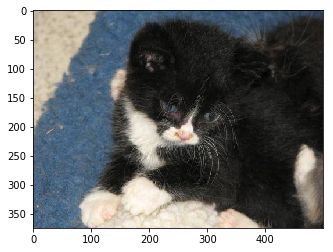

---> [TESTING] Feature extraction for image '63.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Computed prediction 'Cat'


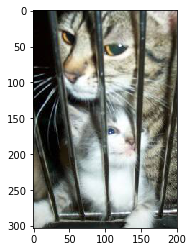

---> [TESTING] Feature extraction for image '6400.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Computed prediction 'Cat'


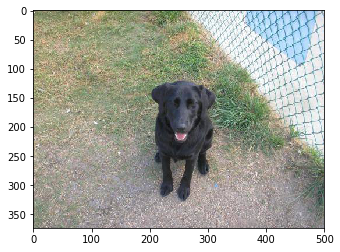

---> [TESTING] Feature extraction for image '823.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Computed prediction 'Dog'


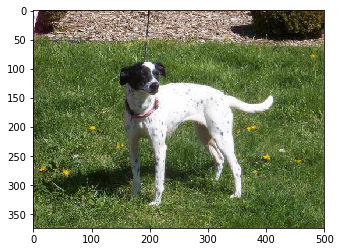

---> [TESTING] Feature extraction for image '4217.jpg'
	Convert with mysterious 'L' parameter...
	Resize '(64, 64)'
	Find Edges
	Compute histogram of image
	Computed prediction 'Cat'


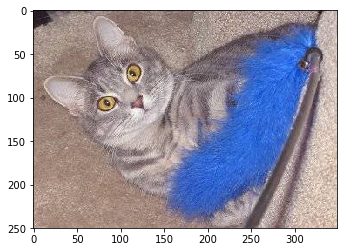

In [27]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Testing it on unlabeled data
results = []
result_images = []

for index, item in enumerate(test_images[:5]):
    print("---> [TESTING] Feature extraction for image '{}'".format(item))
    print("\tConvert with mysterious 'L' parameter...")
    image_path = os.path.join(dataset_test_dir, item)
    im = Image.open(image_path).convert('L')
    size = 64, 64
    print("\tResize '{}'".format(size))
    im = im.resize(size, Image.ANTIALIAS)
    print("\tFind Edges")
    im = im.filter(ImageFilter.FIND_EDGES)
    print("\tCompute histogram of image")
    pixel_value = im.histogram()
    x = clf.predict([pixel_value])
    results.append(x)
    print("\tComputed prediction '{}'".format(['Cat', 'Dog'][x[0]]))
    result_images.append(mpimg.imread(image_path))
    plt.figure()
    plt.imshow(result_images[-1])
    plt.show()